# 데이터 불러오기

In [ ]:
pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.4/484.4 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 10.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 68.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 72.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 71.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 94.9 MB/s eta 0:0

In [1]:
from sklearn.preprocessing import StandardScaler

C:\Users\yeji4\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\yeji4\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\yeji4\anaconda3\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
import pandas as pd
import numpy as np
from tqdm import tqdm
from pycaret.regression import *
from sklearn.preprocessing import StandardScaler
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import holidays
import matplotlib.pyplot as plt
import seaborn as sns
from pycaret.regression import *
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFE


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/Data/power

/content/drive/MyDrive/Data/power


In [3]:
train = pd.read_csv("pre_ver11/pre_train.csv", index_col = 0)
test = pd.read_csv("pre_ver11/pre_test.csv", index_col = 0)
train

,building_number,temperature,windspeed,humidity,power_consumption,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature
0,1,18.6,0.9,42.0,1085.28,1,6,2,1.000000,0.000000,False,1174.656,1774.744615,1706.318118,446.882767,63.09388,0.00000,0.00000,-7.4,20.751584
1,1,18.0,1.1,45.0,1047.36,1,6,2,0.965926,0.258819,False,1101.600,1687.347692,1622.620235,439.662704,62.46400,0.00000,0.00000,-15.4,20.008954
2,1,17.7,1.5,45.0,974.88,1,6,2,0.866025,0.500000,False,1025.760,1571.483077,1506.971294,412.071906,62.08735,0.00000,0.00000,-23.7,19.476910
3,1,16.7,1.4,48.0,953.76,1,6,2,0.707107,0.707107,False,1015.584,1522.153846,1437.365647,391.205981,60.89884,-2.19504,0.00000,-33.0,18.487958
4,1,18.4,2.8,43.0,986.40,1,6,2,0.500000,0.866025,False,1041.792,1506.793846,1447.321412,381.099697,62.88788,0.42388,0.00000,-40.6,19.751534
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,23.1,0.9,86.0,881.04,24,8,2,0.258819,-0.965926,False,1067.700,964.873846,1010.462118,161.399578,72.38034,-2.60734,-1.95542,-19.6,25.302757
203996,100,22.4,1.3,86.0,798.96,24,8,2,0.500000,-0.866025,False,951.300,882.184615,928.125176,137.566008,71.21736,-4.15064,-3.21990,-20.2,24.446518
203997,100,21.3,1.0,92.0,825.12,24,8,2,0.707107,-0.707107,False,857.760,779.095385,830.032941,128.300189,69.79704,-4.64022,-5.19064,-22.3,23.433400
203998,100,21.0,0.3,94.0,640.08,24,8,2,0.866025,-0.500000,False,717.240,663.267692,723.100235,112.464079,69.41060,-2.96974,-5.95740,-25.1,23.661275


# Pycaret

In [4]:
def smape(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    output = np.mean(v) * 100
    return output

## Building #1
---
건물별 학습을 위한 테스트

In [12]:
# 건물 1의 데이터만 사용
train_1 = train.loc[train.building_number == 1,]
train_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 0 to 2039
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null   f

In [13]:
# 'building_number' 제거 : 건물별 모델링으로, 건물 번호 필요 없음
train_1 = train_1.drop(columns = 'building_number')
train_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 0 to 2039
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   temperature          2040 non-null   float64
 1   windspeed            2040 non-null   float64
 2   humidity             2040 non-null   float64
 3   power_consumption    2040 non-null   float64
 4   day                  2040 non-null   int64  
 5   month                2040 non-null   int64  
 6   day_of_week          2040 non-null   int64  
 7   cos_time             2040 non-null   float64
 8   sin_time             2040 non-null   float64
 9   holiday              2040 non-null   bool   
 10  month_day_hour_mean  2040 non-null   float64
 11  day_hour_mean        2040 non-null   float64
 12  hour_mean            2040 non-null   float64
 13  hour_std             2040 non-null   float64
 14  discomfort           2040 non-null   float64
 15  discomfort_3         2040 non-null   f

In [14]:
# x, y 분리
train_y = train_1.power_consumption
train_x = train_1.drop(columns = 'power_consumption')

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(train_x)
# X_train_scaled = train_x

In [31]:
train.columns

Index(['building_number', 'temperature', 'windspeed', 'humidity',
       'power_consumption', 'day', 'month', 'day_of_week', 'cos_time',
       'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
       'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
       'CDH', 'sensory_temperature'],
      dtype='object')

In [15]:
col =['temperature', 'windspeed', 'humidity',
        'day', 'month', 'day_of_week', 'cos_time',
       'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
       'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
       'CDH', 'sensory_temperature']

# train_merged = x_train + y_train : setup에는 x+y 형태의 데이터 사용
train_merged = pd.DataFrame(x_train, columns = col)
train_merged['power_consumption'] = y_train
train_merged

,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature,power_consumption
0,18.6,0.9,42.0,1,6,2,1.000000,0.000000,False,1174.656,1774.744615,1706.318118,446.882767,63.09388,0.00000,0.00000,-7.4,20.751584,1085.28
1,18.0,1.1,45.0,1,6,2,0.965926,0.258819,False,1101.600,1687.347692,1622.620235,439.662704,62.46400,0.00000,0.00000,-15.4,20.008954,1047.36
2,17.7,1.5,45.0,1,6,2,0.866025,0.500000,False,1025.760,1571.483077,1506.971294,412.071906,62.08735,0.00000,0.00000,-23.7,19.476910,974.88
3,16.7,1.4,48.0,1,6,2,0.707107,0.707107,False,1015.584,1522.153846,1437.365647,391.205981,60.89884,-2.19504,0.00000,-33.0,18.487958,953.76
4,18.4,2.8,43.0,1,6,2,0.500000,0.866025,False,1041.792,1506.793846,1447.321412,381.099697,62.88788,0.42388,0.00000,-40.6,19.751534,986.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1867,27.3,2.6,67.0,17,8,2,0.258819,-0.965926,False,2748.960,2571.470769,2703.871059,377.509334,76.94009,-3.53592,-3.64865,25.0,29.451282,2652.96
1868,26.5,1.7,72.0,17,8,2,0.500000,-0.866025,False,2586.000,2391.027692,2491.979294,356.589629,76.35820,-3.22695,-2.61700,26.9,28.650553,2471.04
1869,25.7,1.5,75.0,17,8,2,0.707107,-0.707107,False,2014.320,1887.950769,1972.305882,216.680162,75.47425,-2.93914,-5.00176,26.7,27.833514,2050.08
1870,25.0,2.2,77.0,17,8,2,0.866025,-0.500000,False,1431.840,1412.861538,1473.049412,114.999557,74.59650,-2.34359,-4.98865,25.3,27.004030,1420.32


In [16]:
# pycaret setup
exp = setup(train_merged, target = 'power_consumption')

,Description,Value
0,Session id,515
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


In [17]:
# 모형 비교
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,113.2295,25303.0093,158.5781,0.9793,0.0663,0.0478,0.2830
xgboost,Extreme Gradient Boosting,115.0250,26245.8801,161.6850,0.9785,0.0656,0.0473,0.2880
et,Extra Trees Regressor,113.8528,26747.3254,163.1718,0.9782,0.0683,0.0480,0.3150
gbr,Gradient Boosting Regressor,127.5801,30226.6757,173.5805,0.9754,0.0750,0.0546,0.3000
rf,Random Forest Regressor,124.0047,30686.2790,174.8484,0.9750,0.0736,0.0522,0.3950
lasso,Lasso Regression,172.8629,51371.6766,226.4147,0.9581,0.1078,0.0776,0.2340
llar,Lasso Least Angle Regression,172.8608,51366.4547,226.4025,0.9581,0.1078,0.0776,0.2310
lr,Linear Regression,173.0689,51516.6250,226.7206,0.9580,0.1085,0.0777,0.2340
ridge,Ridge Regression,173.0176,51497.3547,226.6799,0.9580,0.1085,0.0777,0.2310
br,Bayesian Ridge,172.9812,51813.5789,227.4284,0.9577,0.1077,0.0775,0.2340


LGBMRegressor(n_jobs=-1, random_state=515)

In [18]:
# 모형 생성
lightgbm_model = create_model('lightgbm')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,108.4489,23017.0673,151.7138,0.9808,0.0749,0.0501
1,102.3615,18906.4922,137.5009,0.9864,0.0564,0.0434
2,115.9453,26072.0439,161.4684,0.9759,0.0612,0.0456
3,108.4363,20777.7793,144.1450,0.9819,0.0759,0.0556
4,120.3930,32464.6762,180.1796,0.9706,0.0685,0.0499
5,109.4495,22893.8985,151.3073,0.9812,0.0618,0.0454
6,111.8191,24782.0510,157.4232,0.9796,0.0626,0.0439
7,126.2174,30733.8521,175.3107,0.9790,0.0654,0.0498
8,109.6581,27220.2720,164.9857,0.9791,0.0676,0.0452


In [19]:
# 모델 평가
evaluate_model(lightgbm_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [70]:
test = pd.read_csv("pre_ver11/pre_test_1.csv", index_col = 0)
test

,building_number,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature
0,1,23.5,2.2,72,25,8,3,1.000000,0.000000,False,1914.40,1627.800000,1706.318118,446.882767,71.78980,0.00000,0.00000,-2.5,25.397063
1,1,23.0,0.9,72,25,8,3,0.965926,0.258819,False,1845.76,1550.080000,1622.620235,439.662704,71.02840,0.00000,0.00000,-5.5,25.201620
2,1,22.7,1.5,75,25,8,3,0.866025,0.500000,False,1695.04,1431.120000,1506.971294,412.071906,70.81675,0.00000,0.00000,-8.8,24.699788
3,1,22.1,1.3,78,25,8,3,0.707107,0.707107,False,1622.72,1372.200000,1437.365647,391.205981,70.11262,-1.67718,0.00000,-12.7,24.136018
4,1,21.8,1.0,77,25,8,3,0.500000,0.866025,False,1622.24,1381.720000,1447.321412,381.099696,69.56514,-1.46326,0.00000,-16.9,23.942400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,1,23.5,2.0,75,31,8,2,0.258819,-0.965926,False,2748.96,2571.470769,2703.871059,377.509334,72.05875,-0.67702,-0.33653,-36.5,25.432297
164,1,22.4,2.0,80,31,8,2,0.500000,-0.866025,False,2586.00,2391.027692,2491.979294,356.589629,70.74480,-3.12716,-1.55984,-34.0,24.261343
165,1,21.7,1.6,81,31,8,2,0.707107,-0.707107,False,2014.32,1887.950769,1972.305882,216.680162,69.69523,-3.76665,-3.04054,-32.6,23.624578
166,1,21.1,1.0,83,31,8,2,0.866025,-0.500000,False,1431.84,1412.861538,1473.049412,114.999557,68.85987,-3.19888,-5.01209,-33.0,23.229800


In [28]:
test = test.drop(columns = "building_number")
test_scaled = scaler.fit_transform(test)

In [53]:
test_scaled = test.drop(columns = "building_number")
test_scaled = pd.DataFrame(test_scaled, columns = col)
test_scaled

,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature
0,23.5,2.2,72,25,8,3,1.000000,0.000000,False,1914.40,1627.800000,1706.318118,446.882767,71.78980,0.00000,0.00000,-2.5,25.397063
1,23.0,0.9,72,25,8,3,0.965926,0.258819,False,1845.76,1550.080000,1622.620235,439.662704,71.02840,0.00000,0.00000,-5.5,25.201620
2,22.7,1.5,75,25,8,3,0.866025,0.500000,False,1695.04,1431.120000,1506.971294,412.071906,70.81675,0.00000,0.00000,-8.8,24.699788
3,22.1,1.3,78,25,8,3,0.707107,0.707107,False,1622.72,1372.200000,1437.365647,391.205981,70.11262,-1.67718,0.00000,-12.7,24.136018
4,21.8,1.0,77,25,8,3,0.500000,0.866025,False,1622.24,1381.720000,1447.321412,381.099696,69.56514,-1.46326,0.00000,-16.9,23.942400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,23.5,2.0,75,31,8,2,0.258819,-0.965926,False,2748.96,2571.470769,2703.871059,377.509334,72.05875,-0.67702,-0.33653,-36.5,25.432297
164,22.4,2.0,80,31,8,2,0.500000,-0.866025,False,2586.00,2391.027692,2491.979294,356.589629,70.74480,-3.12716,-1.55984,-34.0,24.261343
165,21.7,1.6,81,31,8,2,0.707107,-0.707107,False,2014.32,1887.950769,1972.305882,216.680162,69.69523,-3.76665,-3.04054,-32.6,23.624578
166,21.1,1.0,83,31,8,2,0.866025,-0.500000,False,1431.84,1412.861538,1473.049412,114.999557,68.85987,-3.19888,-5.01209,-33.0,23.229800


In [20]:
et_final = finalize_model(lightgbm_model)
submit_df = predict_model(et_final,data = x_valid)

In [72]:
submit_df

,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature,prediction_label
1872,24.100000,2.1,78.0,18,8,3,1.000000,0.000000,False,1914.400024,1627.800049,1706.318115,446.882782,73.277023,-2.19723,-3.66307,17.4,26.055113,1887.625989
1873,23.400000,2.2,82.0,18,8,3,0.965926,0.258819,False,1845.760010,1550.079956,1622.620239,439.662689,72.524117,-2.07238,-3.83408,10.7,25.289932,1814.929951
1874,23.100000,2.0,84.0,18,8,3,0.866025,0.500000,False,1695.040039,1431.119995,1506.971313,412.071899,72.208961,-1.65808,-3.26529,3.6,25.006496,1638.180321
1875,23.200001,1.9,84.0,18,8,3,0.707107,0.707107,False,1622.719971,1372.199951,1437.365601,391.205994,72.373123,-0.90390,-2.22338,-1.6,25.132774,1583.598824
1876,22.700001,2.1,87.0,18,8,3,0.500000,0.866025,False,1622.239990,1381.719971,1447.321411,381.099701,71.797508,-0.72661,-2.06953,-8.6,24.559946,1570.289994
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2035,25.500000,2.9,63.0,24,8,2,0.258819,-0.965926,False,2748.959961,2571.470703,2703.871094,377.509338,73.850349,-1.26433,-2.16863,3.1,27.475126,2553.142511
2036,25.000000,2.6,66.0,24,8,2,0.500000,-0.866025,False,2586.000000,2391.027588,2491.979248,356.589630,73.446999,-2.16391,-2.22110,4.3,26.959240,2476.169859
2037,24.600000,1.3,67.0,24,8,2,0.707107,-0.707107,False,2014.319946,1887.950806,1972.305908,216.680161,72.962181,-1.89176,-2.15250,4.2,26.723515,1996.618385
2038,24.100000,2.1,70.0,24,8,2,0.866025,-0.500000,False,1431.839966,1412.861572,1473.049438,114.999557,72.512299,-1.33805,-3.09861,2.3,26.055113,1415.763946


[Building #1]SMAPE : 3.9432222655629587


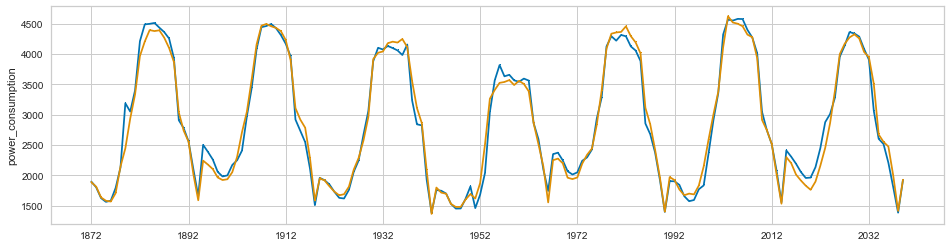

In [25]:
y = train_1.power_consumption
x = train_1.drop(columns = 'power_consumption')

print(f"[Building #1]SMAPE : {smape(y_valid, submit_df.prediction_label)}")
plot_series(y_valid,submit_df.prediction_label , markers=[',' , ','])
plt.show()

## Building #2

In [26]:
train_2 = train.loc[train.building_number == 2,]
train_2.info()

train_2 = train_2.drop(columns = 'building_number')
train_2.info()

train_y = train_2.power_consumption
train_x = train_2.drop(columns = 'power_consumption')

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)

col =['temperature', 'windspeed', 'humidity',
        'day', 'month', 'day_of_week', 'cos_time',
       'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
       'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
       'CDH', 'sensory_temperature']
X_train_scaled = pd.DataFrame(x_train, columns = col)
X_train_scaled['power_consumption'] = y_train
X_train_scaled

exp = setup(X_train_scaled, target = 'power_consumption')

# 모형 생성
#compare_models()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 2040 to 4079
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null 

,Description,Value
0,Session id,5966
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,99.1109,20062.7223,141.0957,0.9461,0.0966,0.0655,0.3040
et,Extra Trees Regressor,93.7127,20796.8743,143.1778,0.9438,0.0988,0.0625,0.3560
xgboost,Extreme Gradient Boosting,104.4004,22910.7757,150.5763,0.9383,0.1054,0.0691,0.3050
rf,Random Forest Regressor,105.4876,24921.1872,157.1453,0.9331,0.1083,0.0703,0.4380
gbr,Gradient Boosting Regressor,111.9227,25365.7461,158.7064,0.9319,0.1072,0.0735,0.3230
lr,Linear Regression,132.0771,32085.1426,178.1379,0.9138,0.1176,0.0864,0.2580
ridge,Ridge Regression,132.0903,32081.3814,178.1296,0.9138,0.1176,0.0865,0.2630
lasso,Lasso Regression,132.3958,32232.5236,178.5696,0.9135,0.1186,0.0868,0.2600
llar,Lasso Least Angle Regression,132.3981,32232.6260,178.5696,0.9134,0.1186,0.0868,0.2630
en,Elastic Net,131.8695,32510.2363,179.3240,0.9127,0.1196,0.0866,0.2590


LGBMRegressor(n_jobs=-1, random_state=5966)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,93.7127,20796.8743,143.1778,0.9438,0.0988,0.0625,0.2920
lightgbm,Light Gradient Boosting Machine,99.1109,20062.7223,141.0957,0.9461,0.0966,0.0655,0.2820
xgboost,Extreme Gradient Boosting,104.4004,22910.7757,150.5763,0.9383,0.1054,0.0691,0.2830
rf,Random Forest Regressor,105.4876,24921.1872,157.1453,0.9331,0.1083,0.0703,0.2880
gbr,Gradient Boosting Regressor,111.9227,25365.7461,158.7064,0.9319,0.1072,0.0735,0.2840
huber,Huber Regressor,131.1158,34336.3687,184.2206,0.9080,0.1201,0.0845,0.2880
lr,Linear Regression,132.0771,32085.1426,178.1379,0.9138,0.1176,0.0864,0.2890
ridge,Ridge Regression,132.0903,32081.3814,178.1296,0.9138,0.1176,0.0865,0.2930
br,Bayesian Ridge,131.9624,32693.3117,179.8269,0.9123,0.1199,0.0866,0.2810
en,Elastic Net,131.8695,32510.2363,179.3240,0.9127,0.1196,0.0866,0.2900


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,98.6690,23606.1714,153.6430,0.9303,0.1375,0.0818
1,105.9213,23116.9490,152.0426,0.9489,0.1049,0.0694
2,93.5470,19673.2824,140.2615,0.9478,0.0862,0.0582
3,103.8745,27309.2332,165.2551,0.9216,0.1001,0.0636
4,86.5480,15934.5100,126.2320,0.9585,0.0845,0.0546
5,90.4139,17567.8595,132.5438,0.9547,0.0889,0.0574
6,82.7244,14866.4237,121.9279,0.9607,0.0923,0.0586
7,90.1609,18146.8383,134.7102,0.9480,0.0953,0.0608
8,94.3200,18720.5051,136.8229,0.9440,0.0891,0.0595


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

[Building #2]SMAPE : 8.23601427949946


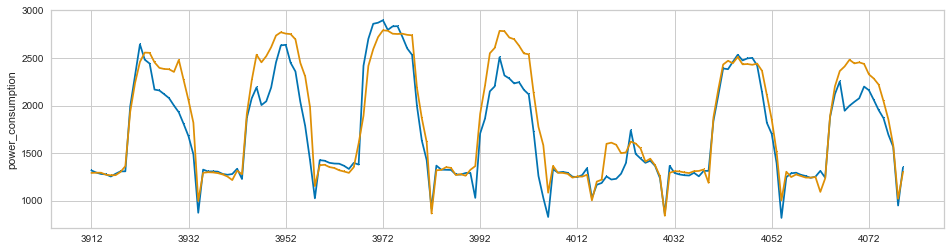

<Figure size 432x288 with 0 Axes>

In [28]:
models = compare_models(sort='MAPE', n_select=2)
#et_model = create_model('lightgbm')

blender = blend_models(estimator_list =models)
evaluate_model(blender)

et_final = finalize_model(blender)
submit_df = predict_model(et_final,data = x_valid)

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import holidays
import matplotlib.pyplot as plt
import seaborn as sns
from pycaret.regression import *
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt

y = train_2.power_consumption
x = train_2.drop(columns = 'power_consumption')

def smape(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    output = np.mean(v) * 100
    return output
print(f"[Building #2]SMAPE : {smape(y_valid, submit_df.prediction_label)}")

plot_series(y_valid,submit_df.prediction_label , markers=[',' , ','])
plt.show()


## 건물별 모델링 테스트_1
---
* 기본

### 학습

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 0 to 2039
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null   f

,Description,Value
0,Session id,985
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,112.7987,25749.7275,160.2121,0.9790,0.0672,0.0473,1.1320
et,Extra Trees Regressor,112.7323,26956.4138,163.8024,0.9780,0.0689,0.0476,1.1730
lightgbm,Light Gradient Boosting Machine,114.2495,25900.1494,160.0975,0.9787,0.0667,0.0477,1.1520
rf,Random Forest Regressor,122.4567,30735.0896,174.8662,0.9749,0.0730,0.0511,1.2610
gbr,Gradient Boosting Regressor,128.6447,30088.3010,173.0855,0.9753,0.0735,0.0545,1.1280
dt,Decision Tree Regressor,165.4434,60276.8213,244.8430,0.9512,0.1014,0.0693,1.0820
huber,Huber Regressor,175.4230,61876.2205,248.1012,0.9499,0.0953,0.0707,1.0770
omp,Orthogonal Matching Pursuit,198.7935,83832.7496,288.3233,0.9321,0.1063,0.0782,1.0900
br,Bayesian Ridge,178.6804,55390.0484,234.8152,0.9552,0.1088,0.0797,1.1140
en,Elastic Net,178.3488,55085.6812,234.1766,0.9554,0.1087,0.0797,1.0710


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,99.5716,19581.5887,139.9342,0.9860,0.0552,0.0393
1,99.7543,18659.7387,136.6007,0.9817,0.0603,0.0432
2,104.1247,23656.3322,153.8062,0.9786,0.0681,0.0445
3,104.2070,25636.4920,160.1140,0.9785,0.0642,0.0426
4,102.8865,23283.1728,152.5882,0.9821,0.0622,0.0437
5,106.6349,21643.0145,147.1157,0.9859,0.0674,0.0465
6,119.6602,28523.1833,168.8881,0.9753,0.0683,0.0493
7,110.1114,23707.9444,153.9738,0.9826,0.0749,0.0499
8,113.7649,29861.1303,172.8037,0.9758,0.0650,0.0454


Transformation Pipeline and Model Successfully Saved


[Building #1]SMAPE : 3.652183126774713


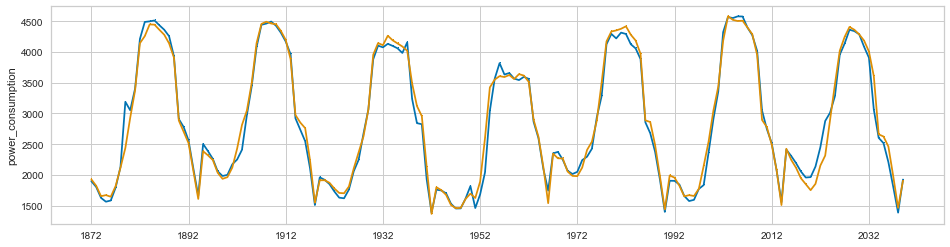

  1%|▊                                                                              | 1/100 [04:28<7:22:32, 268.20s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 2040 to 4079
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null 

,Description,Value
0,Session id,4385
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,94.5139,19677.1422,139.5449,0.9474,0.0946,0.0620,1.1770
lightgbm,Light Gradient Boosting Machine,96.9084,19326.3831,138.4717,0.9482,0.0960,0.0641,1.1770
xgboost,Extreme Gradient Boosting,102.9636,21654.8760,146.6017,0.9418,0.1024,0.0685,1.1920
rf,Random Forest Regressor,105.1152,23588.9483,153.0470,0.9365,0.1043,0.0694,1.2580
gbr,Gradient Boosting Regressor,111.9507,24467.5944,156.0606,0.9345,0.1055,0.0739,1.1440
huber,Huber Regressor,133.7901,34511.3836,184.6477,0.9078,0.1213,0.0864,1.1110
dt,Decision Tree Regressor,132.9995,43760.7267,208.2248,0.8807,0.1404,0.0866,1.0860
lr,Linear Regression,133.2379,32218.7695,178.6657,0.9137,0.1187,0.0875,1.0830
ridge,Ridge Regression,133.2301,32211.4479,178.6454,0.9137,0.1187,0.0875,1.0820
en,Elastic Net,133.2126,32585.1354,179.6284,0.9127,0.1203,0.0876,1.0830


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,94.8828,17155.6738,130.9797,0.9582,0.0809,0.0593
1,87.9198,13962.6768,118.1638,0.9662,0.0756,0.0555
2,85.3839,15421.9465,124.1851,0.9637,0.0790,0.0534
3,104.9655,25416.5913,159.4258,0.9300,0.1178,0.0732
4,98.9579,20018.1156,141.4854,0.9477,0.0884,0.0618
5,95.9774,21910.5827,148.0222,0.9402,0.1037,0.0631
6,87.4658,17505.0802,132.3068,0.9500,0.0926,0.0559
7,97.8887,21614.8012,147.0197,0.9477,0.0933,0.0607
8,83.3716,14389.1526,119.9548,0.9464,0.0938,0.0630


Transformation Pipeline and Model Successfully Saved


[Building #2]SMAPE : 8.255282189462603


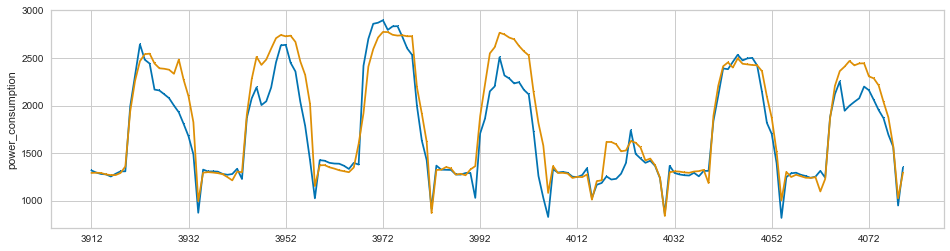

  2%|█▌                                                                             | 2/100 [08:52<7:13:59, 265.71s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 4080 to 6119
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null 

,Description,Value
0,Session id,4008
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,115.8479,35868.8658,186.0093,0.9132,0.1129,0.0787,1.1710
xgboost,Extreme Gradient Boosting,118.7323,37644.9076,190.1883,0.9094,0.1165,0.0806,1.2080
et,Extra Trees Regressor,128.6360,46997.9051,212.9535,0.8859,0.1303,0.0882,1.1800
gbr,Gradient Boosting Regressor,131.3029,41791.5995,202.0826,0.8982,0.1247,0.0910,1.1600
rf,Random Forest Regressor,135.4765,47082.4188,213.7204,0.8854,0.1317,0.0928,1.2670
dt,Decision Tree Regressor,176.7087,93497.5560,301.2329,0.7734,0.1834,0.1177,1.0950
br,Bayesian Ridge,187.4421,80433.5387,281.7200,0.8028,0.1702,0.1299,1.0990
huber,Huber Regressor,185.9431,82870.5409,285.8348,0.7969,0.1724,0.1302,1.1000
en,Elastic Net,187.3049,79152.2348,279.5617,0.8058,0.1704,0.1309,1.0950
lasso,Lasso Regression,189.0227,78393.7500,278.1779,0.8077,0.1704,0.1321,1.0920


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,124.1349,54881.8064,234.2687,0.8728,0.1363,0.0841
1,99.3301,23424.3525,153.0502,0.9406,0.0916,0.0648
2,114.2691,29840.5296,172.7441,0.9226,0.1117,0.0775
3,118.5601,36160.6573,190.1596,0.9111,0.1131,0.0797
4,120.6892,34012.2265,184.4240,0.9140,0.1198,0.0852
5,83.7712,14144.4844,118.9306,0.9555,0.0818,0.0610
6,137.1277,53024.4387,230.2704,0.8807,0.1355,0.0927
7,133.1530,48780.3745,220.8628,0.8987,0.1230,0.0842
8,87.5505,18687.2412,136.7013,0.9529,0.0864,0.0619


Transformation Pipeline and Model Successfully Saved


[Building #3]SMAPE : 11.1873574679041


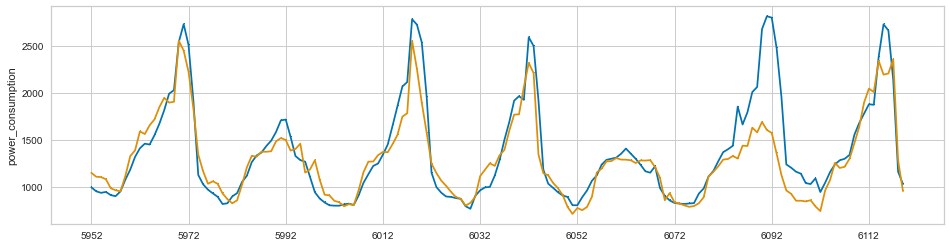

  3%|██▎                                                                            | 3/100 [13:17<7:09:24, 265.62s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 6120 to 8159
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null 

,Description,Value
0,Session id,2192
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,33.9505,1886.4204,43.3850,0.9767,0.0457,0.0359,1.2420
xgboost,Extreme Gradient Boosting,34.0623,1891.4161,43.4112,0.9766,0.0460,0.0361,1.1980
gbr,Gradient Boosting Regressor,35.2283,2000.9689,44.6814,0.9752,0.0477,0.0376,1.1790
et,Extra Trees Regressor,35.4044,2109.6341,45.8032,0.9739,0.0491,0.0378,1.1990
rf,Random Forest Regressor,36.6081,2257.1235,47.3997,0.9721,0.0500,0.0388,1.2750
knn,K Neighbors Regressor,41.7812,2952.8609,54.1708,0.9635,0.0563,0.0437,1.1270
lasso,Lasso Regression,43.0017,3005.0942,54.7215,0.9629,0.0572,0.0452,1.1090
llar,Lasso Least Angle Regression,43.0054,3004.8285,54.7188,0.9629,0.0572,0.0452,1.1100
ridge,Ridge Regression,42.9822,2983.8352,54.5303,0.9632,0.0573,0.0453,1.1160
lr,Linear Regression,42.9957,2984.7571,54.5391,0.9632,0.0573,0.0454,1.1170


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,30.0281,1544.0588,39.2945,0.9788,0.0418,0.0325
1,34.9332,1959.4518,44.2657,0.9772,0.0470,0.0364
2,32.8148,1710.7903,41.3617,0.9813,0.0424,0.0343
3,33.7293,1897.6740,43.5623,0.9776,0.0460,0.0360
4,35.0215,1934.1162,43.9786,0.9709,0.0491,0.0399
5,30.0793,1565.2246,39.5629,0.9824,0.0392,0.0306
6,33.8749,1827.7470,42.7522,0.9768,0.0491,0.0374
7,33.6289,1976.1505,44.4539,0.9773,0.0425,0.0329
8,32.9076,1722.4278,41.5021,0.9780,0.0438,0.0340


Transformation Pipeline and Model Successfully Saved


[Building #4]SMAPE : 4.734759963525109


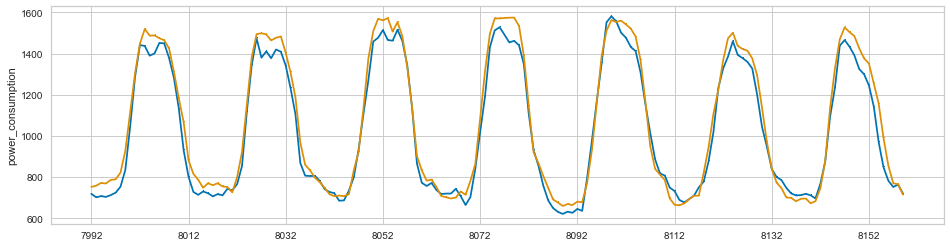

  4%|███▏                                                                           | 4/100 [17:47<7:07:26, 267.15s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 8160 to 10199
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-null

,Description,Value
0,Session id,885
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,125.5704,60419.8139,237.5258,0.9789,0.0817,0.0465,1.2010
xgboost,Extreme Gradient Boosting,137.0728,70782.8562,257.5855,0.9752,0.0882,0.0511,1.2150
lightgbm,Light Gradient Boosting Machine,137.6948,64455.9554,246.1598,0.9776,0.0849,0.0522,1.2230
rf,Random Forest Regressor,149.1738,92794.9138,293.5793,0.9679,0.0990,0.0563,1.3160
gbr,Gradient Boosting Regressor,156.4993,89789.4627,290.3802,0.9689,0.0983,0.0601,1.1800
huber,Huber Regressor,169.3187,98670.9355,305.7351,0.9657,0.1053,0.0647,1.1270
en,Elastic Net,173.7971,95431.6660,300.9419,0.9668,0.1059,0.0682,1.1430
br,Bayesian Ridge,174.4720,96679.8488,303.0160,0.9663,0.1066,0.0685,1.1950
llar,Lasso Least Angle Regression,175.3319,94606.6570,299.4002,0.9671,0.1062,0.0694,1.1330
lasso,Lasso Regression,175.3805,94608.4469,299.4045,0.9671,0.1062,0.0695,1.1340


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,172.5790,118931.9608,344.8651,0.9595,0.1218,0.0660
1,121.2519,39844.5302,199.6109,0.9875,0.0785,0.0486
2,107.9754,55291.3983,235.1412,0.9795,0.0748,0.0371
3,93.7395,27952.3549,167.1896,0.9884,0.0723,0.0416
4,103.3655,29608.4502,172.0711,0.9927,0.0570,0.0348
5,132.4461,98671.3068,314.1199,0.9624,0.0955,0.0491
6,110.7589,39404.9585,198.5068,0.9831,0.0605,0.0381
7,135.7918,63023.9352,251.0457,0.9776,0.0905,0.0527
8,140.7238,57731.2888,240.2734,0.9802,0.0767,0.0466


Transformation Pipeline and Model Successfully Saved


[Building #5]SMAPE : 4.185532395656325


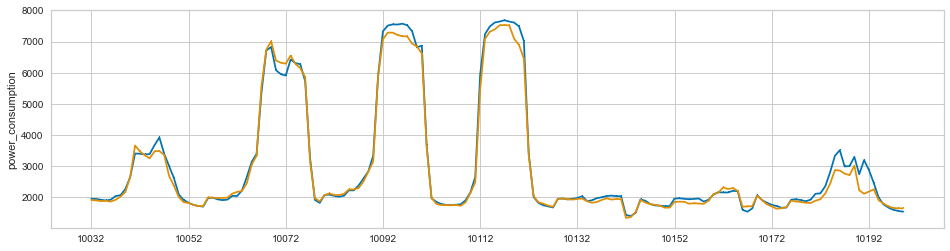

  5%|███▉                                                                           | 5/100 [22:22<7:07:56, 270.28s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 10200 to 12239
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3587
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,56.4256,6986.5909,82.8890,0.9881,0.0407,0.0296,1.2350
xgboost,Extreme Gradient Boosting,57.2999,7505.6842,86.0657,0.9872,0.0418,0.0298,1.2480
et,Extra Trees Regressor,56.2644,7522.9578,86.1517,0.9871,0.0447,0.0304,1.2240
gbr,Gradient Boosting Regressor,63.9521,9137.0627,95.2946,0.9843,0.0449,0.0328,1.2020
rf,Random Forest Regressor,64.2734,9225.6594,95.6300,0.9842,0.0475,0.0337,1.3280
lr,Linear Regression,77.9414,13284.0837,114.8932,0.9772,0.0532,0.0396,1.1510
lasso,Lasso Regression,77.9924,13266.3592,114.8189,0.9772,0.0529,0.0396,1.1470
ridge,Ridge Regression,77.9318,13281.0903,114.8804,0.9772,0.0532,0.0396,1.1460
llar,Lasso Least Angle Regression,78.0002,13268.8805,114.8276,0.9772,0.0529,0.0396,1.1490
br,Bayesian Ridge,78.6481,13386.3849,115.3651,0.9770,0.0532,0.0399,1.2380


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,58.6314,7644.0247,87.4301,0.9867,0.0426,0.0306
1,43.1600,4173.9993,64.6065,0.9934,0.0320,0.0235
2,56.1712,5862.4297,76.5665,0.9902,0.0404,0.0305
3,56.9300,7893.5891,88.8459,0.9847,0.0434,0.0301
4,51.7885,6123.3496,78.2518,0.9893,0.0383,0.0273
5,54.3815,6334.8254,79.5916,0.9903,0.0388,0.0285
6,59.4818,8339.1950,91.3192,0.9854,0.0425,0.0301
7,53.8345,6663.1194,81.6279,0.9896,0.0394,0.0271
8,59.7791,8811.0105,93.8670,0.9847,0.0449,0.0310


Transformation Pipeline and Model Successfully Saved


[Building #6]SMAPE : 4.17705629483025


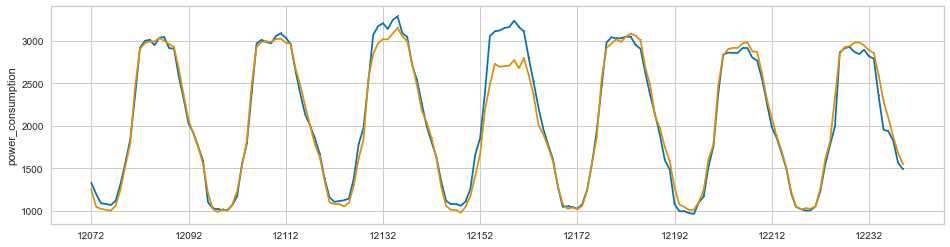

  6%|████▋                                                                          | 6/100 [27:00<7:07:12, 272.69s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 12240 to 14279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4331
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,39.5415,3423.6264,58.1178,0.9600,0.0790,0.0549,1.2690
et,Extra Trees Regressor,40.5259,4243.2117,64.4444,0.9506,0.0875,0.0558,1.2450
xgboost,Extreme Gradient Boosting,40.8507,3594.5447,59.6569,0.9579,0.0818,0.0562,1.2510
rf,Random Forest Regressor,44.7414,4903.2475,69.2701,0.9427,0.0938,0.0616,1.3230
gbr,Gradient Boosting Regressor,47.5418,4661.2311,67.8314,0.9456,0.0965,0.0686,1.2180
dt,Decision Tree Regressor,56.5451,8416.4061,91.3701,0.9013,0.1258,0.0783,1.1590
knn,K Neighbors Regressor,59.1595,8176.5403,89.8670,0.9045,0.1277,0.0829,1.1680
huber,Huber Regressor,61.6498,8123.4625,89.6200,0.9049,0.1281,0.0861,1.1880
en,Elastic Net,61.7607,7581.7569,86.6622,0.9113,0.1234,0.0879,1.1640
omp,Orthogonal Matching Pursuit,64.5102,8629.0738,92.5393,0.8990,0.1264,0.0885,1.2000


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,41.5355,5621.8641,74.9791,0.9398,0.0939,0.0561
1,34.0211,2699.1552,51.9534,0.9672,0.0776,0.0486
2,41.2011,3591.9856,59.9332,0.9558,0.0896,0.0587
3,40.5347,3461.8962,58.8379,0.9591,0.0736,0.0538
4,38.8634,4536.0651,67.3503,0.9472,0.0840,0.0501
5,37.5093,2970.6974,54.5041,0.9637,0.0696,0.0503
6,41.6281,4619.6502,67.9680,0.9463,0.1017,0.0626
7,34.0317,2897.7274,53.8305,0.9688,0.0720,0.0491
8,35.8723,2509.1043,50.0910,0.9696,0.0674,0.0478


Transformation Pipeline and Model Successfully Saved


[Building #7]SMAPE : 7.452881033383313


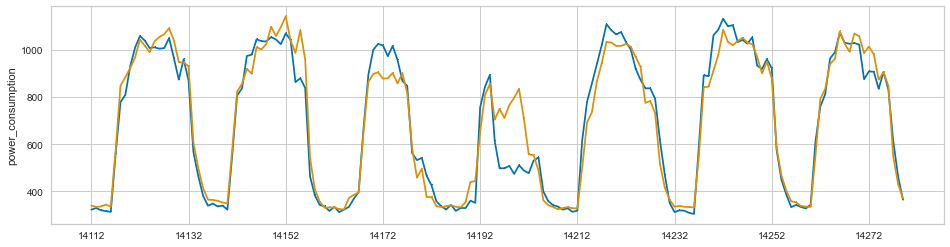

  7%|█████▌                                                                         | 7/100 [31:41<7:07:11, 275.61s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 14280 to 16319
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3292
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,51.4212,4969.4107,70.3813,0.8407,0.0543,0.0396,1.2640
et,Extra Trees Regressor,51.9161,5227.0543,72.0871,0.8328,0.0553,0.0400,1.2590
xgboost,Extreme Gradient Boosting,53.4534,5143.6859,71.6552,0.8355,0.0552,0.0411,1.2600
gbr,Gradient Boosting Regressor,54.2271,5093.5556,71.2895,0.8367,0.0552,0.0418,1.2370
rf,Random Forest Regressor,54.5315,5623.2238,74.7613,0.8199,0.0577,0.0421,1.3400
lr,Linear Regression,58.7683,6330.1210,79.3219,0.7963,0.0617,0.0456,1.1760
lasso,Lasso Regression,58.7069,6342.2935,79.3720,0.7960,0.0618,0.0456,1.1740
ridge,Ridge Regression,58.7637,6329.5989,79.3182,0.7964,0.0617,0.0456,1.1740
llar,Lasso Least Angle Regression,58.7062,6342.1952,79.3714,0.7960,0.0618,0.0456,1.1790
br,Bayesian Ridge,58.8202,6355.6405,79.4567,0.7956,0.0619,0.0457,1.1720


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49.7138,3975.0239,63.0478,0.8575,0.0476,0.0374
1,46.5533,4753.0103,68.9421,0.8109,0.0536,0.0360
2,54.1004,5951.6373,77.1469,0.8159,0.0585,0.0413
3,47.5747,3979.0223,63.0795,0.8827,0.0488,0.0368
4,48.6272,5233.4296,72.3424,0.8415,0.0561,0.0384
5,49.7448,4744.0740,68.8772,0.8548,0.0551,0.0391
6,50.3138,4515.1659,67.1950,0.8602,0.0511,0.0384
7,47.9923,4422.0854,66.4988,0.8672,0.0485,0.0356
8,54.2479,5601.3421,74.8421,0.8328,0.0600,0.0430


Transformation Pipeline and Model Successfully Saved


[Building #8]SMAPE : 4.248887698356575


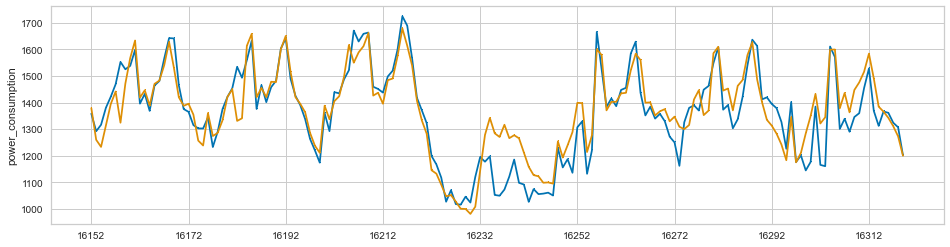

  8%|██████▎                                                                        | 8/100 [36:25<7:06:22, 278.07s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 16320 to 18359
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2627
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,63.5407,9207.7135,95.5159,0.9875,0.0401,0.0283,1.2640
et,Extra Trees Regressor,63.6672,9681.7375,97.6689,0.9869,0.0421,0.0285,1.2640
xgboost,Extreme Gradient Boosting,69.1833,10946.9042,103.8963,0.9851,0.0441,0.0306,1.2670
rf,Random Forest Regressor,73.1735,13063.9802,113.7304,0.9822,0.0478,0.0324,1.3490
gbr,Gradient Boosting Regressor,74.1270,13078.9488,113.7066,0.9822,0.0480,0.0331,1.2560
dt,Decision Tree Regressor,93.1453,23632.4031,150.8430,0.9678,0.0640,0.0417,1.1870
knn,K Neighbors Regressor,111.5390,30912.1178,174.5029,0.9579,0.0710,0.0481,1.1970
ridge,Ridge Regression,108.6221,23163.9664,151.9432,0.9686,0.0742,0.0516,1.1870
llar,Lasso Least Angle Regression,108.4894,23211.8322,152.0774,0.9685,0.0739,0.0516,1.1860
br,Bayesian Ridge,108.4115,23173.8730,151.9707,0.9686,0.0739,0.0516,1.1840


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,56.4475,8079.8689,89.8881,0.9895,0.0358,0.0238
1,57.7880,7965.5066,89.2497,0.9883,0.0375,0.0255
2,61.5692,9503.2171,97.4844,0.9877,0.0401,0.0266
3,60.9333,8242.9126,90.7905,0.9890,0.0421,0.0287
4,53.6102,6412.8989,80.0806,0.9916,0.0325,0.0232
5,67.1115,9424.4498,97.0796,0.9861,0.0417,0.0300
6,69.4491,11147.9841,105.5840,0.9836,0.0437,0.0310
7,56.3424,7444.0210,86.2787,0.9904,0.0379,0.0265
8,51.8695,5874.4750,76.6451,0.9923,0.0344,0.0241


Transformation Pipeline and Model Successfully Saved


[Building #9]SMAPE : 4.600066125575188


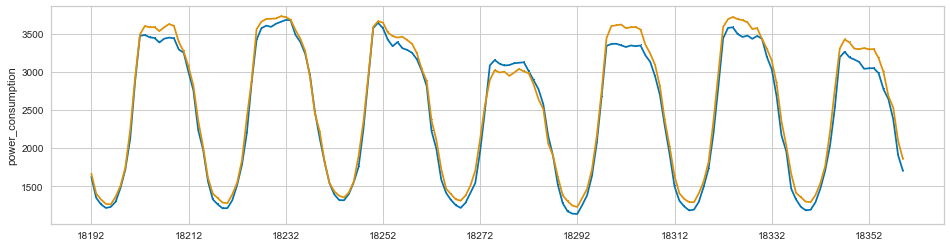

  9%|███████                                                                        | 9/100 [41:10<7:05:13, 280.37s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 18360 to 20399
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3154
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,116.8121,24364.0740,155.8015,0.9275,0.0403,0.0297,1.2840
lightgbm,Light Gradient Boosting Machine,117.9709,23323.3508,152.2654,0.9311,0.0386,0.0297,1.3210
xgboost,Extreme Gradient Boosting,121.2553,24779.1240,156.9638,0.9266,0.0406,0.0308,1.3200
rf,Random Forest Regressor,130.0450,28615.2589,168.8617,0.9150,0.0431,0.0328,1.3620
gbr,Gradient Boosting Regressor,140.3480,31147.7010,176.0373,0.9078,0.0445,0.0352,1.2800
dt,Decision Tree Regressor,166.0078,54423.6402,231.8344,0.8371,0.0593,0.0419,1.2010
ada,AdaBoost Regressor,197.9228,58432.4141,241.2311,0.8272,0.0623,0.0506,1.2300
ridge,Ridge Regression,256.7538,96159.8836,309.8715,0.7139,0.0795,0.0653,1.2160
llar,Lasso Least Angle Regression,256.4535,95976.6320,309.5819,0.7144,0.0796,0.0653,1.2030
lr,Linear Regression,256.7639,96177.0219,309.8987,0.7138,0.0795,0.0653,1.2110


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,105.0235,17931.1307,133.9072,0.9472,0.0354,0.0272
1,122.0732,26592.8282,163.0731,0.9277,0.0437,0.0318
2,118.6124,25680.1794,160.2504,0.9378,0.0422,0.0310
3,114.8949,21928.1596,148.0816,0.9358,0.0367,0.0285
4,105.8912,18817.8387,137.1781,0.9453,0.0335,0.0259
5,115.6592,23190.1988,152.2833,0.9249,0.0370,0.0284
6,110.8590,19922.2441,141.1462,0.9386,0.0343,0.0271
7,112.7116,22069.9210,148.5595,0.9285,0.0380,0.0281
8,103.3833,18141.9297,134.6920,0.9460,0.0363,0.0266


Transformation Pipeline and Model Successfully Saved


[Building #10]SMAPE : 9.27991543028389


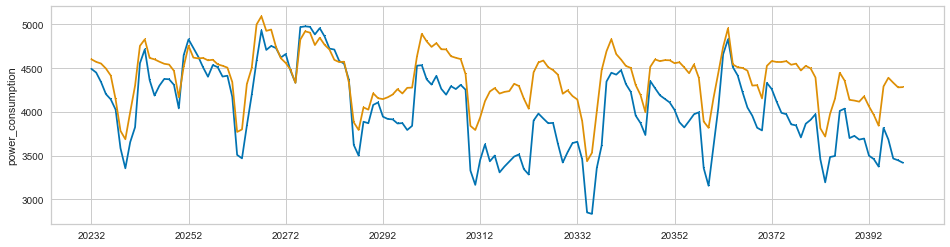

 10%|███████▊                                                                      | 10/100 [46:02<7:05:47, 283.86s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 20400 to 22439
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7458
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,46.4560,5592.1131,72.5564,0.9454,0.0407,0.0249,1.2980
xgboost,Extreme Gradient Boosting,50.1797,7246.4115,82.5449,0.9281,0.0471,0.0269,1.3070
gbr,Gradient Boosting Regressor,52.2840,6634.7985,79.2810,0.9345,0.0444,0.0281,1.2590
et,Extra Trees Regressor,52.3662,7866.7643,85.5545,0.9218,0.0483,0.0281,1.2890
rf,Random Forest Regressor,55.2082,7432.6391,84.1420,0.9266,0.0468,0.0296,1.3780
llar,Lasso Least Angle Regression,58.3753,7082.5866,82.4926,0.9302,0.0456,0.0312,1.2070
ridge,Ridge Regression,58.3011,7057.5037,82.3367,0.9306,0.0455,0.0312,1.2130
br,Bayesian Ridge,58.2625,7061.0471,82.3533,0.9305,0.0455,0.0312,1.2070
lr,Linear Regression,58.3080,7058.1923,82.3411,0.9306,0.0455,0.0312,1.2120
lasso,Lasso Regression,58.3760,7082.9955,82.4955,0.9302,0.0456,0.0312,1.2110


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49.7943,7755.6004,88.0659,0.9255,0.0580,0.0291
1,44.0248,4545.1452,67.4177,0.9455,0.0401,0.0234
2,46.8921,4102.6518,64.0519,0.9592,0.0333,0.0246
3,46.8963,5381.3666,73.3578,0.9524,0.0445,0.0253
4,43.1107,6088.9190,78.0315,0.9325,0.0378,0.0215
5,39.4266,4099.8498,64.0301,0.9569,0.0336,0.0202
6,49.5206,4942.0636,70.2998,0.9493,0.0391,0.0258
7,53.6077,15843.7270,125.8719,0.8609,0.0770,0.0322
8,37.2293,2370.9922,48.6928,0.9771,0.0249,0.0191


Transformation Pipeline and Model Successfully Saved


[Building #11]SMAPE : 2.9487612297766335


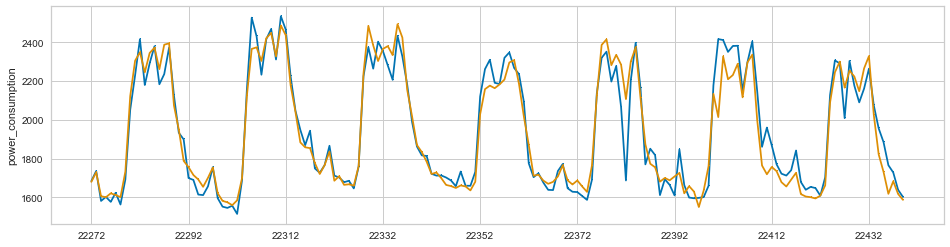

 11%|████████▌                                                                     | 11/100 [50:53<7:04:08, 285.94s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 22440 to 24479
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,6624
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,41.3498,3301.7770,57.1691,0.9565,0.0399,0.0288,1.3340
et,Extra Trees Regressor,42.4707,3807.7097,61.0859,0.9501,0.0424,0.0296,1.2930
xgboost,Extreme Gradient Boosting,44.0210,3620.1375,60.0007,0.9525,0.0419,0.0307,1.3350
rf,Random Forest Regressor,47.3357,4484.4014,66.5883,0.9410,0.0464,0.0331,1.3900
gbr,Gradient Boosting Regressor,50.4620,4617.4362,67.6869,0.9393,0.0466,0.0351,1.2910
lasso,Lasso Regression,66.4158,8310.3650,90.9449,0.8904,0.0624,0.0466,1.2180
llar,Lasso Least Angle Regression,66.4164,8310.6753,90.9466,0.8904,0.0624,0.0466,1.2250
br,Bayesian Ridge,66.4534,8322.0210,91.0107,0.8903,0.0624,0.0466,1.2540
ridge,Ridge Regression,66.7652,8295.4611,90.8798,0.8906,0.0624,0.0469,1.2240
lr,Linear Regression,66.7841,8297.4863,90.8913,0.8906,0.0624,0.0469,1.2190


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49.0438,4262.6123,65.2887,0.9483,0.0437,0.0330
1,41.3155,2887.0896,53.7316,0.9619,0.0373,0.0289
2,33.6394,2009.1965,44.8241,0.9714,0.0314,0.0233
3,39.9023,3702.7258,60.8500,0.9545,0.0439,0.0286
4,41.7734,4267.7895,65.3283,0.9456,0.0475,0.0300
5,33.8706,2019.1763,44.9352,0.9725,0.0310,0.0234
6,43.2301,3986.1059,63.1356,0.9411,0.0423,0.0293
7,38.1979,2575.9373,50.7537,0.9655,0.0339,0.0261
8,38.3565,2802.6249,52.9398,0.9623,0.0366,0.0264


Transformation Pipeline and Model Successfully Saved


[Building #12]SMAPE : 3.5844897946683405


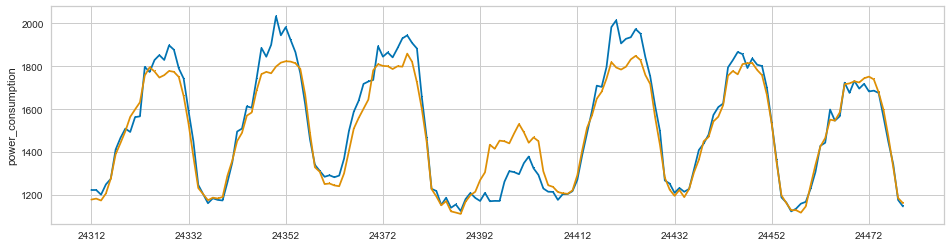

 12%|█████████▎                                                                    | 12/100 [55:48<7:03:46, 288.93s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 24480 to 26519
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2606
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,103.5010,17610.8506,132.5359,0.8511,0.0555,0.0425,1.3190
xgboost,Extreme Gradient Boosting,108.8152,20088.8300,141.3263,0.8300,0.0592,0.0446,1.3410
et,Extra Trees Regressor,108.8560,20479.5422,142.7210,0.8276,0.0598,0.0448,1.3520
rf,Random Forest Regressor,120.0584,23585.3561,153.3746,0.8013,0.0639,0.0493,1.4020
gbr,Gradient Boosting Regressor,126.2116,25206.2165,158.4463,0.7872,0.0662,0.0519,1.2960
dt,Decision Tree Regressor,150.4663,43573.4265,207.8861,0.6341,0.0865,0.0617,1.2750
br,Bayesian Ridge,163.9585,41542.1174,203.5917,0.6515,0.0846,0.0674,1.2490
ridge,Ridge Regression,164.2474,41503.3383,203.4464,0.6519,0.0845,0.0675,1.2420
llar,Lasso Least Angle Regression,164.2740,41532.8904,203.5475,0.6516,0.0846,0.0675,1.2380
lr,Linear Regression,164.2868,41522.6104,203.4897,0.6518,0.0845,0.0675,1.2430


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,92.3213,12664.6080,112.5371,0.9096,0.0490,0.0391
1,102.7627,17361.4156,131.7627,0.8389,0.0561,0.0431
2,111.5468,20767.5267,144.1094,0.8154,0.0610,0.0457
3,102.8483,17354.7762,131.7375,0.8610,0.0536,0.0416
4,102.4767,15742.2848,125.4683,0.8823,0.0516,0.0420
5,99.8013,17644.6279,132.8331,0.8452,0.0550,0.0405
6,100.5523,17139.6912,130.9186,0.8547,0.0527,0.0399
7,108.4699,20018.3722,141.4863,0.8263,0.0629,0.0453
8,99.7075,16870.6791,129.8872,0.8391,0.0525,0.0395


Transformation Pipeline and Model Successfully Saved


[Building #13]SMAPE : 7.477140857790938


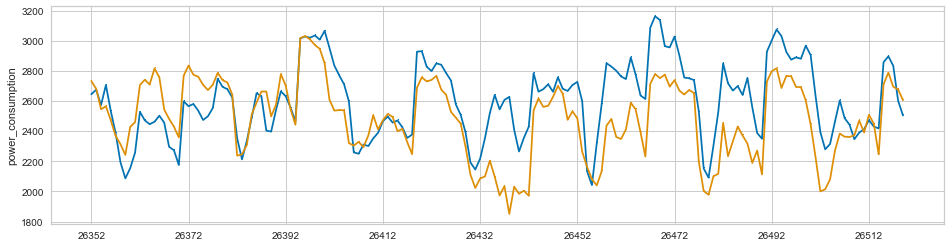

 13%|█████████▉                                                                  | 13/100 [1:00:47<7:03:07, 291.81s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 26520 to 28559
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,6023
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,195.1728,63031.3500,250.2224,0.6602,0.1421,0.1106,1.3660
lightgbm,Light Gradient Boosting Machine,195.4300,62426.5979,249.4117,0.6628,0.1409,0.1109,1.3460
rf,Random Forest Regressor,210.1167,69321.9393,262.7905,0.6256,0.1485,0.1194,1.4430
et,Extra Trees Regressor,209.0818,70453.3277,264.6034,0.6200,0.1508,0.1195,1.3420
gbr,Gradient Boosting Regressor,214.3989,72243.2946,267.9869,0.6107,0.1498,0.1215,1.3220
en,Elastic Net,237.7966,88801.8949,297.1334,0.5207,0.1657,0.1347,1.2600
lasso,Lasso Regression,238.5599,88975.5137,297.4492,0.5197,0.1658,0.1351,1.2580
llar,Lasso Least Angle Regression,238.5596,88975.9613,297.4499,0.5197,0.1658,0.1351,1.2600
br,Bayesian Ridge,239.1251,88936.4078,297.3925,0.5198,0.1659,0.1354,1.2630
ridge,Ridge Regression,239.1210,89314.6910,298.0369,0.5179,0.1662,0.1354,1.2550


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,196.0775,64467.2472,253.9040,0.6772,0.1481,0.1169
1,183.9353,54263.1296,232.9445,0.6881,0.1328,0.1033
2,186.9030,57298.5041,239.3711,0.7198,0.1405,0.1114
3,200.0497,62155.8902,249.3108,0.6707,0.1357,0.1087
4,175.4629,55401.0184,235.3742,0.7013,0.1302,0.0967
5,183.9403,55861.3281,236.3500,0.7107,0.1408,0.1085
6,189.8125,57191.0307,239.1465,0.6984,0.1317,0.1049
7,202.3615,64559.8538,254.0863,0.6350,0.1436,0.1157
8,206.7199,73533.9871,271.1715,0.6040,0.1538,0.1186


Transformation Pipeline and Model Successfully Saved


[Building #14]SMAPE : 17.712297487845667


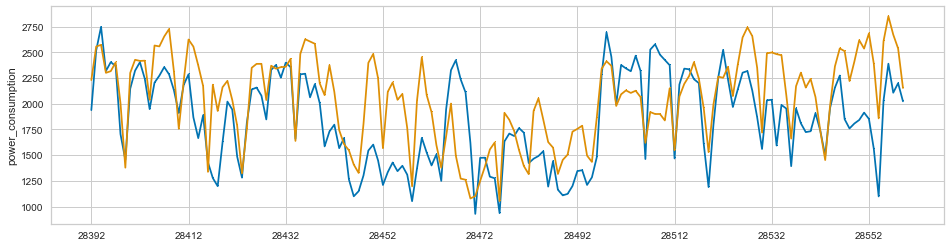

 14%|██████████▋                                                                 | 14/100 [1:05:49<7:02:51, 295.02s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 28560 to 30599
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3699
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,41.0947,3319.0168,57.1046,0.9448,0.0343,0.0240,1.3980
xgboost,Extreme Gradient Boosting,41.8691,3218.5149,56.3712,0.9465,0.0336,0.0244,1.3500
et,Extra Trees Regressor,42.2012,4000.0086,62.3836,0.9333,0.0376,0.0248,1.3520
gbr,Gradient Boosting Regressor,44.1711,3776.0908,61.0425,0.9371,0.0362,0.0257,1.3360
rf,Random Forest Regressor,46.3243,4426.2831,65.9191,0.9261,0.0398,0.0272,1.4440
lasso,Lasso Regression,54.6325,5418.5819,73.1949,0.9098,0.0440,0.0322,1.2720
ridge,Ridge Regression,54.8427,5369.2125,72.9139,0.9107,0.0437,0.0322,1.2730
llar,Lasso Least Angle Regression,54.6404,5420.1098,73.2061,0.9098,0.0440,0.0322,1.2760
br,Bayesian Ridge,54.6848,5372.0973,72.9124,0.9106,0.0438,0.0322,1.2970
lr,Linear Regression,54.8701,5370.3482,72.9244,0.9106,0.0437,0.0323,1.2820


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,41.6649,3051.9281,55.2443,0.9533,0.0345,0.0249
1,48.4773,4892.4445,69.9460,0.9237,0.0431,0.0290
2,34.2077,2145.8657,46.3235,0.9643,0.0280,0.0198
3,39.5134,2619.4484,51.1805,0.9600,0.0296,0.0226
4,36.3826,2430.5852,49.3010,0.9600,0.0292,0.0212
5,36.9394,2644.5999,51.4257,0.9548,0.0306,0.0212
6,41.9392,3822.5480,61.8268,0.9329,0.0388,0.0256
7,42.5705,3455.3573,58.7823,0.9356,0.0353,0.0245
8,36.1140,2304.1231,48.0013,0.9588,0.0267,0.0201


Transformation Pipeline and Model Successfully Saved


[Building #15]SMAPE : 2.863545165075331


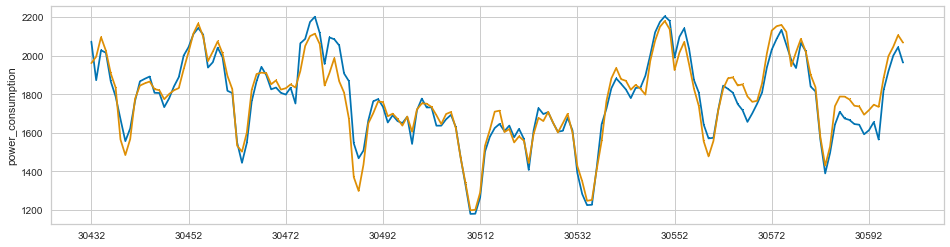

 15%|███████████▍                                                                | 15/100 [1:10:56<7:03:00, 298.59s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 30600 to 32639
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,8964
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,96.8857,24918.8211,155.2087,0.9881,0.0494,0.0320,1.3940
lightgbm,Light Gradient Boosting Machine,99.4702,22458.1466,148.1972,0.9892,0.0476,0.0330,1.3910
rf,Random Forest Regressor,102.1031,24606.5087,155.3848,0.9882,0.0497,0.0335,1.4730
xgboost,Extreme Gradient Boosting,107.1563,25076.1273,157.2761,0.9879,0.0514,0.0356,1.3900
gbr,Gradient Boosting Regressor,114.3939,27976.0869,165.9065,0.9865,0.0529,0.0372,1.3530
dt,Decision Tree Regressor,142.9409,49265.8720,220.1207,0.9764,0.0696,0.0465,1.3030
knn,K Neighbors Regressor,166.2040,66992.1539,256.9150,0.9679,0.0739,0.0500,1.3380
omp,Orthogonal Matching Pursuit,191.1347,83481.3395,287.4564,0.9599,0.0800,0.0566,1.3070
ada,AdaBoost Regressor,173.8236,52237.5095,228.1711,0.9750,0.0718,0.0569,1.3260
huber,Huber Regressor,173.5120,60417.7919,243.9153,0.9710,0.0822,0.0583,1.3040


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,85.9848,15893.4677,126.0693,0.9922,0.0361,0.0260
1,93.8412,22181.8349,148.9357,0.9903,0.0446,0.0296
2,110.1298,37070.4694,192.5369,0.9822,0.0628,0.0360
3,87.3281,15328.9748,123.8102,0.9927,0.0430,0.0305
4,105.8033,27616.8051,166.1830,0.9872,0.0546,0.0373
5,90.2864,14932.2938,122.1978,0.9924,0.0398,0.0297
6,105.0776,35186.3898,187.5804,0.9818,0.0611,0.0376
7,81.1088,15091.8244,122.8488,0.9933,0.0392,0.0267
8,89.7893,19491.3288,139.6113,0.9909,0.0435,0.0295


Transformation Pipeline and Model Successfully Saved


[Building #16]SMAPE : 5.759903572505324


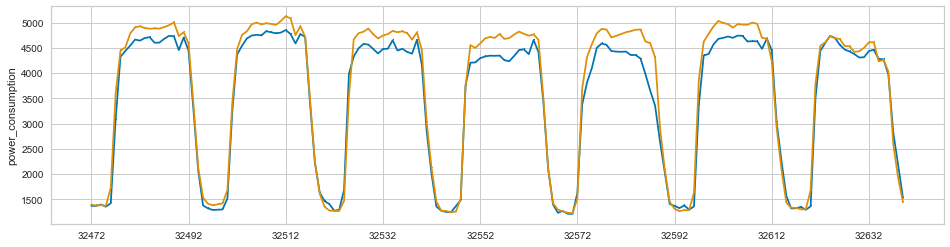

 16%|████████████▏                                                               | 16/100 [1:16:08<7:03:49, 302.74s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 32640 to 34679
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,1644
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,33.5174,3566.9088,58.5929,0.9817,0.0661,0.0373,1.4140
xgboost,Extreme Gradient Boosting,37.7919,4557.2319,65.8391,0.9768,0.0737,0.0425,1.4000
rf,Random Forest Regressor,37.8919,4565.2757,66.4977,0.9767,0.0753,0.0425,1.4860
lightgbm,Light Gradient Boosting Machine,41.6127,4468.1994,66.4653,0.9771,0.0755,0.0470,1.4150
gbr,Gradient Boosting Regressor,45.0541,4948.6327,69.6678,0.9748,0.0784,0.0495,1.3710
dt,Decision Tree Regressor,49.6289,9653.9227,96.0659,0.9507,0.1064,0.0532,1.3140
ada,AdaBoost Regressor,64.8921,8493.4411,91.7088,0.9564,0.0992,0.0707,1.3380
knn,K Neighbors Regressor,70.5609,20038.4859,138.3277,0.8978,0.1469,0.0812,1.3290
huber,Huber Regressor,76.2923,20517.8472,140.2672,0.8952,0.1495,0.0892,1.3260
omp,Orthogonal Matching Pursuit,78.8927,21981.2837,145.8026,0.8876,0.1519,0.0895,1.3170


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,32.7378,3202.7432,56.5928,0.9825,0.0659,0.0376
1,31.5658,2205.0524,46.9580,0.9889,0.0529,0.0344
2,27.2577,2083.0110,45.6400,0.9888,0.0569,0.0326
3,34.5657,5114.9150,71.5186,0.9734,0.0794,0.0408
4,36.2768,3505.7373,59.2093,0.9819,0.0765,0.0412
5,32.1610,2761.4373,52.5494,0.9857,0.0500,0.0321
6,40.2309,6595.0734,81.2101,0.9667,0.0937,0.0482
7,28.5376,1613.5115,40.1685,0.9916,0.0523,0.0347
8,34.1869,4281.9380,65.4365,0.9795,0.0589,0.0322


Transformation Pipeline and Model Successfully Saved


[Building #17]SMAPE : 4.854589978571668


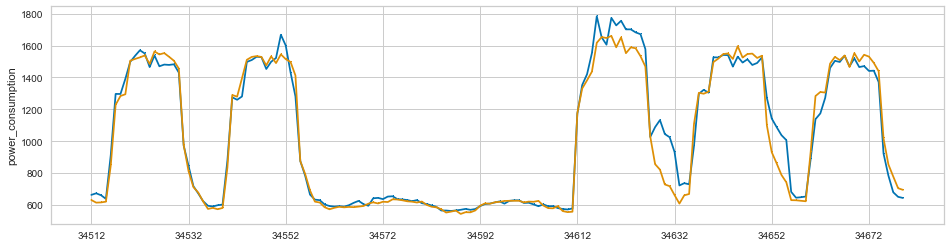

 17%|████████████▉                                                               | 17/100 [1:21:24<7:04:18, 306.73s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 34680 to 36719
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4402
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,49.4400,6522.0158,80.2280,0.9788,0.0562,0.0344,1.4160
lightgbm,Light Gradient Boosting Machine,52.4499,6666.8378,80.9718,0.9784,0.0565,0.0368,1.4460
xgboost,Extreme Gradient Boosting,53.3502,7566.6940,86.0666,0.9756,0.0590,0.0369,1.4230
rf,Random Forest Regressor,57.0449,9053.5020,94.0867,0.9706,0.0650,0.0395,1.5180
gbr,Gradient Boosting Regressor,59.3017,8625.2692,91.8582,0.9721,0.0628,0.0412,1.3830
dt,Decision Tree Regressor,77.5282,19217.6666,136.2289,0.9384,0.0947,0.0533,1.3280
huber,Huber Regressor,87.1878,26377.0761,158.0524,0.9138,0.1052,0.0625,1.3490
knn,K Neighbors Regressor,91.7895,28038.1220,163.6901,0.9083,0.1081,0.0643,1.3480
omp,Orthogonal Matching Pursuit,96.5266,28292.8712,164.5368,0.9078,0.1080,0.0672,1.3330
en,Elastic Net,92.7590,23333.1264,149.4421,0.9238,0.1037,0.0681,1.3310


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,56.4111,9226.4181,96.0542,0.9698,0.0654,0.0384
1,51.8532,6652.4116,81.5623,0.9756,0.0607,0.0374
2,54.1991,7277.5005,85.3083,0.9778,0.0568,0.0363
3,51.3679,6372.1257,79.8256,0.9788,0.0586,0.0375
4,47.2308,6309.9923,79.4355,0.9778,0.0575,0.0340
5,42.4760,4219.5342,64.9579,0.9866,0.0448,0.0299
6,37.9376,3799.0432,61.6364,0.9882,0.0407,0.0260
7,44.1896,4854.5229,69.6744,0.9852,0.0488,0.0301
8,46.0043,5002.4074,70.7277,0.9854,0.0499,0.0312


Transformation Pipeline and Model Successfully Saved


[Building #18]SMAPE : 6.441177186690231


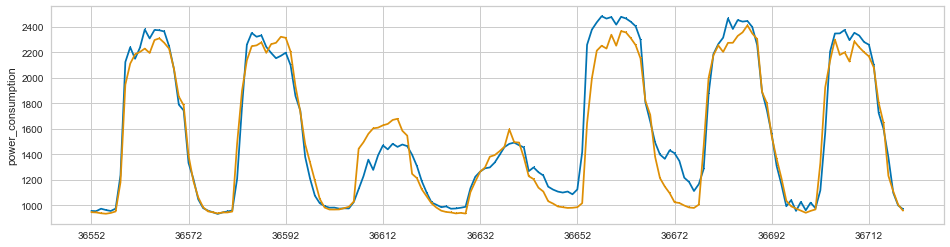

 18%|█████████████▋                                                              | 18/100 [1:26:45<7:04:45, 310.80s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 36720 to 38759
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3657
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,39.7387,3921.4048,61.6585,0.9916,0.0513,0.0312,1.4340
rf,Random Forest Regressor,45.7201,6230.0568,76.6791,0.9867,0.0591,0.0355,1.5150
xgboost,Extreme Gradient Boosting,46.7017,5726.0371,73.7962,0.9878,0.0582,0.0358,1.4470
lightgbm,Light Gradient Boosting Machine,48.3794,5849.8075,75.3117,0.9874,0.0564,0.0368,1.4820
gbr,Gradient Boosting Regressor,49.5597,5457.0448,73.5199,0.9883,0.0547,0.0375,1.4040
dt,Decision Tree Regressor,66.0654,14527.2015,117.6425,0.9692,0.0907,0.0508,1.3430
knn,K Neighbors Regressor,82.0957,26645.2156,160.8468,0.9426,0.1092,0.0614,1.3590
huber,Huber Regressor,83.5420,27836.6403,163.8815,0.9401,0.1123,0.0651,1.3420
omp,Orthogonal Matching Pursuit,90.9069,32445.1615,178.0416,0.9302,0.1177,0.0675,1.3460
ada,AdaBoost Regressor,88.6524,14066.1359,118.1320,0.9699,0.0893,0.0694,1.3680


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42.1489,3717.1405,60.9684,0.9927,0.0470,0.0303
1,37.3495,2920.2281,54.0391,0.9935,0.0386,0.0270
2,33.4343,2472.4239,49.7235,0.9935,0.0414,0.0279
3,51.2801,8451.2123,91.9305,0.9820,0.0708,0.0387
4,42.6855,5596.9352,74.8127,0.9886,0.0645,0.0336
5,40.4304,6144.2092,78.3850,0.9880,0.0674,0.0339
6,36.4537,3043.1863,55.1651,0.9942,0.0448,0.0284
7,49.1760,6416.1664,80.1010,0.9851,0.0679,0.0396
8,37.6425,3046.4628,55.1948,0.9934,0.0437,0.0291


Transformation Pipeline and Model Successfully Saved


[Building #19]SMAPE : 6.553593271287203


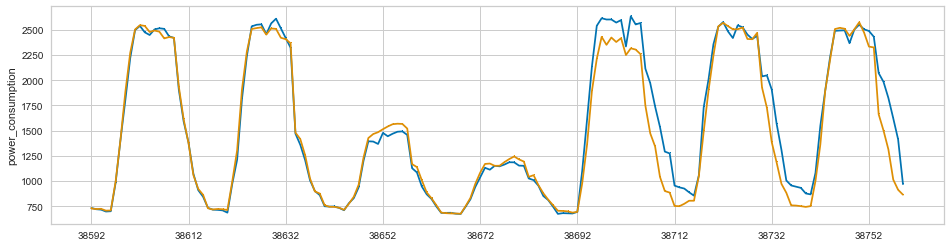

 19%|██████████████▍                                                             | 19/100 [1:32:10<7:05:29, 315.17s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 38760 to 40799
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2452
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,57.7386,13264.6246,113.0002,0.9859,0.0690,0.0357,1.4340
rf,Random Forest Regressor,65.1256,15677.9037,123.0966,0.9834,0.0719,0.0390,1.5840
xgboost,Extreme Gradient Boosting,66.0938,17240.9449,127.3653,0.9817,0.0726,0.0392,1.4810
gbr,Gradient Boosting Regressor,72.3568,16785.2046,128.0355,0.9821,0.0736,0.0437,1.4240
dt,Decision Tree Regressor,85.8834,27102.2913,160.8713,0.9709,0.0909,0.0500,1.4350
lightgbm,Light Gradient Boosting Machine,79.3415,24711.1557,154.9529,0.9738,0.0972,0.0508,1.4900
knn,K Neighbors Regressor,116.2334,75514.4930,265.8878,0.9194,0.1503,0.0776,1.4400
omp,Orthogonal Matching Pursuit,130.6504,88791.3625,289.3147,0.9055,0.1629,0.0875,1.3660
huber,Huber Regressor,126.8556,86815.9114,284.2689,0.9075,0.1627,0.0879,1.4600
par,Passive Aggressive Regressor,134.1113,87085.4728,285.8687,0.9073,0.1641,0.0934,1.3750


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,61.6364,13869.5925,117.7692,0.9860,0.0678,0.0356
1,45.3487,4908.6767,70.0619,0.9951,0.0369,0.0261
2,68.3936,22298.3143,149.3262,0.9777,0.0788,0.0366
3,59.9448,16653.5480,129.0486,0.9795,0.0701,0.0354
4,57.7819,9852.6682,99.2606,0.9894,0.0593,0.0355
5,62.2192,10327.1773,101.6227,0.9886,0.0685,0.0395
6,71.6011,16898.6126,129.9947,0.9836,0.0836,0.0447
7,53.6274,11223.8042,105.9425,0.9873,0.0642,0.0356
8,52.4087,10544.8805,102.6883,0.9889,0.0662,0.0335


Transformation Pipeline and Model Successfully Saved


[Building #20]SMAPE : 3.6454096568555423


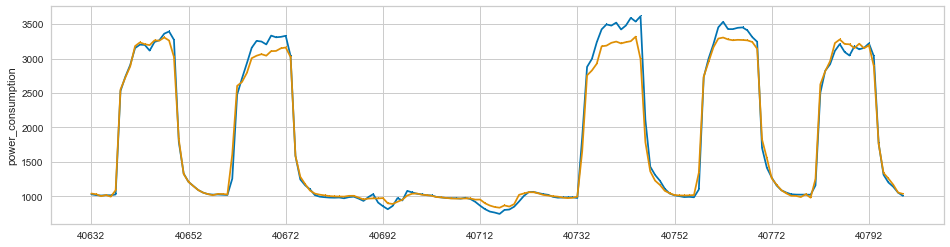

 20%|███████████████▏                                                            | 20/100 [1:37:43<7:07:08, 320.35s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 40800 to 42839
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3392
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,70.6010,15348.7713,121.4988,0.9737,0.0661,0.0380,1.4560
xgboost,Extreme Gradient Boosting,79.8879,16930.1771,128.7497,0.9710,0.0695,0.0426,1.4940
lightgbm,Light Gradient Boosting Machine,82.4129,18279.7304,132.9004,0.9685,0.0696,0.0439,1.5070
rf,Random Forest Regressor,81.8017,19559.1998,138.0644,0.9664,0.0750,0.0440,1.5630
gbr,Gradient Boosting Regressor,86.7838,19842.9893,139.5965,0.9660,0.0742,0.0461,1.4370
dt,Decision Tree Regressor,108.4147,37772.8407,191.9307,0.9346,0.0999,0.0568,1.3750
huber,Huber Regressor,117.1466,44858.9455,210.1165,0.9220,0.1027,0.0614,1.3810
omp,Orthogonal Matching Pursuit,123.3412,48449.4533,218.3993,0.9157,0.1047,0.0628,1.3810
knn,K Neighbors Regressor,124.6459,47329.9914,216.6021,0.9182,0.1047,0.0632,1.3860
en,Elastic Net,125.2272,40077.1322,199.2431,0.9305,0.1021,0.0680,1.3780


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,76.7035,15813.8302,125.7531,0.9721,0.0741,0.0430
1,77.0740,13836.9745,117.6307,0.9752,0.0603,0.0393
2,70.9890,13910.6146,117.9433,0.9771,0.0592,0.0365
3,56.3897,6602.5075,81.2558,0.9870,0.0504,0.0336
4,56.6844,8460.7551,91.9824,0.9860,0.0500,0.0304
5,76.7085,15027.3626,122.5861,0.9715,0.0625,0.0402
6,77.6632,26821.6720,163.7732,0.9568,0.0888,0.0423
7,77.7565,16387.4780,128.0136,0.9713,0.0710,0.0426
8,68.5080,14053.2229,118.5463,0.9765,0.0640,0.0354


Transformation Pipeline and Model Successfully Saved


[Building #21]SMAPE : 5.418899601190484


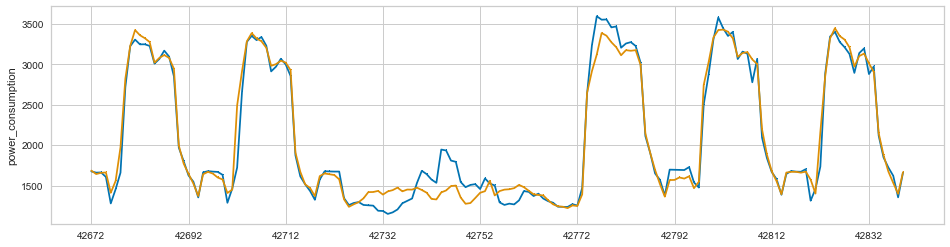

 21%|███████████████▉                                                            | 21/100 [1:43:14<7:06:02, 323.58s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 42840 to 44879
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3092
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,36.8648,3303.6641,57.0510,0.9656,0.0471,0.0305,1.4950
lightgbm,Light Gradient Boosting Machine,38.0072,3396.8593,57.6017,0.9647,0.0466,0.0312,1.4940
xgboost,Extreme Gradient Boosting,38.1419,3169.6754,56.1573,0.9669,0.0457,0.0313,1.4650
rf,Random Forest Regressor,40.7705,3845.9366,61.5852,0.9598,0.0501,0.0335,1.5940
gbr,Gradient Boosting Regressor,42.3496,3760.6834,61.2063,0.9607,0.0495,0.0346,1.4520
huber,Huber Regressor,46.3472,4996.7971,70.2879,0.9480,0.0560,0.0380,1.3990
br,Bayesian Ridge,46.5343,4902.3778,69.6818,0.9490,0.0556,0.0381,1.3920
en,Elastic Net,46.6252,4820.6348,69.1415,0.9498,0.0554,0.0383,1.4040
omp,Orthogonal Matching Pursuit,47.6873,5116.7484,71.1630,0.9467,0.0565,0.0388,1.3960
llar,Lasso Least Angle Regression,47.1720,4694.1389,68.2950,0.9511,0.0552,0.0390,1.4040


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,34.9120,2748.9752,52.4307,0.9705,0.0435,0.0295
1,42.1334,4149.3474,64.4154,0.9521,0.0515,0.0348
2,34.6536,3163.5333,56.2453,0.9704,0.0470,0.0284
3,36.9717,2548.4745,50.4824,0.9712,0.0433,0.0314
4,37.0198,3397.7771,58.2905,0.9658,0.0492,0.0307
5,29.7278,1735.3009,41.6569,0.9794,0.0345,0.0248
6,39.0409,4389.1831,66.2509,0.9568,0.0534,0.0317
7,36.6081,2878.8982,53.6554,0.9716,0.0404,0.0287
8,36.8469,3344.6716,57.8331,0.9655,0.0472,0.0300


Transformation Pipeline and Model Successfully Saved


[Building #22]SMAPE : 3.9225929977182266


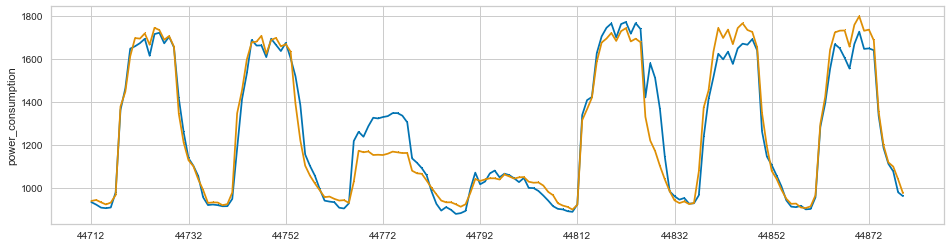

 22%|████████████████▋                                                           | 22/100 [1:48:49<7:05:12, 327.08s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 44880 to 46919
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,6549
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,17.3967,935.1914,30.1544,0.9866,0.0229,0.0132,1.4930
rf,Random Forest Regressor,20.3550,1262.8424,35.0451,0.9819,0.0266,0.0154,1.5970
xgboost,Extreme Gradient Boosting,21.2902,1201.2939,34.3060,0.9829,0.0253,0.0160,1.4990
lightgbm,Light Gradient Boosting Machine,21.7996,1488.8826,38.2096,0.9787,0.0288,0.0166,1.5140
gbr,Gradient Boosting Regressor,22.9870,1423.2158,37.5064,0.9796,0.0282,0.0174,1.4770
dt,Decision Tree Regressor,27.2848,2509.8390,49.0801,0.9641,0.0370,0.0205,1.4180
knn,K Neighbors Regressor,35.0941,4921.7418,69.1405,0.9293,0.0525,0.0273,1.4170
huber,Huber Regressor,39.8506,7184.0531,84.2027,0.8971,0.0633,0.0310,1.4460
ada,AdaBoost Regressor,39.6670,2701.6299,51.8478,0.9613,0.0397,0.0313,1.4390
en,Elastic Net,44.5508,5755.3816,75.3345,0.9173,0.0578,0.0352,1.4050


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,16.7262,834.4532,28.8869,0.9891,0.0209,0.0122
1,18.7670,782.6734,27.9763,0.9894,0.0211,0.0140
2,19.5698,1709.5854,41.3471,0.9762,0.0319,0.0150
3,19.4376,935.1745,30.5806,0.9872,0.0233,0.0148
4,17.1902,794.6887,28.1902,0.9898,0.0210,0.0128
5,21.0743,1054.6120,32.4748,0.9845,0.0245,0.0160
6,17.1905,766.0530,27.6777,0.9878,0.0198,0.0131
7,21.3476,1627.1979,40.3385,0.9749,0.0323,0.0164
8,17.2576,850.6214,29.1654,0.9886,0.0237,0.0133


Transformation Pipeline and Model Successfully Saved


[Building #23]SMAPE : 1.3532537130150089


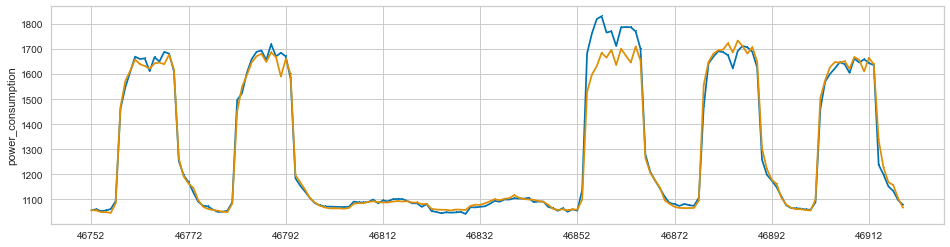

 23%|█████████████████▍                                                          | 23/100 [1:54:29<7:04:47, 331.01s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 46920 to 48959
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,310
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,195.4605,82557.3663,284.5394,0.9899,0.0301,0.0202,1.5290
lightgbm,Light Gradient Boosting Machine,220.5430,116559.4761,337.9225,0.9856,0.0334,0.0221,1.5200
xgboost,Extreme Gradient Boosting,220.3947,107418.5367,323.6910,0.9868,0.0332,0.0224,1.4970
gbr,Gradient Boosting Regressor,231.9050,111501.1299,331.0127,0.9862,0.0332,0.0234,1.5070
rf,Random Forest Regressor,243.8120,149165.2968,379.0727,0.9814,0.0391,0.0251,1.6040
dt,Decision Tree Regressor,334.3117,279184.9286,522.1893,0.9658,0.0534,0.0341,1.4090
huber,Huber Regressor,371.8353,523885.4180,711.0106,0.9360,0.0679,0.0378,1.4200
en,Elastic Net,387.0168,451333.0828,659.9064,0.9450,0.0657,0.0404,1.4220
ada,AdaBoost Regressor,404.2782,274752.7724,521.7389,0.9662,0.0531,0.0420,1.4740
br,Bayesian Ridge,405.1691,400443.7438,624.9918,0.9508,0.0648,0.0429,1.4350


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,192.6047,61628.5823,248.2510,0.9926,0.0237,0.0187
1,188.0969,68005.8960,260.7794,0.9923,0.0250,0.0185
2,190.0007,82665.9998,287.5170,0.9906,0.0296,0.0196
3,163.6496,42831.0860,206.9567,0.9947,0.0208,0.0168
4,188.4562,83548.2494,289.0471,0.9891,0.0318,0.0199
5,180.5273,87999.3646,296.6469,0.9867,0.0292,0.0186
6,181.5529,66985.9676,258.8165,0.9897,0.0255,0.0185
7,217.5948,116521.0233,341.3518,0.9883,0.0370,0.0221
8,196.8410,101740.5122,318.9679,0.9876,0.0339,0.0204


Transformation Pipeline and Model Successfully Saved


[Building #24]SMAPE : 2.439184337341859


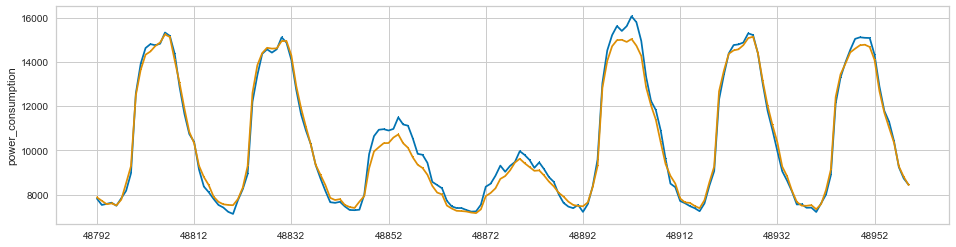

 24%|██████████████████▏                                                         | 24/100 [2:00:10<7:03:10, 334.09s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 48960 to 50999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7638
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,155.3151,68987.9792,253.8805,0.9875,0.0345,0.0210,1.5070
xgboost,Extreme Gradient Boosting,177.3762,98977.3371,305.4681,0.9822,0.0409,0.0236,1.5610
lightgbm,Light Gradient Boosting Machine,182.4845,96348.2109,304.0301,0.9827,0.0411,0.0247,1.5570
gbr,Gradient Boosting Regressor,190.9747,94831.7930,302.3313,0.9830,0.0400,0.0254,1.4940
rf,Random Forest Regressor,188.5240,104853.6363,312.8696,0.9812,0.0427,0.0257,1.6130
dt,Decision Tree Regressor,242.8220,183639.0893,402.3778,0.9676,0.0531,0.0331,1.4280
huber,Huber Regressor,272.6718,350463.0630,585.6424,0.9375,0.0762,0.0379,1.4340
en,Elastic Net,292.8059,314124.6453,556.5992,0.9439,0.0747,0.0417,1.4320
ada,AdaBoost Regressor,305.3853,183822.3806,425.6979,0.9671,0.0570,0.0427,1.4580
omp,Orthogonal Matching Pursuit,314.9374,387604.0109,617.9723,0.9307,0.0798,0.0433,1.4310


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,150.9328,49076.2544,221.5316,0.9923,0.0274,0.0196
1,173.4014,77216.6275,277.8788,0.9861,0.0362,0.0223
2,149.7842,50898.4197,225.6068,0.9901,0.0264,0.0186
3,225.7732,189740.4610,435.5921,0.9670,0.0669,0.0333
4,133.5309,35467.1446,188.3272,0.9936,0.0230,0.0172
5,124.4212,34698.0191,186.2740,0.9940,0.0246,0.0167
6,143.0619,53505.5049,231.3126,0.9898,0.0324,0.0194
7,158.3641,62721.1453,250.4419,0.9901,0.0306,0.0194
8,141.6796,98495.5725,313.8400,0.9834,0.0487,0.0211


Transformation Pipeline and Model Successfully Saved


[Building #25]SMAPE : 1.8389437737778367


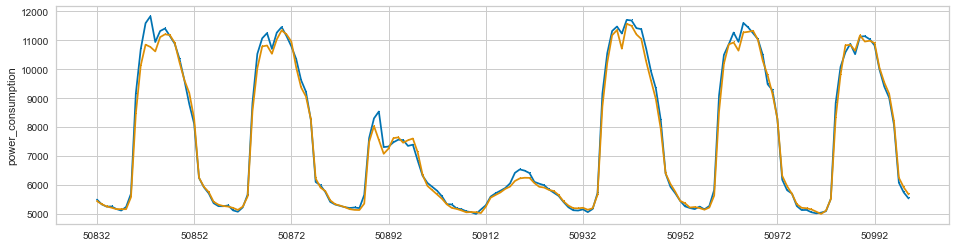

 25%|███████████████████                                                         | 25/100 [2:05:54<7:01:17, 337.03s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 51000 to 53039
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4618
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,80.7899,14812.7655,120.7651,0.9844,0.0358,0.0235,1.6570
xgboost,Extreme Gradient Boosting,83.8162,16649.6408,127.6682,0.9823,0.0364,0.0237,1.5470
lightgbm,Light Gradient Boosting Machine,88.6190,20248.2669,141.0949,0.9782,0.0391,0.0249,1.6720
gbr,Gradient Boosting Regressor,94.7541,18524.1734,135.4586,0.9807,0.0382,0.0271,1.5380
rf,Random Forest Regressor,98.9420,22954.6133,150.5894,0.9756,0.0441,0.0288,1.6260
dt,Decision Tree Regressor,136.4208,49295.2074,218.3160,0.9481,0.0632,0.0388,1.4470
ada,AdaBoost Regressor,163.6478,44736.9062,210.9064,0.9530,0.0609,0.0477,1.5880
huber,Huber Regressor,171.5487,84998.4413,288.5903,0.9102,0.0790,0.0497,1.4680
br,Bayesian Ridge,171.1973,65675.7234,254.8231,0.9306,0.0734,0.0503,1.4460
lasso,Lasso Regression,171.7352,65510.2223,254.5099,0.9308,0.0733,0.0505,1.4480


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,72.6561,11066.2809,105.1964,0.9895,0.0291,0.0203
1,76.3306,11972.5675,109.4192,0.9895,0.0308,0.0213
2,77.5153,15970.4907,126.3744,0.9848,0.0388,0.0218
3,73.9933,13921.5006,117.9894,0.9804,0.0374,0.0229
4,60.8438,7765.6783,88.1231,0.9914,0.0263,0.0180
5,80.9792,20995.9545,144.8998,0.9758,0.0434,0.0236
6,84.8062,13510.1370,116.2331,0.9856,0.0307,0.0231
7,61.7751,9464.5679,97.2860,0.9889,0.0332,0.0197
8,79.3801,14997.7773,122.4654,0.9859,0.0330,0.0225


Transformation Pipeline and Model Successfully Saved


[Building #26]SMAPE : 2.0509149438103087


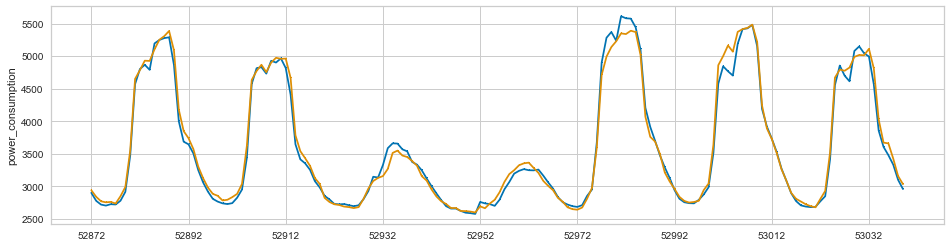

 26%|███████████████████▊                                                        | 26/100 [2:11:49<7:02:10, 342.30s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 53040 to 55079
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4440
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,226.5007,133201.1431,360.9831,0.9888,0.0213,0.0132,1.6640
lightgbm,Light Gradient Boosting Machine,266.2731,206103.1352,446.7702,0.9825,0.0252,0.0152,1.6890
xgboost,Extreme Gradient Boosting,283.5066,199983.2547,442.5735,0.9832,0.0254,0.0163,1.6660
rf,Random Forest Regressor,297.4339,232801.6150,476.5623,0.9803,0.0277,0.0172,1.7590
gbr,Gradient Boosting Regressor,307.2357,233038.9920,479.2404,0.9803,0.0271,0.0176,1.6250
dt,Decision Tree Regressor,425.6930,467545.8910,677.7468,0.9601,0.0390,0.0246,1.5870
en,Elastic Net,555.1522,811389.7875,889.0041,0.9307,0.0523,0.0331,1.5640
huber,Huber Regressor,568.4268,961103.2736,969.0296,0.9180,0.0553,0.0334,1.5680
br,Bayesian Ridge,572.8067,746322.7375,856.1241,0.9363,0.0510,0.0342,1.5700
lasso,Lasso Regression,579.7041,745064.6781,856.0026,0.9364,0.0511,0.0346,1.5630


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,196.9191,127098.0300,356.5081,0.9901,0.0234,0.0119
1,237.2645,151949.3636,389.8068,0.9869,0.0224,0.0136
2,191.4458,131779.7070,363.0147,0.9875,0.0198,0.0111
3,251.8252,189756.3471,435.6103,0.9852,0.0265,0.0148
4,218.5401,106272.8012,325.9951,0.9917,0.0180,0.0123
5,196.7358,72375.4176,269.0268,0.9935,0.0161,0.0115
6,199.4511,80651.7253,283.9925,0.9927,0.0165,0.0117
7,229.7709,166619.8369,408.1909,0.9865,0.0232,0.0130
8,250.6149,164506.7191,405.5943,0.9859,0.0229,0.0143


Transformation Pipeline and Model Successfully Saved


[Building #27]SMAPE : 1.769415906007419


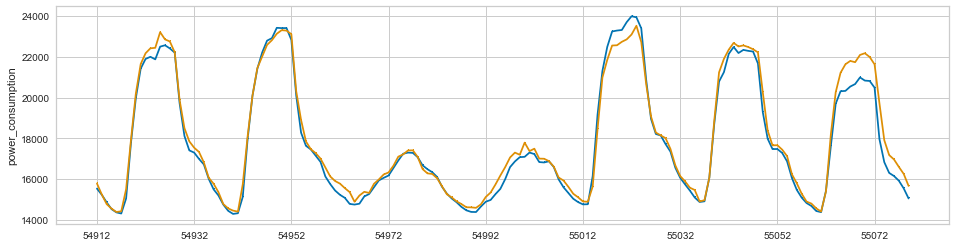

 27%|████████████████████▌                                                       | 27/100 [2:18:05<7:08:41, 352.35s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 55080 to 57119
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,8870
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,64.2883,10685.1162,102.5365,0.9746,0.0517,0.0351,1.7130
lightgbm,Light Gradient Boosting Machine,69.3451,14830.8411,118.4120,0.9656,0.0592,0.0379,1.7560
et,Extra Trees Regressor,69.4377,13195.8653,112.7187,0.9691,0.0581,0.0389,1.6660
gbr,Gradient Boosting Regressor,73.4431,13472.1395,114.3481,0.9684,0.0575,0.0405,1.6620
rf,Random Forest Regressor,77.6081,15824.1531,123.8879,0.9631,0.0629,0.0430,1.7460
dt,Decision Tree Regressor,99.4536,25022.1311,157.1920,0.9408,0.0817,0.0557,1.5770
huber,Huber Regressor,124.1452,47639.4128,214.7121,0.8892,0.1005,0.0653,1.5950
knn,K Neighbors Regressor,131.8407,51336.3723,222.8787,0.8804,0.1049,0.0698,1.5980
en,Elastic Net,126.5473,42931.7969,204.0900,0.9002,0.1003,0.0702,1.5900
omp,Orthogonal Matching Pursuit,136.9152,52807.4003,226.4708,0.8768,0.1055,0.0718,1.5750


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,67.6455,14820.1423,121.7380,0.9657,0.0593,0.0363
1,55.3971,8681.6367,93.1753,0.9791,0.0413,0.0293
2,72.8630,12970.0947,113.8863,0.9704,0.0548,0.0386
3,51.0061,7400.2213,86.0245,0.9805,0.0407,0.0282
4,56.3023,7045.0795,83.9350,0.9792,0.0432,0.0309
5,68.0546,12349.1235,111.1266,0.9716,0.0593,0.0375
6,62.5367,9861.2674,99.3039,0.9814,0.0555,0.0347
7,59.1872,8640.9819,92.9569,0.9804,0.0484,0.0329
8,56.5811,7930.4363,89.0530,0.9816,0.0470,0.0316


Transformation Pipeline and Model Successfully Saved


[Building #28]SMAPE : 6.17245012186896


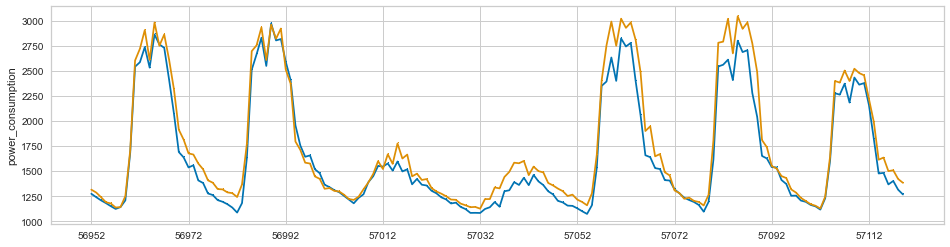

 28%|█████████████████████▎                                                      | 28/100 [2:24:24<7:12:35, 360.49s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 57120 to 59159
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4655
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,42.7279,3938.1281,62.1776,0.9758,0.0425,0.0292,1.7200
et,Extra Trees Regressor,43.7090,3458.9528,58.5733,0.9781,0.0420,0.0309,1.7080
lightgbm,Light Gradient Boosting Machine,44.6136,4833.0096,68.9122,0.9702,0.0474,0.0310,1.7140
gbr,Gradient Boosting Regressor,49.4511,4779.7050,68.7616,0.9707,0.0466,0.0340,1.6760
rf,Random Forest Regressor,50.2503,4844.6977,69.4058,0.9698,0.0482,0.0351,1.8050
dt,Decision Tree Regressor,68.5819,10566.5424,100.8225,0.9330,0.0664,0.0470,1.5920
ada,AdaBoost Regressor,71.5007,8634.3771,92.6059,0.9465,0.0635,0.0501,1.6530
knn,K Neighbors Regressor,79.4778,16176.7732,125.9693,0.9011,0.0813,0.0543,1.6240
huber,Huber Regressor,79.3399,17726.0786,131.8533,0.8924,0.0857,0.0546,1.6330
en,Elastic Net,80.1473,15996.6444,125.3713,0.9026,0.0826,0.0553,1.6210


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,42.0479,2893.8280,53.7943,0.9806,0.0386,0.0304
1,39.9076,3543.7473,59.5294,0.9800,0.0412,0.0277
2,43.2696,3468.8185,58.8967,0.9784,0.0398,0.0295
3,38.8021,3275.4396,57.2315,0.9831,0.0398,0.0269
4,39.6397,2979.8612,54.5881,0.9756,0.0429,0.0297
5,37.4823,2626.9656,51.2539,0.9833,0.0343,0.0254
6,40.6069,3482.1653,59.0099,0.9836,0.0441,0.0286
7,38.1828,2900.1725,53.8532,0.9801,0.0384,0.0264
8,38.0562,2563.7308,50.6333,0.9837,0.0339,0.0259


Transformation Pipeline and Model Successfully Saved


[Building #29]SMAPE : 3.380519030227652


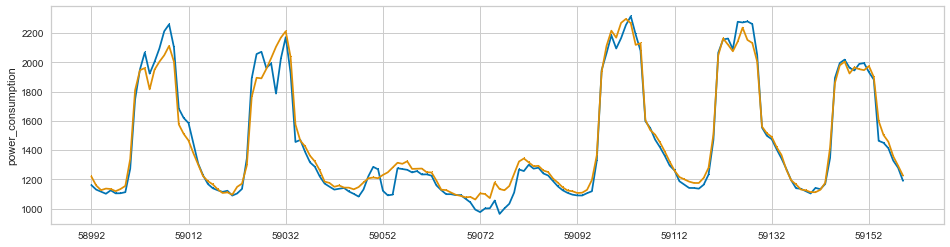

 29%|██████████████████████                                                      | 29/100 [2:30:50<7:15:29, 368.02s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 59160 to 61199
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2889
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,45.3099,5425.5793,72.9211,0.9043,0.1076,0.0629,1.6310
et,Extra Trees Regressor,45.8099,5198.4803,71.3887,0.9085,0.1049,0.0636,1.6180
xgboost,Extreme Gradient Boosting,45.5014,5600.2026,73.6476,0.9016,0.1119,0.0644,1.6070
gbr,Gradient Boosting Regressor,47.8728,5549.2646,73.5636,0.9016,0.1077,0.0663,1.5920
rf,Random Forest Regressor,50.3900,6770.8262,81.3151,0.8816,0.1187,0.0713,1.6920
dt,Decision Tree Regressor,65.6344,11675.6491,106.4186,0.7956,0.1502,0.0891,1.4880
ada,AdaBoost Regressor,64.9165,7955.8414,88.9392,0.8574,0.1271,0.0892,1.5670
en,Elastic Net,66.7363,10757.7412,103.1720,0.8083,0.1456,0.0940,1.5260
br,Bayesian Ridge,67.3454,10250.3608,100.7348,0.8176,0.1435,0.0947,1.4890
lasso,Lasso Regression,67.4587,10266.1989,100.8119,0.8173,0.1439,0.0950,1.6090


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,55.5518,7564.8593,86.9762,0.8929,0.1254,0.0762
1,46.6278,6068.2583,77.8990,0.8906,0.1398,0.0730
2,37.2124,3200.3753,56.5719,0.9285,0.0695,0.0458
3,36.1890,3563.0981,59.6917,0.9358,0.0718,0.0441
4,48.1961,5869.6174,76.6134,0.8861,0.1186,0.0686
5,37.0548,3326.6089,57.6768,0.9265,0.0695,0.0451
6,40.8386,4047.4651,63.6197,0.9226,0.1026,0.0583
7,38.8975,3609.7329,60.0811,0.9347,0.0706,0.0469
8,51.4467,6700.7005,81.8578,0.9040,0.1609,0.0883


Transformation Pipeline and Model Successfully Saved


[Building #30]SMAPE : 7.423429378991287


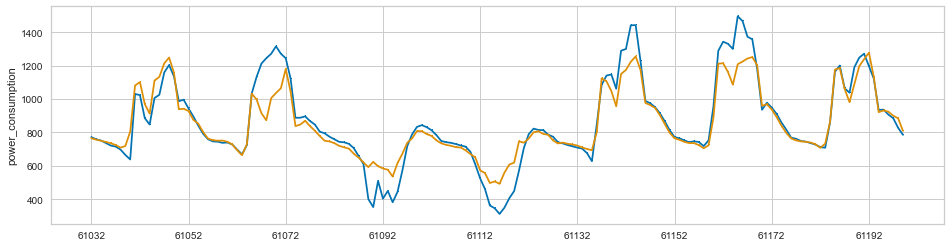

 30%|██████████████████████▊                                                     | 30/100 [2:36:53<7:07:44, 366.63s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 61200 to 63239
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,3327
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,43.2715,4008.9928,62.9741,0.9761,0.0434,0.0310,1.5940
lightgbm,Light Gradient Boosting Machine,44.9984,5313.7618,70.8667,0.9689,0.0484,0.0324,1.6510
et,Extra Trees Regressor,44.1833,4395.1423,65.7554,0.9740,0.0472,0.0325,1.6070
gbr,Gradient Boosting Regressor,47.1506,4668.1592,67.8495,0.9723,0.0464,0.0337,1.5800
rf,Random Forest Regressor,48.0961,5103.5859,70.7929,0.9698,0.0496,0.0349,1.6840
dt,Decision Tree Regressor,63.2237,9627.2137,95.6286,0.9436,0.0670,0.0459,1.5180
knn,K Neighbors Regressor,72.8964,14150.8051,115.3987,0.9183,0.0754,0.0523,1.5330
huber,Huber Regressor,74.1660,15268.1876,121.5247,0.9111,0.0786,0.0527,1.5220
en,Elastic Net,75.2089,14240.1344,116.8452,0.9173,0.0782,0.0546,1.5190
br,Bayesian Ridge,76.7322,14545.0598,118.4374,0.9153,0.0795,0.0557,1.5160


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,38.5430,2873.8385,53.6082,0.9842,0.0353,0.0263
1,42.0250,4097.9168,64.0150,0.9743,0.0409,0.0296
2,51.8180,7746.0041,88.0114,0.9578,0.0631,0.0389
3,37.7778,3259.0366,57.0880,0.9806,0.0442,0.0277
4,44.0950,5170.1253,71.9036,0.9666,0.0516,0.0329
5,40.2041,3414.7800,58.4361,0.9827,0.0396,0.0278
6,46.3156,4211.6804,64.8975,0.9765,0.0442,0.0332
7,38.1345,3205.3508,56.6158,0.9777,0.0396,0.0281
8,38.5134,3158.2589,56.1984,0.9789,0.0368,0.0271


Transformation Pipeline and Model Successfully Saved


[Building #31]SMAPE : 4.386598852434937


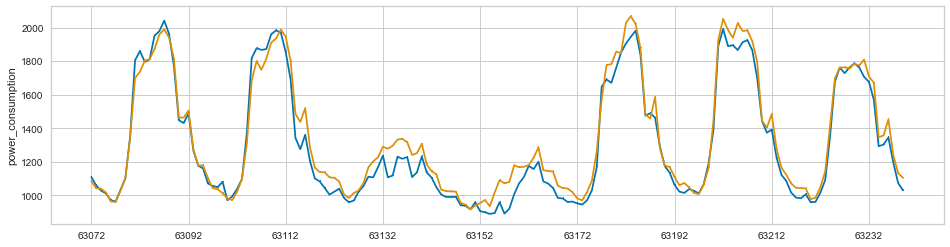

 31%|███████████████████████▌                                                    | 31/100 [2:42:56<7:00:28, 365.63s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 63240 to 65279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7423
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,24.0274,1038.8434,32.1062,0.9822,0.0033,0.0024,1.6230
lightgbm,Light Gradient Boosting Machine,27.1291,1382.6209,37.1146,0.9763,0.0038,0.0028,1.6250
rf,Random Forest Regressor,29.3160,1506.8082,38.7059,0.9742,0.0040,0.0030,1.7170
xgboost,Extreme Gradient Boosting,29.0712,1504.4279,38.6972,0.9741,0.0040,0.0030,1.6110
gbr,Gradient Boosting Regressor,30.5846,1615.9135,40.1674,0.9723,0.0041,0.0031,1.5940
llar,Lasso Least Angle Regression,35.1412,2111.5195,45.7955,0.9639,0.0047,0.0036,1.5610
ridge,Ridge Regression,35.0058,2082.7311,45.4660,0.9643,0.0047,0.0036,1.5680
br,Bayesian Ridge,34.9804,2083.1962,45.4757,0.9643,0.0047,0.0036,1.5370
lr,Linear Regression,35.0248,2084.0030,45.4786,0.9643,0.0047,0.0036,1.5740
lasso,Lasso Regression,35.1417,2111.6288,45.7964,0.9638,0.0047,0.0036,1.5680


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,27.5644,1421.8581,37.7075,0.9768,0.0039,0.0028
1,25.0413,1256.4382,35.4463,0.9795,0.0036,0.0026
2,24.0978,943.3898,30.7147,0.9832,0.0031,0.0025
3,22.7507,946.1914,30.7602,0.9866,0.0031,0.0023
4,24.7825,1006.9127,31.7319,0.9817,0.0033,0.0025
5,23.8526,1050.6596,32.4139,0.9807,0.0033,0.0024
6,24.0244,1082.2760,32.8980,0.9809,0.0034,0.0024
7,23.4651,948.1124,30.7914,0.9804,0.0031,0.0024
8,23.9070,1069.4461,32.7024,0.9829,0.0034,0.0024


Transformation Pipeline and Model Successfully Saved


[Building #32]SMAPE : 0.44346708610888974


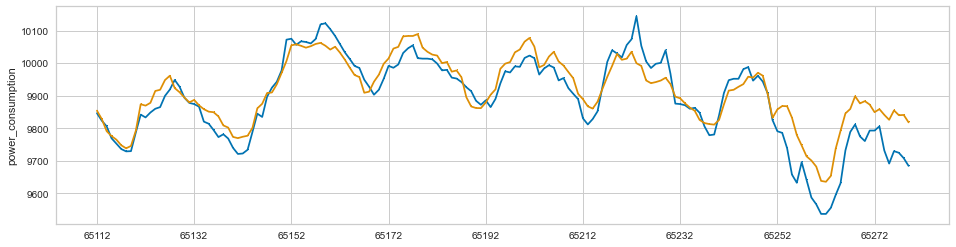

 32%|████████████████████████▎                                                   | 32/100 [2:49:05<6:55:32, 366.65s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 65280 to 67319
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7884
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,20.5694,779.6514,27.6540,0.9796,0.0032,0.0024,1.6220
lightgbm,Light Gradient Boosting Machine,22.2274,916.1618,30.0489,0.9760,0.0035,0.0026,1.6410
xgboost,Extreme Gradient Boosting,23.7367,1005.8961,31.4909,0.9737,0.0036,0.0027,1.6090
gbr,Gradient Boosting Regressor,25.0868,1138.5482,33.4165,0.9702,0.0038,0.0029,1.5890
rf,Random Forest Regressor,25.7755,1236.2457,34.7225,0.9676,0.0040,0.0030,1.6900
dt,Decision Tree Regressor,34.3042,2396.8718,48.6177,0.9374,0.0056,0.0039,1.5420
llar,Lasso Least Angle Regression,38.4690,2565.6077,50.4676,0.9327,0.0058,0.0044,1.5590
ridge,Ridge Regression,38.2050,2534.5304,50.1658,0.9335,0.0058,0.0044,1.5560
br,Bayesian Ridge,38.2311,2535.3230,50.1721,0.9335,0.0058,0.0044,1.6000
lr,Linear Regression,38.2054,2535.0346,50.1711,0.9335,0.0058,0.0044,1.5520


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,23.5010,1326.9678,36.4276,0.9663,0.0042,0.0027
1,20.9063,791.4588,28.1329,0.9792,0.0032,0.0024
2,19.0477,696.2661,26.3869,0.9822,0.0030,0.0022
3,20.0181,724.6582,26.9195,0.9806,0.0031,0.0023
4,20.8555,738.9692,27.1840,0.9808,0.0031,0.0024
5,19.7646,659.9851,25.6902,0.9846,0.0029,0.0023
6,20.5512,663.9117,25.7665,0.9833,0.0030,0.0024
7,22.2978,841.3529,29.0061,0.9775,0.0033,0.0026
8,17.6488,577.8462,24.0384,0.9831,0.0027,0.0020


Transformation Pipeline and Model Successfully Saved


[Building #33]SMAPE : 0.3202346129958025


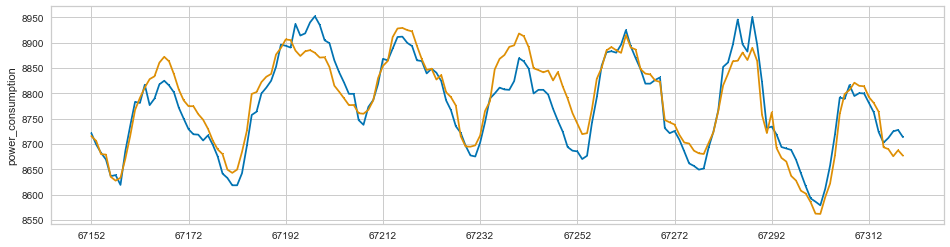

 33%|█████████████████████████                                                   | 33/100 [2:55:16<6:50:35, 367.69s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 67320 to 69359
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,640
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,15.4137,955.8517,26.1873,0.9522,0.0080,0.0046,1.6640
lightgbm,Light Gradient Boosting Machine,16.4292,985.8125,26.7036,0.9508,0.0082,0.0049,1.6830
xgboost,Extreme Gradient Boosting,17.6548,1037.1936,28.4662,0.9473,0.0087,0.0053,1.6720
rf,Random Forest Regressor,17.9382,1082.0243,28.9334,0.9452,0.0088,0.0054,1.7310
gbr,Gradient Boosting Regressor,18.5255,1234.0744,31.2408,0.9364,0.0095,0.0056,1.6030
dt,Decision Tree Regressor,24.9800,2051.3098,41.8863,0.8894,0.0129,0.0075,1.5710
br,Bayesian Ridge,26.0023,1560.6539,37.2234,0.9183,0.0114,0.0078,1.5550
lr,Linear Regression,26.0828,1561.4825,37.2618,0.9182,0.0114,0.0079,1.5500
ridge,Ridge Regression,26.0667,1560.8185,37.2496,0.9182,0.0114,0.0079,1.5640
lasso,Lasso Regression,26.4132,1594.9679,37.6347,0.9165,0.0115,0.0080,1.5480


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,14.9983,369.7512,19.2289,0.9782,0.0057,0.0044
1,15.7553,535.8677,23.1488,0.9731,0.0069,0.0047
2,13.8080,342.5314,18.5076,0.9819,0.0055,0.0041
3,14.3043,389.7169,19.7412,0.9786,0.0059,0.0043
4,14.1090,303.4898,17.4210,0.9794,0.0052,0.0042
5,20.5615,5639.2868,75.0952,0.7432,0.0246,0.0067
6,16.1114,476.7309,21.8342,0.9742,0.0065,0.0048
7,15.5179,533.5574,23.0989,0.9695,0.0068,0.0046
8,14.2097,350.7447,18.7282,0.9795,0.0056,0.0042


Transformation Pipeline and Model Successfully Saved


[Building #34]SMAPE : 0.5285684187969905


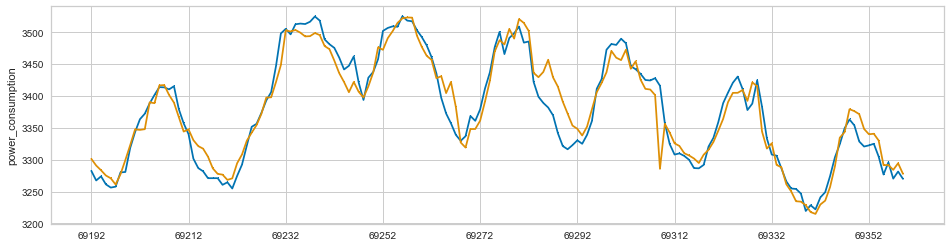

 34%|█████████████████████████▊                                                  | 34/100 [3:01:30<6:46:37, 369.66s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 69360 to 71399
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2595
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,6.7062,96.8056,9.7096,0.9575,0.0045,0.0031,1.6380
lightgbm,Light Gradient Boosting Machine,6.8942,103.3762,10.0753,0.9547,0.0046,0.0032,1.6950
gbr,Gradient Boosting Regressor,7.6477,117.1905,10.7145,0.9486,0.0049,0.0035,1.6370
xgboost,Extreme Gradient Boosting,7.6653,116.8839,10.7048,0.9489,0.0049,0.0035,1.6510
rf,Random Forest Regressor,7.8269,120.5763,10.9014,0.9471,0.0050,0.0036,1.7280
lr,Linear Regression,9.7241,165.5701,12.7865,0.9277,0.0059,0.0045,1.6100
ridge,Ridge Regression,9.7221,165.5183,12.7838,0.9278,0.0059,0.0045,1.5750
br,Bayesian Ridge,9.7267,165.6224,12.7845,0.9277,0.0059,0.0045,1.5780
lar,Least Angle Regression,10.2797,181.1175,13.3748,0.9211,0.0062,0.0047,1.5780
lasso,Lasso Regression,10.3401,182.2885,13.4162,0.9204,0.0062,0.0048,1.5810


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5.8748,62.8990,7.9309,0.9748,0.0036,0.0027
1,6.5593,87.1685,9.3364,0.9600,0.0043,0.0030
2,6.4860,76.3230,8.7363,0.9642,0.0040,0.0030
3,6.0962,70.7059,8.4087,0.9706,0.0039,0.0028
4,7.0193,104.9755,10.2458,0.9554,0.0047,0.0032
5,5.9157,59.6758,7.7250,0.9772,0.0035,0.0027
6,6.8957,84.4476,9.1895,0.9635,0.0042,0.0032
7,6.3807,105.4573,10.2692,0.9561,0.0047,0.0029
8,7.4969,130.5220,11.4246,0.9387,0.0052,0.0035


Transformation Pipeline and Model Successfully Saved


[Building #35]SMAPE : 0.4145652661979221


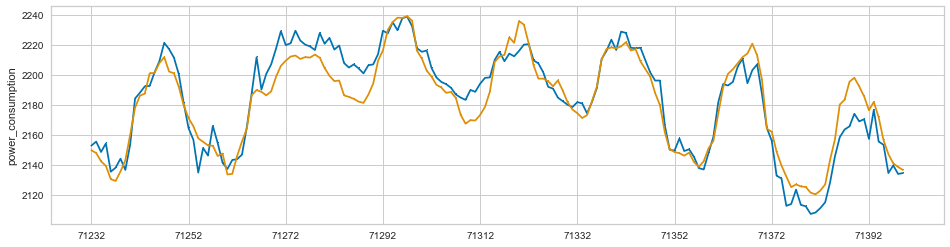

 35%|██████████████████████████▌                                                 | 35/100 [3:07:46<6:42:42, 371.74s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 71400 to 73439
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7572
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,10.4358,195.6679,13.9338,0.9396,0.0048,0.0036,1.6810
xgboost,Extreme Gradient Boosting,10.8025,208.4215,14.3310,0.9362,0.0049,0.0037,1.6540
et,Extra Trees Regressor,11.0614,215.5265,14.6171,0.9335,0.0050,0.0038,1.6710
gbr,Gradient Boosting Regressor,12.6885,266.4908,16.2772,0.9179,0.0056,0.0044,1.6460
rf,Random Forest Regressor,13.6837,321.0765,17.8499,0.9016,0.0061,0.0047,1.7440
knn,K Neighbors Regressor,17.9358,550.5062,23.4252,0.8299,0.0081,0.0062,1.5920
dt,Decision Tree Regressor,18.2699,661.5548,25.5964,0.7967,0.0088,0.0063,1.5790
ridge,Ridge Regression,19.8629,630.4591,25.0475,0.8046,0.0086,0.0069,1.5900
br,Bayesian Ridge,19.8750,631.0456,25.0578,0.8045,0.0086,0.0069,1.5870
lr,Linear Regression,19.8625,630.5181,25.0489,0.8046,0.0086,0.0069,1.5840


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,8.9059,145.6417,12.0682,0.9605,0.0041,0.0031
1,11.2310,229.4837,15.1487,0.9258,0.0052,0.0039
2,9.6882,153.6337,12.3949,0.9437,0.0043,0.0034
3,9.8925,169.6925,13.0266,0.9384,0.0045,0.0034
4,10.0128,168.7624,12.9909,0.9448,0.0045,0.0034
5,11.9043,267.2676,16.3483,0.9362,0.0056,0.0041
6,10.3327,185.2240,13.6097,0.9415,0.0047,0.0036
7,8.1330,116.1977,10.7795,0.9606,0.0037,0.0028
8,9.5854,167.0768,12.9258,0.9508,0.0044,0.0033


Transformation Pipeline and Model Successfully Saved


[Building #36]SMAPE : 0.8400478976679605


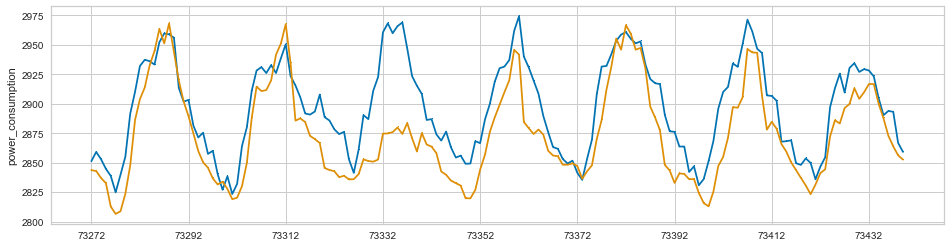

 36%|███████████████████████████▎                                                | 36/100 [3:14:05<6:38:38, 373.72s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 73440 to 75479
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2820
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,106.5995,55420.9821,229.1316,0.9857,0.0740,0.0395,1.6950
lightgbm,Light Gradient Boosting Machine,121.7738,51199.5593,221.6084,0.9867,0.0704,0.0427,1.7050
xgboost,Extreme Gradient Boosting,123.5022,61496.0525,239.2762,0.9841,0.0750,0.0433,1.6790
rf,Random Forest Regressor,123.0714,70780.2553,260.4488,0.9817,0.0801,0.0440,1.7560
gbr,Gradient Boosting Regressor,149.1738,79010.6302,278.9615,0.9797,0.0846,0.0517,1.6420
dt,Decision Tree Regressor,147.4857,117166.0018,334.8324,0.9699,0.1049,0.0554,1.5960
knn,K Neighbors Regressor,191.7438,150834.2211,385.7436,0.9614,0.1039,0.0611,1.6080
omp,Orthogonal Matching Pursuit,203.4261,140051.8359,372.3608,0.9641,0.0995,0.0627,1.5950
huber,Huber Regressor,187.7904,134835.9970,362.8941,0.9655,0.1066,0.0663,1.5980
br,Bayesian Ridge,195.0827,130573.1023,358.4846,0.9665,0.1113,0.0715,1.6020


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,113.5293,61679.1982,248.3530,0.9833,0.0798,0.0392
1,120.1283,49563.6612,222.6290,0.9871,0.0706,0.0395
2,129.4688,87988.0468,296.6278,0.9759,0.0968,0.0456
3,102.8534,34446.8339,185.5986,0.9913,0.0691,0.0407
4,94.1371,25984.8035,161.1980,0.9933,0.0501,0.0317
5,88.5429,38356.8607,195.8491,0.9907,0.0627,0.0355
6,132.5600,79168.5295,281.3690,0.9802,0.0909,0.0499
7,114.6662,58401.6144,241.6643,0.9852,0.0702,0.0401
8,93.5176,21464.9926,146.5094,0.9945,0.0515,0.0354


Transformation Pipeline and Model Successfully Saved


[Building #37]SMAPE : 3.8090090688207874


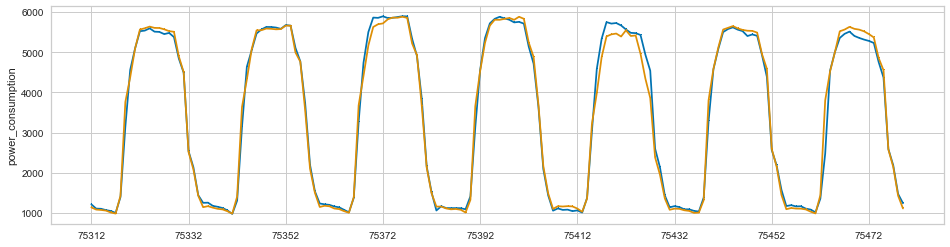

 37%|████████████████████████████                                                | 37/100 [3:20:26<6:34:41, 375.90s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 75480 to 77519
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,581
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,73.7583,34278.0037,180.7343,0.9770,0.1392,0.0643,1.7050
xgboost,Extreme Gradient Boosting,88.5860,47267.6773,210.3044,0.9681,0.1489,0.0707,1.6800
lightgbm,Light Gradient Boosting Machine,94.7931,47167.3896,210.9422,0.9683,0.1517,0.0785,1.7570
rf,Random Forest Regressor,93.4094,60627.1655,238.5202,0.9591,0.1684,0.0798,1.7820
gbr,Gradient Boosting Regressor,104.2226,55044.4234,229.0599,0.9629,0.1631,0.0850,1.6630
dt,Decision Tree Regressor,116.7038,127843.0591,344.4023,0.9138,0.2271,0.0941,1.6110
knn,K Neighbors Regressor,137.9889,121325.5840,341.7007,0.9190,0.2144,0.1107,1.6290
omp,Orthogonal Matching Pursuit,143.0772,109291.0785,326.0086,0.9269,0.2103,0.1135,1.6170
huber,Huber Regressor,135.5291,115942.5966,334.4896,0.9224,0.2200,0.1213,1.6100
br,Bayesian Ridge,147.5210,102777.4461,316.6057,0.9312,0.2126,0.1249,1.6120


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,74.7958,63112.1257,251.2213,0.9568,0.1785,0.0779
1,56.5511,13506.4247,116.2171,0.9904,0.0995,0.0486
2,71.6183,26507.0858,162.8100,0.9811,0.1389,0.0587
3,72.7797,34947.5980,186.9428,0.9775,0.1515,0.0664
4,81.6059,38868.6231,197.1513,0.9732,0.1248,0.0590
5,58.1712,17724.8064,133.1345,0.9889,0.1096,0.0506
6,97.4112,60866.7024,246.7118,0.9583,0.1681,0.0807
7,84.2185,29101.7094,170.5922,0.9810,0.1350,0.0663
8,68.1732,23970.6894,154.8247,0.9841,0.1167,0.0545


Transformation Pipeline and Model Successfully Saved


[Building #38]SMAPE : 4.432964980056968


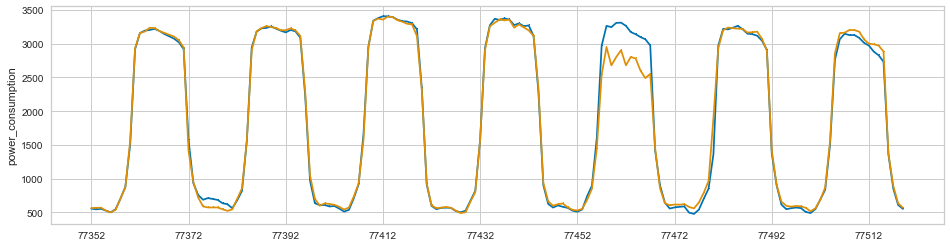

 38%|████████████████████████████▉                                               | 38/100 [3:26:50<6:31:07, 378.51s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 77520 to 79559
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,6801
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,53.1905,17940.9335,127.5821,0.9904,0.0871,0.0406,1.7160
xgboost,Extreme Gradient Boosting,68.6711,25783.3303,154.9538,0.9862,0.0952,0.0471,1.7130
lightgbm,Light Gradient Boosting Machine,71.0703,25036.6414,152.5843,0.9868,0.1000,0.0501,1.7450
rf,Random Forest Regressor,74.8643,42715.5852,198.5336,0.9774,0.1192,0.0555,1.7980
gbr,Gradient Boosting Regressor,82.4317,36254.7375,182.4684,0.9808,0.1234,0.0583,1.6640
dt,Decision Tree Regressor,87.0489,69909.4091,252.4580,0.9626,0.1558,0.0655,1.6170
knn,K Neighbors Regressor,96.5400,74634.3934,268.8765,0.9603,0.1457,0.0690,1.6400
omp,Orthogonal Matching Pursuit,110.8199,74491.8027,267.4085,0.9604,0.1430,0.0732,1.6180
huber,Huber Regressor,99.9952,77510.4019,269.0221,0.9588,0.1537,0.0790,1.6260
br,Bayesian Ridge,108.7186,71062.4775,261.8349,0.9623,0.1499,0.0810,1.6210


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,56.1194,17147.3427,130.9479,0.9909,0.0897,0.0458
1,64.0084,27468.2692,165.7355,0.9849,0.0917,0.0424
2,61.7174,23341.7037,152.7799,0.9870,0.0893,0.0385
3,69.4538,26366.6367,162.3781,0.9864,0.1375,0.0643
4,66.9895,19782.9848,140.6520,0.9901,0.0949,0.0481
5,57.1858,22742.0205,150.8046,0.9876,0.0782,0.0339
6,54.1777,17626.2206,132.7638,0.9905,0.1050,0.0470
7,52.3641,12654.4858,112.4922,0.9936,0.0838,0.0387
8,40.2280,4676.4410,68.3845,0.9977,0.0561,0.0302


Transformation Pipeline and Model Successfully Saved


[Building #39]SMAPE : 4.886893397725748


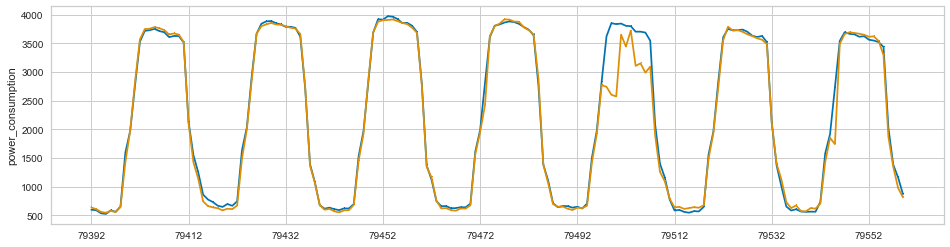

 39%|█████████████████████████████▋                                              | 39/100 [3:33:17<6:27:13, 380.88s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 79560 to 81599
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,5422
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,91.4872,35375.2900,181.4865,0.9820,0.1355,0.0798,1.6880
lightgbm,Light Gradient Boosting Machine,110.1100,43799.3525,203.9800,0.9778,0.1413,0.0885,1.7260
xgboost,Extreme Gradient Boosting,114.7345,61112.9465,234.9906,0.9689,0.1538,0.0910,1.7150
rf,Random Forest Regressor,119.9105,72133.4391,260.2795,0.9635,0.1717,0.1008,1.8030
gbr,Gradient Boosting Regressor,135.8368,69471.0317,258.5347,0.9647,0.1827,0.1152,1.6700
dt,Decision Tree Regressor,146.0345,140035.7857,351.7197,0.9293,0.2194,0.1201,1.6400
knn,K Neighbors Regressor,165.4173,134892.2953,363.3317,0.9318,0.2329,0.1462,1.6380
br,Bayesian Ridge,170.6251,124929.9750,349.7463,0.9367,0.2324,0.1519,1.6260
omp,Orthogonal Matching Pursuit,169.3598,127572.0148,353.2464,0.9354,0.2353,0.1521,1.6490
en,Elastic Net,169.3545,123657.4469,347.9214,0.9374,0.2337,0.1532,1.6220


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,123.3180,60140.0762,245.2347,0.9700,0.2039,0.1192
1,84.8102,24561.0014,156.7195,0.9875,0.1148,0.0692
2,89.0196,28512.9959,168.8579,0.9858,0.1237,0.0695
3,118.5213,62205.1768,249.4097,0.9701,0.1780,0.0973
4,71.0947,12345.3330,111.1096,0.9940,0.0855,0.0587
5,101.4552,37359.2272,193.2854,0.9816,0.1433,0.0834
6,83.5482,19522.8351,139.7241,0.9906,0.0886,0.0583
7,104.2720,44588.9498,211.1610,0.9768,0.1456,0.0894
8,69.4340,16453.1251,128.2697,0.9913,0.1062,0.0642


Transformation Pipeline and Model Successfully Saved


[Building #40]SMAPE : 11.163085899444734


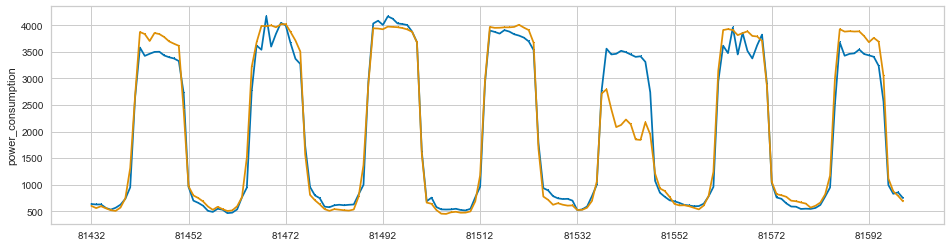

 40%|██████████████████████████████▍                                             | 40/100 [3:39:45<6:23:12, 383.20s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 81600 to 83639
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,5248
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,113.8375,37858.9421,192.5383,0.9885,0.0752,0.0471,1.7460
xgboost,Extreme Gradient Boosting,117.6502,44272.3867,208.4480,0.9865,0.0760,0.0476,1.7550
et,Extra Trees Regressor,111.1326,44545.6542,208.2505,0.9865,0.0833,0.0486,1.7080
rf,Random Forest Regressor,127.0798,54793.8002,231.7917,0.9833,0.0861,0.0523,1.8150
gbr,Gradient Boosting Regressor,144.5793,64013.6722,250.5727,0.9805,0.0982,0.0583,1.6990
br,Bayesian Ridge,159.3614,100556.4379,314.0282,0.9694,0.0990,0.0591,1.6330
huber,Huber Regressor,156.1072,101976.8594,315.8447,0.9689,0.1007,0.0594,1.6440
omp,Orthogonal Matching Pursuit,160.2202,100054.9750,313.1428,0.9695,0.0988,0.0595,1.6420
dt,Decision Tree Regressor,134.5335,63981.4076,247.1324,0.9805,0.0999,0.0598,1.6400
en,Elastic Net,161.3274,100192.8199,313.5720,0.9695,0.0998,0.0603,1.6440


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,91.2872,18524.9133,136.1063,0.9943,0.0571,0.0367
1,136.9900,63975.8645,252.9345,0.9807,0.0953,0.0620
2,111.3174,40557.8144,201.3897,0.9872,0.0816,0.0465
3,104.0267,36301.9898,190.5308,0.9893,0.0757,0.0428
4,96.1171,32590.1376,180.5274,0.9891,0.0643,0.0364
5,111.7697,33866.9578,184.0298,0.9898,0.0705,0.0430
6,110.2316,35645.6206,188.8005,0.9890,0.0599,0.0398
7,117.4553,35863.6687,189.3771,0.9895,0.0732,0.0501
8,113.0984,33693.0950,183.5568,0.9893,0.0721,0.0500


Transformation Pipeline and Model Successfully Saved


[Building #41]SMAPE : 4.266829498044554


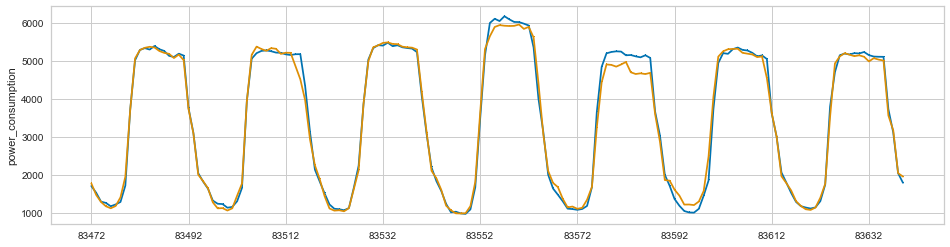

 41%|███████████████████████████████▏                                            | 41/100 [3:46:16<6:19:03, 385.49s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 83640 to 85679
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,4189
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,45.0121,14748.0367,111.7118,0.9907,0.0896,0.0412,1.7670
lightgbm,Light Gradient Boosting Machine,54.3508,14729.0090,116.1431,0.9907,0.0895,0.0466,1.7990
xgboost,Extreme Gradient Boosting,56.1436,23074.5987,138.9523,0.9854,0.1053,0.0481,1.7350
rf,Random Forest Regressor,56.9167,25142.3221,142.4384,0.9842,0.1071,0.0500,1.8170
dt,Decision Tree Regressor,68.7350,48384.5233,199.5836,0.9694,0.1438,0.0597,1.6640
knn,K Neighbors Regressor,76.3947,47006.1448,210.6921,0.9702,0.1423,0.0639,1.6630
gbr,Gradient Boosting Regressor,74.0962,33532.6871,171.6809,0.9788,0.1366,0.0698,1.7150
omp,Orthogonal Matching Pursuit,94.1194,56901.0309,234.1095,0.9640,0.1499,0.0728,1.6530
huber,Huber Regressor,89.7325,56665.5019,231.5176,0.9642,0.1552,0.0770,1.6630
par,Passive Aggressive Regressor,118.8360,64511.6639,249.2974,0.9591,0.1577,0.0895,1.6550


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,44.5589,9483.1978,97.3817,0.9934,0.0825,0.0418
1,32.6415,3263.1776,57.1242,0.9980,0.0492,0.0295
2,44.4179,11383.1468,106.6918,0.9927,0.1039,0.0418
3,55.9860,17377.0828,131.8222,0.9883,0.0963,0.0461
4,47.1100,8245.6982,90.8058,0.9947,0.0697,0.0388
5,37.6169,5109.7346,71.4824,0.9969,0.0718,0.0350
6,50.0134,7721.0791,87.8697,0.9951,0.0662,0.0407
7,42.2623,6762.3939,82.2338,0.9959,0.0535,0.0283
8,60.2405,44897.6800,211.8907,0.9729,0.1567,0.0635


Transformation Pipeline and Model Successfully Saved


[Building #42]SMAPE : 11.115747308445355


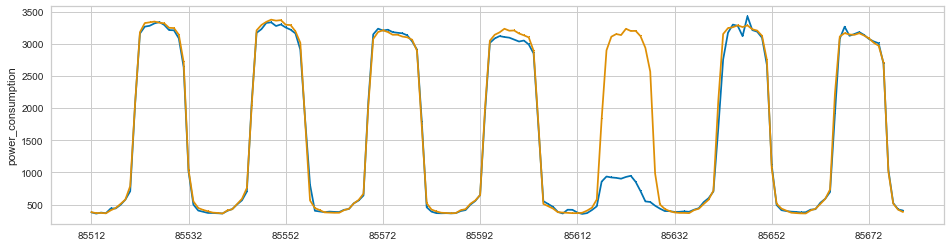

 42%|███████████████████████████████▉                                            | 42/100 [3:52:52<6:15:40, 388.64s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 85680 to 87719
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,6378
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,54.1784,6412.4910,79.6195,0.9972,0.0619,0.0414,1.7730
lightgbm,Light Gradient Boosting Machine,56.2475,6758.3371,81.7988,0.9970,0.0624,0.0430,1.7870
xgboost,Extreme Gradient Boosting,59.9441,7346.9253,85.4863,0.9968,0.0657,0.0457,1.7640
rf,Random Forest Regressor,61.8352,8104.2661,89.5246,0.9964,0.0661,0.0459,1.8610
gbr,Gradient Boosting Regressor,65.1993,8321.7153,90.7797,0.9963,0.0700,0.0503,1.7360
dt,Decision Tree Regressor,82.2627,15377.7582,123.3485,0.9932,0.0869,0.0578,1.6850
knn,K Neighbors Regressor,108.9353,27793.2492,166.3188,0.9877,0.0824,0.0626,1.6880
omp,Orthogonal Matching Pursuit,124.9357,34494.4006,185.4450,0.9847,0.0932,0.0743,1.6660
huber,Huber Regressor,117.6124,30584.9502,174.5763,0.9865,0.1004,0.0755,1.6770
par,Passive Aggressive Regressor,165.9093,66985.2775,246.9935,0.9710,0.1134,0.0889,1.6640


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,61.7550,8395.9422,91.6294,0.9966,0.0605,0.0427
1,47.0687,4825.1826,69.4635,0.9980,0.0511,0.0359
2,52.2542,5602.4826,74.8497,0.9976,0.0640,0.0409
3,54.0613,6519.8252,80.7454,0.9970,0.0657,0.0422
4,53.7220,6310.5975,79.4393,0.9970,0.0650,0.0439
5,59.2321,7665.2034,87.5511,0.9967,0.0526,0.0385
6,46.7628,4383.2477,66.2061,0.9980,0.0631,0.0435
7,51.8733,6328.1443,79.5496,0.9971,0.0666,0.0426
8,48.3288,4320.5366,65.7308,0.9981,0.0553,0.0374


Transformation Pipeline and Model Successfully Saved


[Building #43]SMAPE : 4.76009404292763


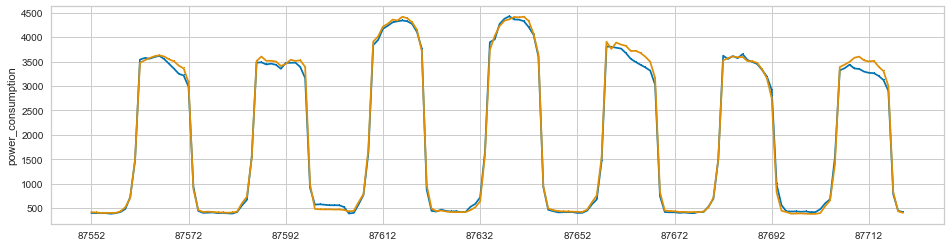

 43%|████████████████████████████████▋                                           | 43/100 [3:59:32<6:12:17, 391.89s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 87720 to 89759
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,8663
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,46.4045,4938.7678,69.7749,0.9980,0.0360,0.0266,1.8270
lightgbm,Light Gradient Boosting Machine,50.1568,5472.0431,73.5036,0.9978,0.0413,0.0302,1.8010
xgboost,Extreme Gradient Boosting,53.4610,6646.0806,81.0339,0.9973,0.0435,0.0309,1.7820
rf,Random Forest Regressor,58.2259,7881.1883,88.5096,0.9968,0.0449,0.0326,1.8460
gbr,Gradient Boosting Regressor,60.1514,7544.8892,86.6241,0.9969,0.0501,0.0369,1.7510
dt,Decision Tree Regressor,79.3147,15616.2407,124.1098,0.9936,0.0608,0.0425,1.6820
knn,K Neighbors Regressor,110.1183,29039.1346,170.0979,0.9881,0.0644,0.0503,1.6990
omp,Orthogonal Matching Pursuit,118.9804,33146.4586,181.3582,0.9865,0.0677,0.0537,1.6830
huber,Huber Regressor,114.0842,28497.7719,168.0259,0.9884,0.0818,0.0613,1.7060
lr,Linear Regression,112.7907,22718.8203,150.2798,0.9907,0.1448,0.0836,1.6880


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,40.2761,3408.7212,58.3843,0.9985,0.0295,0.0225
1,51.5074,6508.1953,80.6734,0.9974,0.0373,0.0287
2,39.6732,3906.9531,62.5056,0.9985,0.0346,0.0255
3,45.2852,4587.2566,67.7293,0.9982,0.0386,0.0269
4,48.6141,5275.7149,72.6341,0.9977,0.0396,0.0302
5,54.1366,6080.9252,77.9803,0.9976,0.0362,0.0275
6,44.1995,3885.5159,62.3339,0.9985,0.0440,0.0291
7,37.1742,3487.1869,59.0524,0.9986,0.0358,0.0258
8,44.2320,3999.1545,63.2389,0.9983,0.0365,0.0265


Transformation Pipeline and Model Successfully Saved


[Building #44]SMAPE : 4.205079555146461


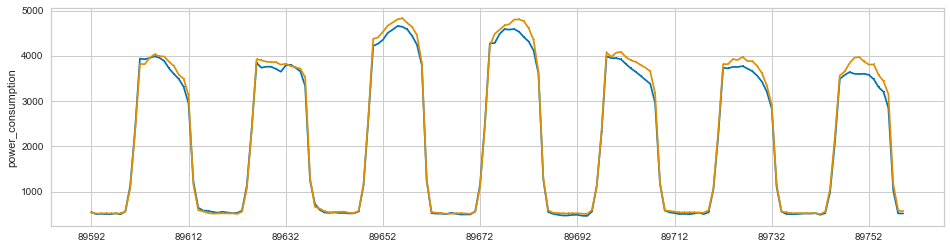

 44%|█████████████████████████████████▍                                          | 44/100 [4:06:15<6:09:05, 395.46s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 89760 to 91799
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,2506
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,58.2090,6252.5199,78.4971,0.9817,0.0292,0.0209,1.8320
et,Extra Trees Regressor,59.0631,6559.8778,80.6275,0.9809,0.0297,0.0212,1.7870
xgboost,Extreme Gradient Boosting,62.9310,7321.4570,84.8765,0.9788,0.0314,0.0225,1.7990
gbr,Gradient Boosting Regressor,68.9915,8098.3380,89.5667,0.9764,0.0328,0.0246,1.7720
rf,Random Forest Regressor,69.2403,8959.4324,93.6064,0.9739,0.0347,0.0250,1.8670
dt,Decision Tree Regressor,92.8056,17826.0155,131.2097,0.9480,0.0478,0.0331,1.7120
lasso,Lasso Regression,96.6268,17310.5414,131.0620,0.9492,0.0469,0.0347,1.7050
llar,Lasso Least Angle Regression,96.6299,17310.4687,131.0624,0.9492,0.0469,0.0347,1.7020
br,Bayesian Ridge,96.7085,17345.6453,131.2041,0.9491,0.0469,0.0347,1.7070
lr,Linear Regression,97.0030,17344.5602,131.2557,0.9492,0.0469,0.0348,1.7070


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,51.7111,4942.7236,70.3045,0.9880,0.0270,0.0186
1,60.3264,6786.1594,82.3781,0.9824,0.0295,0.0211
2,59.2063,6194.5168,78.7053,0.9829,0.0282,0.0208
3,52.0197,4516.5445,67.2052,0.9877,0.0237,0.0180
4,49.4028,4278.9374,65.4136,0.9869,0.0245,0.0179
5,55.3305,5107.1549,71.4644,0.9836,0.0275,0.0206
6,62.1016,8155.2747,90.3066,0.9750,0.0358,0.0236
7,53.2870,4752.4818,68.9382,0.9856,0.0256,0.0191
8,57.9822,6603.9883,81.2649,0.9790,0.0295,0.0209


Transformation Pipeline and Model Successfully Saved


[Building #45]SMAPE : 1.9709105573759915


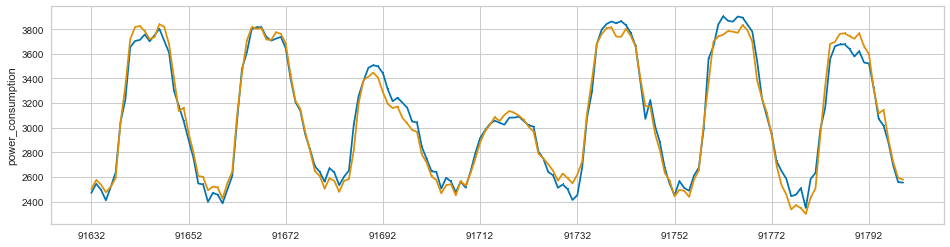

 45%|██████████████████████████████████▏                                         | 45/100 [4:13:03<6:05:51, 399.12s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 91800 to 93839
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7653
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,72.4873,10143.2751,100.4225,0.9746,0.0473,0.0342,1.8000
lightgbm,Light Gradient Boosting Machine,77.1443,11175.3365,104.9525,0.9722,0.0494,0.0364,1.8510
xgboost,Extreme Gradient Boosting,78.8887,11746.6296,108.0853,0.9708,0.0505,0.0370,1.8100
rf,Random Forest Regressor,80.8478,12601.7202,111.7500,0.9685,0.0526,0.0380,1.9030
gbr,Gradient Boosting Regressor,89.8551,14247.4033,118.8883,0.9646,0.0553,0.0422,1.7800
dt,Decision Tree Regressor,103.5838,23620.0071,152.7867,0.9407,0.0720,0.0489,1.7360
br,Bayesian Ridge,116.6249,23764.3668,153.1869,0.9409,0.0725,0.0550,1.7290
lasso,Lasso Regression,116.7675,23760.5871,153.1879,0.9409,0.0725,0.0551,1.7360
llar,Lasso Least Angle Regression,116.7586,23755.6416,153.1730,0.9409,0.0724,0.0551,1.7260
ridge,Ridge Regression,117.1363,23755.6910,153.2229,0.9409,0.0727,0.0553,1.7260


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,67.1970,8020.5207,89.5574,0.9780,0.0418,0.0310
1,78.2340,10585.6490,102.8866,0.9698,0.0507,0.0378
2,70.9902,9177.0338,95.7968,0.9780,0.0465,0.0346
3,68.7101,9125.2412,95.5261,0.9757,0.0440,0.0326
4,68.1989,8021.2338,89.5613,0.9818,0.0416,0.0317
5,64.3116,8973.8277,94.7303,0.9765,0.0442,0.0303
6,87.3551,14362.2526,119.8426,0.9670,0.0565,0.0415
7,67.5461,8919.4638,94.4429,0.9798,0.0460,0.0316
8,70.9042,7881.5633,88.7782,0.9795,0.0415,0.0326


Transformation Pipeline and Model Successfully Saved


[Building #46]SMAPE : 4.640408347680067


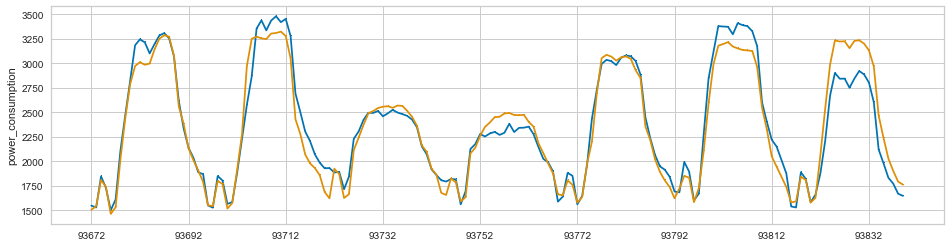

 46%|██████████████████████████████████▉                                         | 46/100 [4:19:55<6:02:44, 403.05s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 93840 to 95879
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,7430
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,116.6930,26651.5867,162.5862,0.9752,0.0316,0.0224,1.8110
xgboost,Extreme Gradient Boosting,132.5598,32828.4963,180.6037,0.9696,0.0353,0.0255,1.8170
lightgbm,Light Gradient Boosting Machine,132.9014,32739.9304,180.7294,0.9696,0.0352,0.0256,1.8570
rf,Random Forest Regressor,143.9057,40584.3258,200.9198,0.9622,0.0391,0.0278,1.9370
gbr,Gradient Boosting Regressor,147.0254,36048.9891,189.3768,0.9665,0.0372,0.0285,1.7980
dt,Decision Tree Regressor,181.8288,71562.7147,265.7115,0.9326,0.0517,0.0349,1.7370
br,Bayesian Ridge,201.5964,75382.3145,272.4569,0.9297,0.0531,0.0393,1.7400
lasso,Lasso Regression,202.0309,75070.1098,271.9431,0.9299,0.0531,0.0394,1.7400
llar,Lasso Least Angle Regression,202.0286,75075.1625,271.9515,0.9299,0.0531,0.0394,1.7400
lr,Linear Regression,203.0396,75348.2238,272.4855,0.9297,0.0532,0.0396,1.7440


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,108.8282,21137.5236,145.3875,0.9774,0.0277,0.0205
1,120.9290,25723.9872,160.3870,0.9770,0.0313,0.0231
2,106.3388,19411.0897,139.3237,0.9828,0.0286,0.0215
3,128.3729,28855.0910,169.8679,0.9681,0.0337,0.0255
4,133.7947,35593.9433,188.6636,0.9687,0.0352,0.0250
5,121.5837,27820.2709,166.7941,0.9758,0.0341,0.0242
6,121.9846,29413.9532,171.5050,0.9783,0.0324,0.0224
7,112.2435,27948.8578,167.1791,0.9756,0.0317,0.0212
8,104.1272,23294.8503,152.6265,0.9768,0.0307,0.0204


Transformation Pipeline and Model Successfully Saved


[Building #47]SMAPE : 4.197576475398446


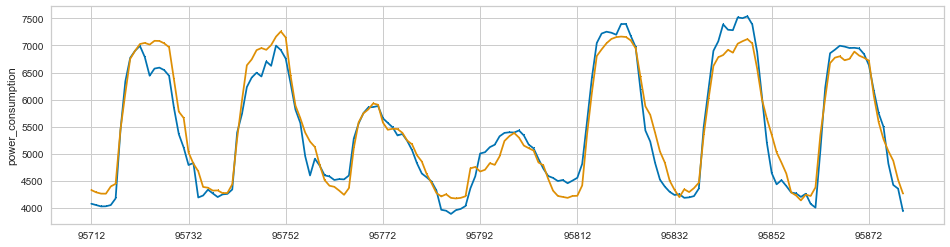

 47%|███████████████████████████████████▋                                        | 47/100 [4:26:50<5:59:08, 406.57s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 95880 to 97919
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,8065
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,36.0342,2626.6429,50.9977,0.9869,0.0281,0.0196,1.8590
lightgbm,Light Gradient Boosting Machine,38.3173,3146.0552,55.6524,0.9842,0.0296,0.0205,1.9120
xgboost,Extreme Gradient Boosting,39.3448,3123.5229,55.5655,0.9843,0.0298,0.0211,1.8280
gbr,Gradient Boosting Regressor,43.3228,3601.9453,59.5428,0.9819,0.0315,0.0232,1.8070
rf,Random Forest Regressor,43.5146,3770.3303,61.2094,0.9813,0.0328,0.0235,1.9300
dt,Decision Tree Regressor,55.8960,6283.2288,78.8863,0.9684,0.0418,0.0301,1.7690
lasso,Lasso Regression,64.8438,9277.0274,95.2036,0.9543,0.0528,0.0356,1.7540
llar,Lasso Least Angle Regression,64.8415,9276.6317,95.2019,0.9543,0.0528,0.0356,1.7620
br,Bayesian Ridge,64.9312,9273.8713,95.2190,0.9543,0.0530,0.0357,1.7530
lr,Linear Regression,65.3324,9270.2089,95.2392,0.9543,0.0532,0.0360,1.7630


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,33.8688,2169.6802,46.5798,0.9896,0.0243,0.0180
1,32.5721,1794.1698,42.3576,0.9922,0.0223,0.0175
2,39.8633,2864.9257,53.5250,0.9864,0.0297,0.0216
3,37.2778,2745.4160,52.3967,0.9863,0.0293,0.0211
4,29.8450,1574.5106,39.6801,0.9927,0.0209,0.0159
5,37.1168,3168.0316,56.2853,0.9854,0.0322,0.0200
6,35.3547,2192.3583,46.8226,0.9903,0.0245,0.0186
7,36.9465,3512.1890,59.2637,0.9764,0.0354,0.0214
8,33.9825,2944.2818,54.2612,0.9840,0.0293,0.0183


Transformation Pipeline and Model Successfully Saved


[Building #48]SMAPE : 1.904081702046885


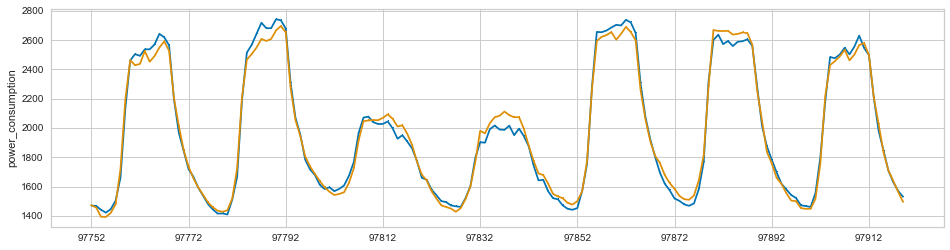

 48%|████████████████████████████████████▍                                       | 48/100 [4:33:49<5:55:33, 410.26s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 97920 to 99959
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nul

,Description,Value
0,Session id,218
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,52.9067,5354.2736,72.5627,0.9821,0.0244,0.0177,1.8950
et,Extra Trees Regressor,53.1068,5562.7437,74.1984,0.9815,0.0255,0.0180,1.8950
xgboost,Extreme Gradient Boosting,59.0219,6675.2962,81.4240,0.9778,0.0274,0.0198,1.8520
rf,Random Forest Regressor,64.8182,7532.2497,86.5025,0.9749,0.0294,0.0218,1.9500
gbr,Gradient Boosting Regressor,68.3939,7964.0336,89.0309,0.9735,0.0298,0.0229,1.8260
dt,Decision Tree Regressor,85.0989,15066.0852,122.4627,0.9497,0.0417,0.0287,1.7710
ridge,Ridge Regression,85.4847,13859.1955,116.9144,0.9536,0.0402,0.0292,1.7820
br,Bayesian Ridge,85.4083,13863.6433,116.9166,0.9536,0.0401,0.0292,1.7660
lr,Linear Regression,85.5005,13861.7426,116.9267,0.9536,0.0402,0.0292,1.7810
lasso,Lasso Regression,85.3959,13874.1952,116.9490,0.9536,0.0401,0.0292,1.7690


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,54.4417,4687.5834,68.4659,0.9877,0.0232,0.0181
1,52.6694,4870.4719,69.7888,0.9782,0.0232,0.0176
2,47.3201,3971.9772,63.0236,0.9884,0.0207,0.0157
3,52.8996,5067.0301,71.1831,0.9833,0.0237,0.0176
4,55.0779,5465.9470,73.9320,0.9799,0.0247,0.0182
5,54.3299,6021.0999,77.5957,0.9816,0.0276,0.0188
6,41.7400,3412.7252,58.4185,0.9885,0.0204,0.0143
7,53.7156,5442.2177,73.7714,0.9806,0.0248,0.0181
8,51.9768,6299.5292,79.3696,0.9807,0.0277,0.0176


Transformation Pipeline and Model Successfully Saved


[Building #49]SMAPE : 2.3389847401856514


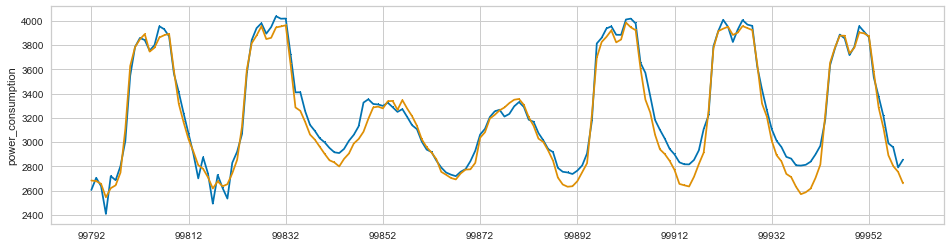

 49%|█████████████████████████████████████▏                                      | 49/100 [4:40:52<5:51:52, 413.98s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 99960 to 101999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-nu

,Description,Value
0,Session id,3919
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,48.7290,5281.9012,71.9492,0.9832,0.0261,0.0170,1.8830
lightgbm,Light Gradient Boosting Machine,51.3582,5402.9943,72.7825,0.9828,0.0255,0.0177,1.9240
xgboost,Extreme Gradient Boosting,53.3564,5448.4634,73.3407,0.9826,0.0262,0.0185,1.8580
gbr,Gradient Boosting Regressor,57.9781,6147.0152,78.0449,0.9804,0.0276,0.0201,1.8410
rf,Random Forest Regressor,58.3226,7230.4169,84.2555,0.9770,0.0299,0.0202,1.9390
lasso,Lasso Regression,74.0205,10817.1012,102.7203,0.9656,0.0357,0.0257,1.7920
llar,Lasso Least Angle Regression,74.0137,10814.7574,102.7099,0.9656,0.0357,0.0257,1.7990
br,Bayesian Ridge,74.1829,10809.7798,102.6801,0.9656,0.0357,0.0257,1.7900
ridge,Ridge Regression,74.4477,10812.4432,102.7132,0.9656,0.0357,0.0258,1.7840
lr,Linear Regression,74.4893,10815.4417,102.7299,0.9656,0.0357,0.0258,1.8020


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,51.5068,4810.8353,69.3602,0.9844,0.0236,0.0174
1,45.3269,3512.3279,59.2649,0.9892,0.0205,0.0153
2,42.2624,3488.7169,59.0654,0.9903,0.0212,0.0148
3,43.6560,4090.9288,63.9604,0.9843,0.0226,0.0152
4,53.5028,7343.1905,85.6924,0.9749,0.0312,0.0188
5,55.3748,6927.8216,83.2335,0.9770,0.0317,0.0199
6,48.1430,4139.3711,64.3379,0.9867,0.0225,0.0165
7,42.4741,3335.2468,57.7516,0.9907,0.0202,0.0145
8,47.4342,4598.2012,67.8100,0.9860,0.0248,0.0167


Transformation Pipeline and Model Successfully Saved


[Building #50]SMAPE : 2.605102887324352


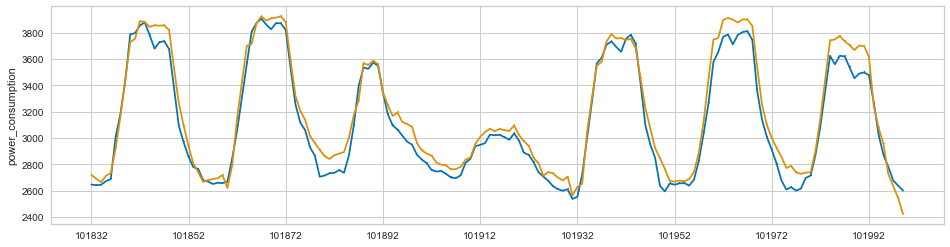

 50%|██████████████████████████████████████                                      | 50/100 [4:47:57<5:47:50, 417.41s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 102000 to 104039
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,2643
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,66.8557,8312.4301,90.5145,0.9789,0.0361,0.0264,1.9410
et,Extra Trees Regressor,67.9009,8792.4076,93.1448,0.9777,0.0371,0.0269,1.9320
xgboost,Extreme Gradient Boosting,70.6288,9150.7187,95.3181,0.9769,0.0382,0.0279,1.9090
rf,Random Forest Regressor,74.8257,10444.0903,101.8193,0.9736,0.0405,0.0295,1.9890
gbr,Gradient Boosting Regressor,75.8297,10345.4964,101.3199,0.9741,0.0402,0.0299,1.8730
lasso,Lasso Regression,99.3948,19652.7715,139.3113,0.9505,0.0554,0.0395,1.8250
llar,Lasso Least Angle Regression,99.3808,19654.6005,139.3182,0.9505,0.0554,0.0395,1.8010
br,Bayesian Ridge,99.6875,19670.4768,139.3875,0.9504,0.0554,0.0396,1.8200
ridge,Ridge Regression,100.4331,19663.7722,139.3899,0.9504,0.0555,0.0399,1.8050
lr,Linear Regression,100.5706,19668.5543,139.4100,0.9504,0.0555,0.0400,1.8070


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,66.7019,8518.8290,92.2975,0.9754,0.0366,0.0262
1,63.3402,7193.7976,84.8163,0.9837,0.0356,0.0262
2,71.0306,12785.8586,113.0746,0.9628,0.0445,0.0274
3,61.9700,6743.0049,82.1158,0.9813,0.0330,0.0243
4,64.7809,8457.8878,91.9668,0.9806,0.0367,0.0264
5,65.2575,6899.4308,83.0628,0.9831,0.0360,0.0273
6,59.7586,6093.6427,78.0618,0.9868,0.0304,0.0231
7,54.8652,5441.9722,73.7697,0.9861,0.0304,0.0218
8,67.7896,7760.0074,88.0909,0.9808,0.0330,0.0253


Transformation Pipeline and Model Successfully Saved


[Building #51]SMAPE : 2.886970643625306


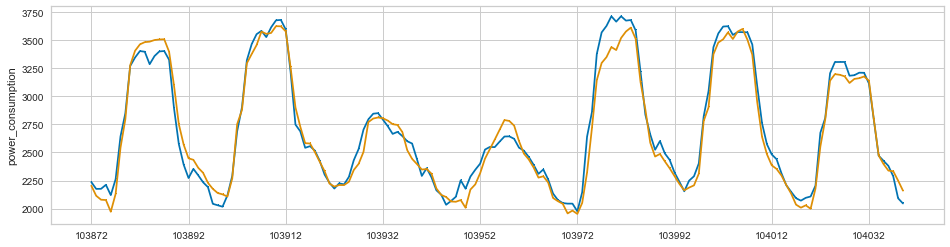

 51%|██████████████████████████████████████▊                                     | 51/100 [4:55:08<5:44:05, 421.34s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 104040 to 106079
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5309
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,57.6379,7248.3489,84.4140,0.9807,0.0440,0.0295,1.9200
lightgbm,Light Gradient Boosting Machine,62.8888,9214.5646,95.0214,0.9755,0.0480,0.0316,1.9190
xgboost,Extreme Gradient Boosting,63.7233,8197.0434,89.7728,0.9780,0.0467,0.0326,1.8960
rf,Random Forest Regressor,64.8841,9376.0362,96.3721,0.9750,0.0496,0.0331,1.9880
gbr,Gradient Boosting Regressor,67.6908,9260.2896,95.5699,0.9753,0.0495,0.0346,1.8800
dt,Decision Tree Regressor,80.8090,15616.7536,123.2604,0.9585,0.0629,0.0407,1.8210
lasso,Lasso Regression,88.5885,16912.7903,129.3297,0.9551,0.0661,0.0458,1.8130
llar,Lasso Least Angle Regression,88.5859,16909.6471,129.3149,0.9551,0.0661,0.0458,1.8280
br,Bayesian Ridge,88.7579,16891.1823,129.2842,0.9552,0.0663,0.0459,1.8200
ridge,Ridge Regression,89.4673,16886.6288,129.3189,0.9552,0.0666,0.0463,1.8260


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,63.8138,8761.6757,93.6038,0.9778,0.0482,0.0331
1,55.4598,6389.4258,79.9339,0.9837,0.0448,0.0293
2,55.1367,6272.1536,79.1969,0.9826,0.0403,0.0272
3,63.0176,8376.6697,91.5241,0.9790,0.0456,0.0310
4,57.2597,6487.8459,80.5472,0.9806,0.0409,0.0290
5,70.5451,12436.0770,111.5172,0.9660,0.0547,0.0340
6,54.0182,6068.8802,77.9030,0.9825,0.0394,0.0268
7,59.8600,6719.7235,81.9739,0.9837,0.0443,0.0315
8,50.5475,7950.8851,89.1677,0.9794,0.0488,0.0272


Transformation Pipeline and Model Successfully Saved


[Building #52]SMAPE : 2.836375978458046


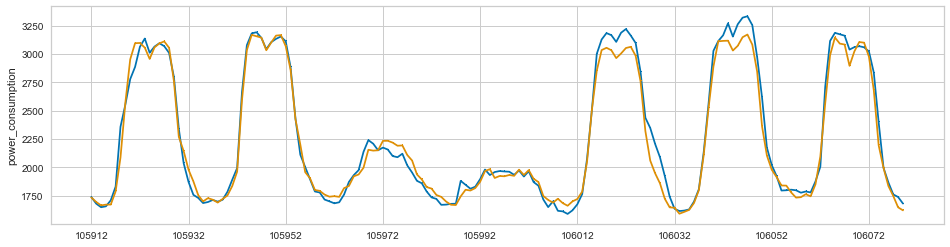

 52%|███████████████████████████████████████▌                                    | 52/100 [5:02:21<5:40:03, 425.06s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 106080 to 108119
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,6718
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,110.7490,32739.6058,179.2341,0.9743,0.1284,0.0776,1.9420
xgboost,Extreme Gradient Boosting,116.4120,33872.6773,183.1177,0.9735,0.1287,0.0799,1.9810
lightgbm,Light Gradient Boosting Machine,126.2288,36531.2320,190.1559,0.9713,0.1379,0.0866,2.0130
rf,Random Forest Regressor,128.4663,46700.0537,213.3513,0.9633,0.1464,0.0911,2.0520
gbr,Gradient Boosting Regressor,143.4505,44400.3615,210.2856,0.9652,0.1464,0.0989,1.8840
dt,Decision Tree Regressor,158.0803,85082.5568,288.7240,0.9330,0.1935,0.1060,1.8410
huber,Huber Regressor,201.2642,127696.8944,352.6805,0.8998,0.2250,0.1493,1.8240
omp,Orthogonal Matching Pursuit,219.5534,140726.8617,371.3799,0.8896,0.2308,0.1559,1.8380
knn,K Neighbors Regressor,223.5308,149569.0328,383.4195,0.8829,0.2384,0.1590,1.8600
en,Elastic Net,209.3010,114856.1590,335.4840,0.9099,0.2303,0.1591,1.8380


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,91.2546,19576.2959,139.9153,0.9851,0.0984,0.0615
1,107.5080,25819.3459,160.6840,0.9790,0.1223,0.0782
2,105.9689,29920.0780,172.9742,0.9779,0.1292,0.0802
3,109.9172,31640.8147,177.8787,0.9758,0.1196,0.0687
4,116.4853,45097.9912,212.3629,0.9635,0.1630,0.0913
5,123.5070,38242.9601,195.5581,0.9683,0.1235,0.0789
6,106.8260,30320.8150,174.1287,0.9768,0.1172,0.0690
7,111.4838,27191.1060,164.8973,0.9788,0.1111,0.0698
8,103.7033,31540.1351,177.5954,0.9763,0.1346,0.0786


Transformation Pipeline and Model Successfully Saved


[Building #53]SMAPE : 9.837710378989287


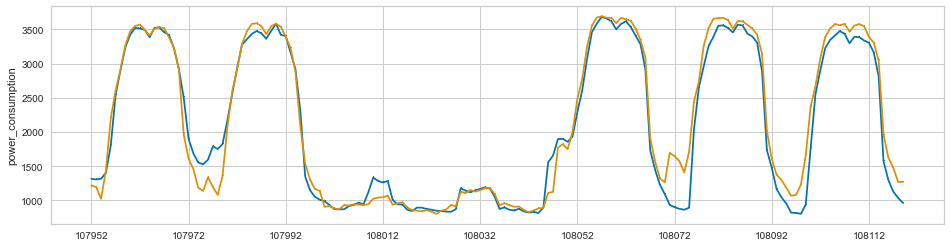

 53%|████████████████████████████████████████▎                                   | 53/100 [5:09:39<5:35:58, 428.90s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 108120 to 110159
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5374
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,103.2916,27504.5599,164.0180,0.9782,0.1160,0.0708,1.9410
rf,Random Forest Regressor,113.8157,32553.4904,178.1252,0.9741,0.1239,0.0774,2.0150
xgboost,Extreme Gradient Boosting,111.9762,28124.2846,166.5813,0.9777,0.1226,0.0800,1.9250
lightgbm,Light Gradient Boosting Machine,110.5579,26139.3829,160.4529,0.9793,0.1213,0.0821,1.9630
dt,Decision Tree Regressor,142.5527,59391.3242,241.3165,0.9529,0.1663,0.0946,1.8380
gbr,Gradient Boosting Regressor,136.7394,36723.2666,190.8601,0.9709,0.1512,0.1088,1.8980
knn,K Neighbors Regressor,174.0412,70641.3781,265.0488,0.9440,0.1857,0.1221,1.8460
huber,Huber Regressor,165.9467,59825.0708,243.3158,0.9525,0.1810,0.1271,1.8420
omp,Orthogonal Matching Pursuit,172.7828,63812.3199,251.4880,0.9494,0.1816,0.1287,1.8350
en,Elastic Net,168.2178,57557.7480,238.9477,0.9543,0.1985,0.1393,1.8340


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,102.7456,25886.3160,160.8922,0.9795,0.1103,0.0657
1,101.3992,27082.1442,164.5665,0.9768,0.1137,0.0689
2,123.9872,47523.5935,217.9991,0.9646,0.1364,0.0814
3,98.8451,20813.2003,144.2678,0.9831,0.1098,0.0691
4,126.2282,36405.8723,190.8032,0.9702,0.1435,0.0904
5,90.6244,19998.3121,141.4154,0.9841,0.0929,0.0610
6,104.6005,26133.0381,161.6572,0.9813,0.1221,0.0731
7,115.0194,34854.3301,186.6931,0.9703,0.1244,0.0772
8,120.3103,34599.8514,186.0104,0.9719,0.1265,0.0820


Transformation Pipeline and Model Successfully Saved


[Building #54]SMAPE : 17.4105307664148


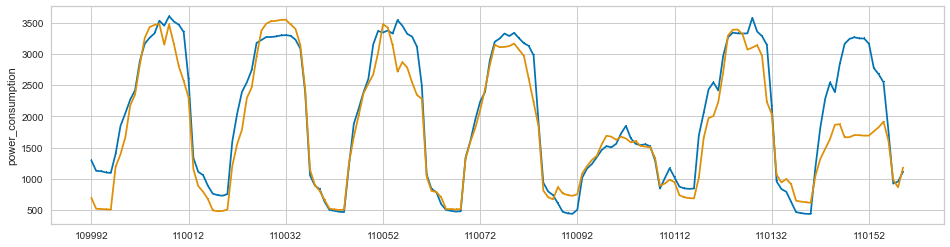

 54%|█████████████████████████████████████████                                   | 54/100 [5:16:59<5:31:16, 432.10s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 110160 to 112199
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5938
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,9.5244,178.5413,13.2976,0.9779,0.0132,0.0094,1.9600
rf,Random Forest Regressor,10.1570,215.8816,14.5734,0.9733,0.0143,0.0100,2.0060
lightgbm,Light Gradient Boosting Machine,10.2367,215.4584,14.5266,0.9733,0.0142,0.0101,1.9900
xgboost,Extreme Gradient Boosting,10.6630,215.4923,14.6384,0.9734,0.0143,0.0105,1.9560
gbr,Gradient Boosting Regressor,10.8282,232.2451,15.1469,0.9712,0.0148,0.0106,1.9110
dt,Decision Tree Regressor,13.9017,411.4294,20.1885,0.9491,0.0198,0.0137,1.8440
knn,K Neighbors Regressor,14.1524,628.8522,24.6484,0.9227,0.0239,0.0139,1.8650
huber,Huber Regressor,14.7221,662.3286,25.2828,0.9185,0.0246,0.0146,1.8510
en,Elastic Net,15.1649,612.5748,24.4816,0.9245,0.0239,0.0150,1.8420
lasso,Lasso Regression,15.2217,584.1199,23.9107,0.9279,0.0234,0.0151,1.8500


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,9.1998,144.0046,12.0002,0.9839,0.0119,0.0091
1,10.0379,188.8642,13.7428,0.9760,0.0134,0.0098
2,9.9141,200.2474,14.1509,0.9747,0.0141,0.0099
3,9.6115,168.6868,12.9879,0.9793,0.0127,0.0094
4,10.1362,273.3967,16.5347,0.9659,0.0166,0.0101
5,10.5487,199.6910,14.1312,0.9755,0.0136,0.0103
6,10.1488,251.1058,15.8463,0.9703,0.0161,0.0102
7,8.2408,125.2962,11.1936,0.9850,0.0110,0.0082
8,9.2964,154.0985,12.4136,0.9799,0.0120,0.0091


Transformation Pipeline and Model Successfully Saved


[Building #55]SMAPE : 1.5166516968279071


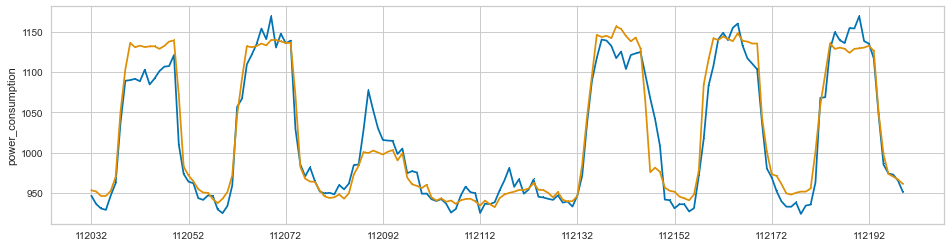

 55%|█████████████████████████████████████████▊                                  | 55/100 [5:24:21<5:26:20, 435.13s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 112200 to 114239
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,556
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,25.4336,4568.5399,54.6349,0.9149,0.0141,0.0063,1.9550
lightgbm,Light Gradient Boosting Machine,26.7064,3346.2734,49.2373,0.9391,0.0126,0.0066,1.9560
xgboost,Extreme Gradient Boosting,27.7880,4444.9023,56.3992,0.9154,0.0147,0.0068,1.9400
rf,Random Forest Regressor,28.9589,4658.6011,57.7851,0.9126,0.0148,0.0071,2.0450
gbr,Gradient Boosting Regressor,31.1908,4010.6223,55.4465,0.9250,0.0142,0.0077,1.9090
dt,Decision Tree Regressor,37.5499,5827.4013,70.6822,0.8842,0.0185,0.0092,1.8650
lasso,Lasso Regression,42.0811,5128.8401,66.7157,0.9011,0.0168,0.0103,1.8590
llar,Lasso Least Angle Regression,42.1255,5149.4940,66.9269,0.9007,0.0168,0.0103,1.8670
br,Bayesian Ridge,42.4933,5121.7202,66.7137,0.9012,0.0168,0.0104,1.8630
lr,Linear Regression,42.7748,5121.2162,66.7394,0.9011,0.0168,0.0105,1.8680


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,26.5707,1690.8727,41.1202,0.9631,0.0100,0.0064
1,22.8876,1458.6555,38.1923,0.9672,0.0094,0.0056
2,24.5036,1318.7723,36.3149,0.9720,0.0086,0.0058
3,31.6777,20943.4943,144.7187,0.6716,0.0430,0.0094
4,22.0617,863.7709,29.3900,0.9827,0.0070,0.0053
5,22.9707,1126.2629,33.5598,0.9790,0.0081,0.0055
6,22.4508,937.6328,30.6208,0.9816,0.0074,0.0054
7,28.1534,6113.5538,78.1892,0.8665,0.0189,0.0067
8,20.8366,938.9497,30.6423,0.9750,0.0074,0.0050


Transformation Pipeline and Model Successfully Saved


[Building #56]SMAPE : 0.6282590730494959


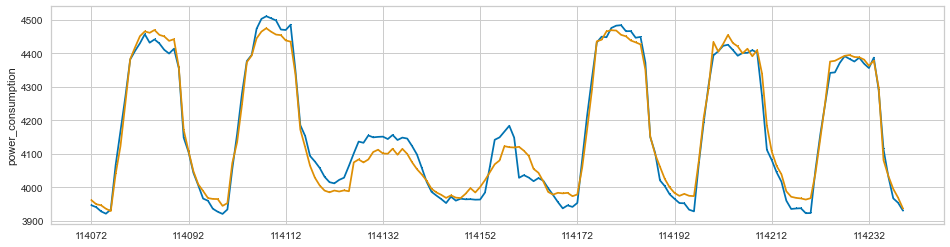

 56%|██████████████████████████████████████████▌                                 | 56/100 [5:31:44<5:20:51, 437.53s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 114240 to 116279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,3697
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,72.0020,10558.5731,101.7830,0.9856,0.0605,0.0427,1.9900
xgboost,Extreme Gradient Boosting,75.0579,11574.8376,106.7113,0.9842,0.0628,0.0442,1.9510
et,Extra Trees Regressor,74.6205,11914.4723,108.0663,0.9837,0.0678,0.0459,1.9680
gbr,Gradient Boosting Regressor,78.3832,11623.1576,106.9925,0.9842,0.0648,0.0471,1.9280
rf,Random Forest Regressor,82.5669,14827.5796,120.7998,0.9798,0.0707,0.0489,2.0640
huber,Huber Regressor,99.1063,20764.2737,142.3961,0.9717,0.0790,0.0579,1.8730
omp,Orthogonal Matching Pursuit,106.2208,24189.1744,153.9244,0.9671,0.0792,0.0581,1.8660
en,Elastic Net,98.9201,19518.8995,138.3336,0.9734,0.0834,0.0603,1.8930
br,Bayesian Ridge,98.7700,18298.8864,134.2803,0.9751,0.0850,0.0615,1.8700
lasso,Lasso Regression,99.1376,18245.8294,134.1299,0.9752,0.0852,0.0619,1.8710


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,55.4070,5498.1602,74.1496,0.9924,0.0447,0.0327
1,70.7420,8880.7878,94.2379,0.9886,0.0540,0.0411
2,66.3572,9064.9470,95.2100,0.9889,0.0544,0.0380
3,63.5763,7825.6808,88.4629,0.9897,0.0545,0.0385
4,63.3074,8354.5985,91.4035,0.9882,0.0561,0.0385
5,79.7056,13367.6627,115.6186,0.9805,0.0692,0.0454
6,75.5788,12527.1695,111.9248,0.9831,0.0658,0.0463
7,72.8313,8873.7604,94.2006,0.9878,0.0586,0.0444
8,80.7843,13188.5922,114.8416,0.9828,0.0713,0.0495


Transformation Pipeline and Model Successfully Saved


[Building #57]SMAPE : 5.345262736489836


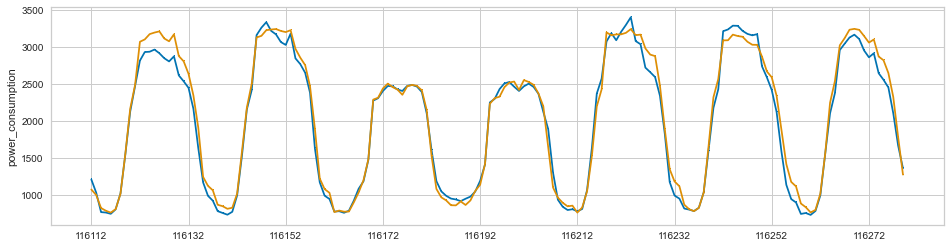

 57%|███████████████████████████████████████████▎                                | 57/100 [5:39:10<5:15:20, 440.00s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 116280 to 118319
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1762
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,11.0546,250.2581,15.6398,0.9627,0.0054,0.0038,2.0100
lightgbm,Light Gradient Boosting Machine,12.2826,309.0763,17.4187,0.9540,0.0060,0.0043,2.0050
xgboost,Extreme Gradient Boosting,12.5588,303.6773,17.2422,0.9547,0.0060,0.0044,1.9630
gbr,Gradient Boosting Regressor,13.0034,320.0151,17.7438,0.9525,0.0061,0.0045,1.9510
rf,Random Forest Regressor,13.0561,350.4561,18.5986,0.9476,0.0065,0.0045,2.0660
lasso,Lasso Regression,15.3394,541.9949,23.2291,0.9194,0.0081,0.0053,1.8970
llar,Lasso Least Angle Regression,15.3390,541.9088,23.2273,0.9194,0.0081,0.0053,1.9050
br,Bayesian Ridge,15.5930,529.3947,22.9703,0.9215,0.0080,0.0054,1.8930
huber,Huber Regressor,15.6562,599.9540,24.4290,0.9106,0.0085,0.0054,1.9000
en,Elastic Net,15.6057,575.5242,23.9292,0.9143,0.0083,0.0054,1.8950


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,11.2502,222.6360,14.9210,0.9707,0.0051,0.0039
1,11.4285,246.5876,15.7031,0.9650,0.0054,0.0039
2,11.1443,267.9534,16.3693,0.9573,0.0057,0.0039
3,11.3243,511.7388,22.6216,0.9213,0.0078,0.0040
4,11.4568,226.4715,15.0490,0.9722,0.0052,0.0040
5,10.8808,203.9563,14.2813,0.9664,0.0050,0.0038
6,11.1652,218.3008,14.7750,0.9681,0.0051,0.0039
7,11.5119,224.2581,14.9753,0.9674,0.0052,0.0040
8,11.0926,233.2222,15.2716,0.9655,0.0053,0.0039


Transformation Pipeline and Model Successfully Saved


[Building #58]SMAPE : 0.3855041233990424


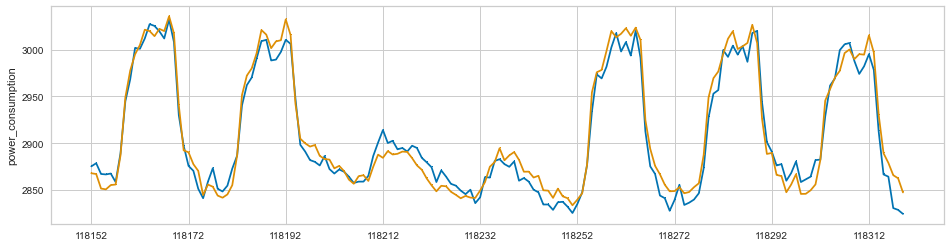

 58%|████████████████████████████████████████████                                | 58/100 [5:46:41<5:10:15, 443.23s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 118320 to 120359
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7143
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,71.1745,17575.6291,130.5023,0.9841,0.0875,0.0500,2.0030
xgboost,Extreme Gradient Boosting,78.4129,20059.5550,139.7021,0.9819,0.0896,0.0531,2.0270
rf,Random Forest Regressor,79.9911,21673.9126,145.0057,0.9804,0.0951,0.0558,2.0640
gbr,Gradient Boosting Regressor,86.3581,21578.4227,144.9790,0.9804,0.0915,0.0591,1.9630
lightgbm,Light Gradient Boosting Machine,90.6889,28086.3818,160.5603,0.9742,0.0999,0.0610,2.0120
dt,Decision Tree Regressor,104.2828,38157.7811,192.9759,0.9654,0.1200,0.0689,1.9030
knn,K Neighbors Regressor,145.5933,102206.7883,313.4049,0.9074,0.1791,0.1008,1.9270
omp,Orthogonal Matching Pursuit,145.7469,97340.5656,307.4395,0.9117,0.1770,0.1018,1.9030
huber,Huber Regressor,142.5185,96122.3775,304.7036,0.9128,0.1782,0.1032,1.9090
ada,AdaBoost Regressor,146.5664,41102.4971,201.5025,0.9624,0.1411,0.1132,1.9310


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,59.5668,10386.3542,101.9135,0.9902,0.0652,0.0423
1,82.0046,21265.4032,145.8266,0.9801,0.0866,0.0518
2,65.0436,13873.9076,117.7876,0.9879,0.0874,0.0487
3,77.6955,21429.7254,146.3890,0.9807,0.0827,0.0498
4,71.9447,13481.6416,116.1105,0.9886,0.0682,0.0435
5,83.4056,32851.9859,181.2512,0.9731,0.1313,0.0615
6,76.4393,17410.2615,131.9479,0.9837,0.0907,0.0522
7,67.9039,15120.8775,122.9670,0.9845,0.0868,0.0512
8,71.4444,16757.9934,129.4527,0.9845,0.0852,0.0510


Transformation Pipeline and Model Successfully Saved


[Building #59]SMAPE : 4.691066778299937


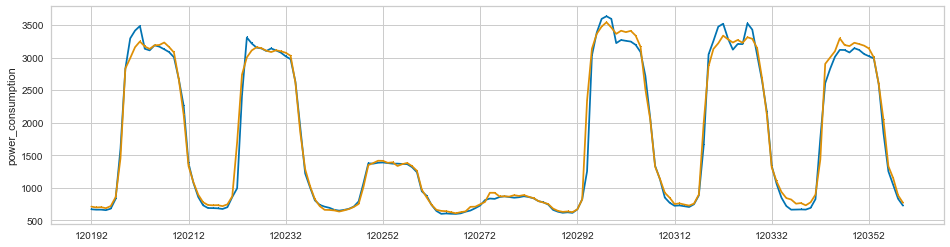

 59%|████████████████████████████████████████████▊                               | 59/100 [5:54:14<5:04:52, 446.15s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 120360 to 122399
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,6273
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,92.3672,21849.6290,145.6859,0.9832,0.0582,0.0356,2.0210
xgboost,Extreme Gradient Boosting,103.3522,24277.8679,154.5633,0.9813,0.0588,0.0386,2.1270
lightgbm,Light Gradient Boosting Machine,103.4470,25222.4306,157.3515,0.9804,0.0600,0.0388,2.0520
rf,Random Forest Regressor,103.8917,26804.6455,162.3262,0.9792,0.0624,0.0392,2.1130
gbr,Gradient Boosting Regressor,116.8199,28440.8131,167.6580,0.9780,0.0634,0.0433,2.0870
dt,Decision Tree Regressor,138.0638,51073.4021,224.2508,0.9604,0.0833,0.0511,1.9290
huber,Huber Regressor,163.1795,76787.8161,274.7146,0.9410,0.0970,0.0609,1.9280
omp,Orthogonal Matching Pursuit,177.1533,89544.2363,297.1860,0.9312,0.1023,0.0643,1.9350
knn,K Neighbors Regressor,178.0523,88674.4234,296.8494,0.9316,0.1042,0.0650,1.9370
en,Elastic Net,171.5631,69818.9945,262.2411,0.9463,0.0975,0.0662,1.9210


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,82.8825,18096.3354,134.5226,0.9870,0.0510,0.0315
1,102.2719,30826.0200,175.5734,0.9772,0.0741,0.0413
2,94.7809,19345.0545,139.0865,0.9846,0.0560,0.0368
3,82.8862,16143.5392,127.0572,0.9882,0.0486,0.0317
4,94.8686,20407.9091,142.8563,0.9827,0.0554,0.0353
5,86.7425,16903.5389,130.0136,0.9875,0.0459,0.0309
6,106.0788,32752.5540,180.9767,0.9745,0.0797,0.0438
7,77.4660,11491.3900,107.1979,0.9908,0.0382,0.0273
8,108.5788,25762.6038,160.5073,0.9810,0.0633,0.0421


Transformation Pipeline and Model Successfully Saved


[Building #60]SMAPE : 5.603587694067791


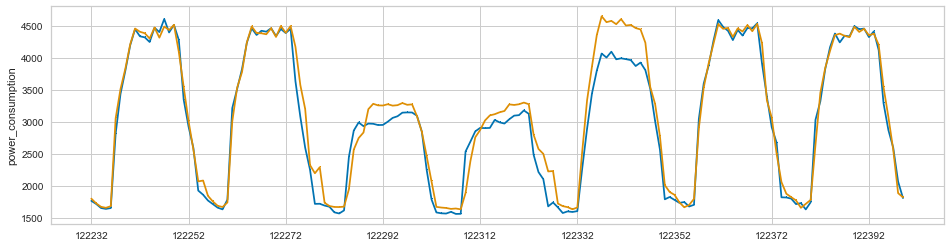

 60%|█████████████████████████████████████████████▌                              | 60/100 [6:01:55<5:00:28, 450.72s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 122400 to 124439
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1762
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,96.4223,17908.1468,133.3060,0.9795,0.0408,0.0306,2.0650
et,Extra Trees Regressor,99.3435,20553.7817,143.0621,0.9765,0.0433,0.0315,2.0320
xgboost,Extreme Gradient Boosting,98.6361,19191.9768,137.9550,0.9780,0.0427,0.0316,2.0110
gbr,Gradient Boosting Regressor,115.1128,23584.6639,153.3148,0.9730,0.0475,0.0369,1.9820
rf,Random Forest Regressor,124.7554,31239.5605,176.3998,0.9643,0.0530,0.0393,2.1360
dt,Decision Tree Regressor,177.7596,69665.7281,263.3660,0.9202,0.0785,0.0559,1.9400
br,Bayesian Ridge,212.6776,75715.5906,274.9159,0.9137,0.0904,0.0694,1.9330
ridge,Ridge Regression,212.2705,75609.4730,274.7254,0.9138,0.0909,0.0695,1.9280
llar,Lasso Least Angle Regression,212.5146,75643.1062,274.7890,0.9137,0.0906,0.0695,1.9280
lr,Linear Regression,212.3102,75623.4066,274.7513,0.9138,0.0910,0.0695,1.9240


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,98.4032,20695.3670,143.8588,0.9780,0.0440,0.0304
1,87.1825,15335.4761,123.8365,0.9844,0.0355,0.0277
2,94.4021,21178.6385,145.5288,0.9744,0.0440,0.0303
3,91.3359,15610.9342,124.9437,0.9804,0.0392,0.0297
4,83.0766,13461.9708,116.0257,0.9851,0.0371,0.0269
5,99.7805,19274.8548,138.8339,0.9783,0.0431,0.0312
6,87.1090,14603.8161,120.8462,0.9829,0.0350,0.0265
7,91.1769,15221.3745,123.3749,0.9834,0.0350,0.0277
8,91.6484,18035.6353,134.2968,0.9780,0.0447,0.0305


Transformation Pipeline and Model Successfully Saved


[Building #61]SMAPE : 3.8347364733968616


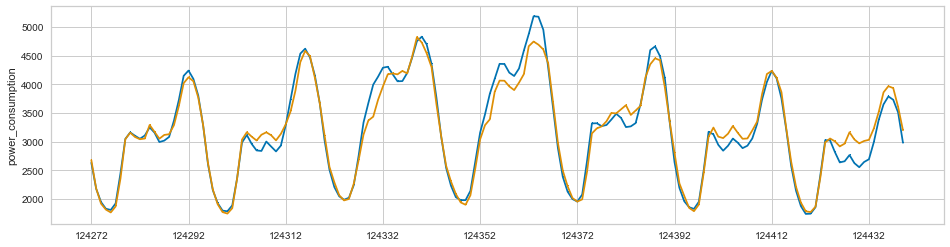

 61%|██████████████████████████████████████████████▎                             | 61/100 [6:09:36<4:55:00, 453.86s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 124440 to 126479
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7425
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,38.0326,2960.0491,53.9860,0.9783,0.0423,0.0322,2.1140
lightgbm,Light Gradient Boosting Machine,37.9458,2848.1804,52.8341,0.9790,0.0423,0.0325,2.1770
xgboost,Extreme Gradient Boosting,42.7399,3662.2556,60.1207,0.9731,0.0470,0.0361,2.1190
gbr,Gradient Boosting Regressor,45.8017,3833.5978,61.4609,0.9719,0.0504,0.0396,2.0910
rf,Random Forest Regressor,48.0438,4392.7889,65.9889,0.9677,0.0530,0.0411,2.1900
dt,Decision Tree Regressor,71.0261,10600.7495,102.5256,0.9217,0.0830,0.0611,1.9980
knn,K Neighbors Regressor,92.3340,15745.6348,125.2434,0.8841,0.0956,0.0753,2.0250
lr,Linear Regression,89.4051,12907.7840,113.2173,0.9049,0.1077,0.0810,2.0110
ridge,Ridge Regression,89.3986,12906.0884,113.2097,0.9049,0.1077,0.0810,2.0080
lasso,Lasso Regression,89.7135,12969.3031,113.4837,0.9044,0.1072,0.0813,2.0190


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,38.8376,2725.5793,52.2071,0.9795,0.0425,0.0330
1,35.0372,2762.0855,52.5555,0.9786,0.0370,0.0282
2,33.8371,2056.9170,45.3532,0.9820,0.0370,0.0292
3,30.4053,1654.7950,40.6792,0.9876,0.0320,0.0259
4,34.5851,2497.7964,49.9780,0.9840,0.0407,0.0288
5,36.7736,2765.3318,52.5864,0.9807,0.0382,0.0300
6,33.0310,1885.6616,43.4242,0.9867,0.0380,0.0299
7,44.9251,4464.0841,66.8138,0.9681,0.0502,0.0377
8,37.1547,2606.5774,51.0547,0.9806,0.0425,0.0318


Transformation Pipeline and Model Successfully Saved


[Building #62]SMAPE : 4.207257994477618


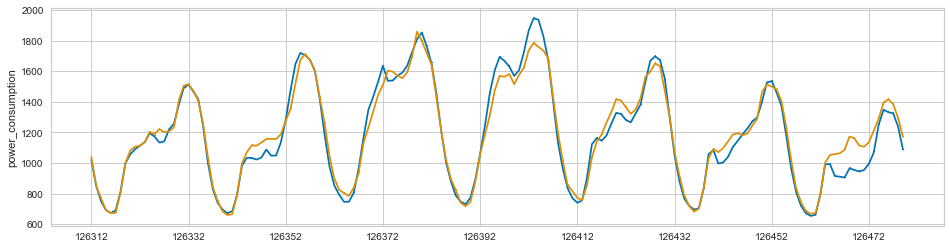

 62%|███████████████████████████████████████████████                             | 62/100 [6:17:35<4:52:12, 461.39s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 126480 to 128519
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,519
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,26.1777,1332.8167,36.3036,0.9793,0.0461,0.0345,2.1210
lightgbm,Light Gradient Boosting Machine,26.6326,1342.8980,36.5473,0.9792,0.0462,0.0352,2.1630
xgboost,Extreme Gradient Boosting,30.4063,1770.4334,41.9475,0.9724,0.0532,0.0402,2.1410
rf,Random Forest Regressor,33.6717,2133.9042,46.0681,0.9669,0.0580,0.0443,2.2030
gbr,Gradient Boosting Regressor,34.1667,2057.6074,45.0784,0.9681,0.0580,0.0457,2.1150
dt,Decision Tree Regressor,47.5440,4737.0610,68.3110,0.9260,0.0859,0.0628,2.0340
knn,K Neighbors Regressor,57.7183,6361.2354,79.5510,0.9004,0.0931,0.0725,2.0500
br,Bayesian Ridge,62.5166,6414.9490,79.9607,0.9003,0.1198,0.0870,2.0650
llar,Lasso Least Angle Regression,62.6127,6463.1662,80.2525,0.8996,0.1207,0.0871,2.0520
lasso,Lasso Regression,62.6139,6463.4412,80.2542,0.8996,0.1208,0.0871,2.0400


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,20.3634,774.7943,27.8351,0.9864,0.0362,0.0281
1,25.8530,1372.3744,37.0456,0.9775,0.0469,0.0331
2,23.8276,1095.8468,33.1036,0.9837,0.0431,0.0324
3,26.7040,1240.7982,35.2250,0.9830,0.0413,0.0335
4,27.3150,1511.2394,38.8747,0.9780,0.0509,0.0359
5,22.6646,1087.8666,32.9828,0.9865,0.0415,0.0297
6,21.8174,951.5102,30.8466,0.9825,0.0399,0.0291
7,26.7284,1222.3370,34.9619,0.9808,0.0466,0.0366
8,27.3415,1384.6601,37.2110,0.9782,0.0447,0.0347


Transformation Pipeline and Model Successfully Saved


[Building #63]SMAPE : 6.060605210763632


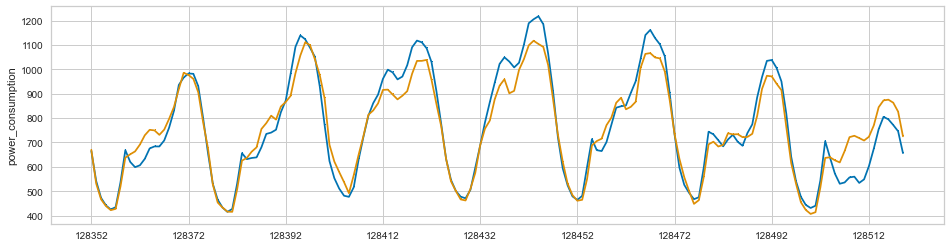

 63%|███████████████████████████████████████████████▉                            | 63/100 [6:25:41<4:49:00, 468.65s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 128520 to 130559
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,2262
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,31.7669,1963.2792,44.2117,0.9829,0.0338,0.0259,2.2460
et,Extra Trees Regressor,32.3524,2161.6130,46.4267,0.9811,0.0355,0.0264,2.2460
xgboost,Extreme Gradient Boosting,34.5018,2305.1059,47.8923,0.9800,0.0365,0.0281,2.2370
gbr,Gradient Boosting Regressor,39.3569,2870.7034,53.3952,0.9751,0.0417,0.0325,2.2130
rf,Random Forest Regressor,40.5458,3209.1863,56.5138,0.9720,0.0438,0.0332,2.3370
dt,Decision Tree Regressor,57.2236,7266.8578,84.9802,0.9364,0.0653,0.0468,2.1440
knn,K Neighbors Regressor,80.6318,13582.2037,116.2459,0.8820,0.0825,0.0621,2.1530
huber,Huber Regressor,80.7262,13370.1505,115.0400,0.8846,0.0893,0.0658,2.1330
ridge,Ridge Regression,80.4127,10636.6718,102.8727,0.9080,0.0870,0.0685,2.2240
br,Bayesian Ridge,80.5863,10663.8050,102.9971,0.9078,0.0864,0.0685,2.1690


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,29.1799,1988.1697,44.5889,0.9836,0.0311,0.0226
1,30.3201,1795.5581,42.3740,0.9859,0.0314,0.0244
2,30.1784,1764.9773,42.0116,0.9817,0.0348,0.0255
3,29.3446,1699.3139,41.2227,0.9811,0.0323,0.0248
4,32.2116,2096.6083,45.7887,0.9837,0.0349,0.0262
5,30.8475,2002.5602,44.7500,0.9828,0.0326,0.0244
6,30.1609,1777.3720,42.1589,0.9844,0.0340,0.0260
7,27.2470,1393.4797,37.3293,0.9890,0.0282,0.0214
8,28.7681,1637.8624,40.4705,0.9863,0.0305,0.0231


Transformation Pipeline and Model Successfully Saved


[Building #64]SMAPE : 4.07907928935866


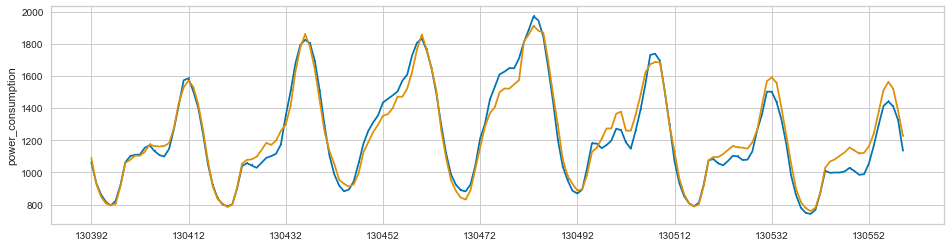

 64%|████████████████████████████████████████████████▋                           | 64/100 [6:34:16<4:49:38, 482.73s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 130560 to 132599
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,268
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,37.3992,3196.1802,56.1209,0.9429,0.0913,0.0644,2.2440
lightgbm,Light Gradient Boosting Machine,37.4103,3102.7080,55.2008,0.9451,0.0877,0.0644,2.2700
xgboost,Extreme Gradient Boosting,39.7031,3313.0465,57.2624,0.9410,0.0941,0.0690,2.2060
rf,Random Forest Regressor,42.2002,3757.2389,60.9496,0.9331,0.1003,0.0738,2.3180
gbr,Gradient Boosting Regressor,42.6273,3694.7551,60.4450,0.9340,0.0999,0.0750,2.2310
dt,Decision Tree Regressor,54.3555,6913.4496,82.2279,0.8766,0.1330,0.0948,2.1600
lasso,Lasso Regression,55.6313,5534.2916,74.2351,0.9009,0.1349,0.1030,2.1330
llar,Lasso Least Angle Regression,55.6314,5534.2417,74.2348,0.9009,0.1349,0.1030,2.1320
knn,K Neighbors Regressor,60.4640,7345.0055,85.5469,0.8682,0.1354,0.1036,2.1600
br,Bayesian Ridge,55.8042,5531.2768,74.2275,0.9009,0.1353,0.1036,2.1120


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,40.5165,3513.4140,59.2741,0.9431,0.0914,0.0655
1,34.1645,3074.8286,55.4511,0.9523,0.0815,0.0559
2,32.3857,2475.6072,49.7555,0.9504,0.0837,0.0592
3,46.4294,5020.2940,70.8540,0.9212,0.1028,0.0723
4,34.5379,2352.4281,48.5018,0.9562,0.0788,0.0609
5,33.9904,2680.6095,51.7746,0.9521,0.0742,0.0553
6,32.0835,2150.8755,46.3775,0.9596,0.0791,0.0586
7,35.8524,2985.2253,54.6372,0.9401,0.1036,0.0657
8,33.4479,2611.8322,51.1061,0.9485,0.0847,0.0610


Transformation Pipeline and Model Successfully Saved


[Building #65]SMAPE : 7.494995342482619


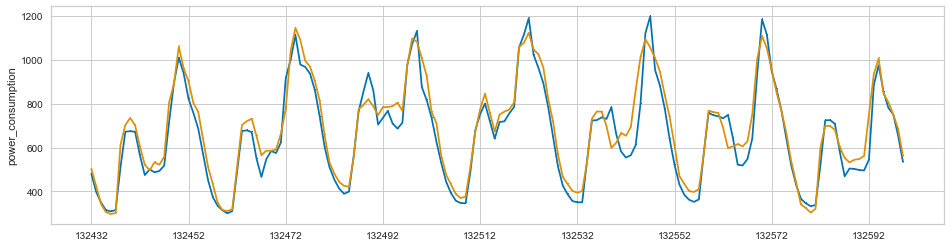

 65%|█████████████████████████████████████████████████▍                          | 65/100 [6:42:42<4:45:39, 489.69s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 132600 to 134639
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5969
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,10.0294,185.9323,13.6064,0.9700,0.0325,0.0248,2.2050
et,Extra Trees Regressor,10.9789,217.7078,14.7195,0.9650,0.0351,0.0270,2.2320
xgboost,Extreme Gradient Boosting,11.2041,223.0912,14.8957,0.9640,0.0357,0.0277,2.2340
gbr,Gradient Boosting Regressor,11.9869,244.5922,15.6201,0.9605,0.0380,0.0298,2.2080
rf,Random Forest Regressor,13.4781,333.0353,18.2108,0.9464,0.0438,0.0333,2.3190
knn,K Neighbors Regressor,16.5299,504.4755,22.4480,0.9188,0.0522,0.0401,2.1460
dt,Decision Tree Regressor,19.1826,748.1006,27.2851,0.8803,0.0652,0.0470,2.1500
ridge,Ridge Regression,18.9566,564.8481,23.7404,0.9090,0.0606,0.0485,2.1500
br,Bayesian Ridge,18.9457,565.0678,23.7452,0.9090,0.0606,0.0485,2.1240
lr,Linear Regression,18.9613,564.9809,23.7432,0.9090,0.0606,0.0485,2.1680


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,10.0714,188.2339,13.7198,0.9715,0.0324,0.0247
1,11.1879,237.9582,15.4259,0.9620,0.0371,0.0279
2,10.5028,191.2009,13.8275,0.9716,0.0330,0.0258
3,8.9157,151.9377,12.3263,0.9751,0.0319,0.0230
4,9.4344,156.5567,12.5123,0.9779,0.0283,0.0226
5,10.0294,186.6494,13.6620,0.9670,0.0314,0.0240
6,9.7607,177.3701,13.3180,0.9707,0.0316,0.0241
7,9.8286,165.5727,12.8675,0.9749,0.0296,0.0236
8,10.4465,196.0196,14.0007,0.9637,0.0338,0.0259


Transformation Pipeline and Model Successfully Saved


[Building #66]SMAPE : 4.006650297189841


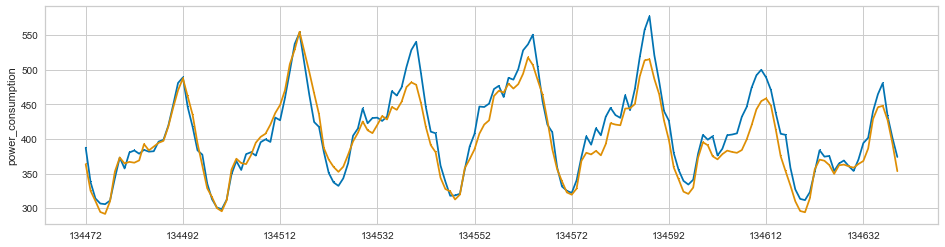

 66%|██████████████████████████████████████████████████▏                         | 66/100 [6:51:10<4:40:30, 495.03s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 134640 to 136679
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1375
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,37.4064,2640.4712,51.2233,0.9798,0.0366,0.0283,2.2480
et,Extra Trees Regressor,39.2684,3091.3276,55.3901,0.9764,0.0389,0.0294,2.3000
xgboost,Extreme Gradient Boosting,39.3751,2850.7598,53.2405,0.9782,0.0386,0.0300,2.2120
gbr,Gradient Boosting Regressor,44.2657,3530.2397,59.3664,0.9731,0.0434,0.0340,2.2130
rf,Random Forest Regressor,45.8299,3968.8156,62.8361,0.9698,0.0451,0.0347,2.3400
dt,Decision Tree Regressor,66.8682,9237.8922,95.7819,0.9298,0.0682,0.0503,2.1710
lr,Linear Regression,65.2989,7397.3452,85.6421,0.9441,0.0651,0.0505,2.1870
ridge,Ridge Regression,65.2988,7395.3987,85.6304,0.9441,0.0651,0.0505,2.1790
llar,Lasso Least Angle Regression,65.7047,7437.4276,85.8637,0.9438,0.0652,0.0508,2.1310
br,Bayesian Ridge,65.6996,7422.6835,85.7839,0.9439,0.0652,0.0508,2.1620


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,41.8667,3510.5113,59.2496,0.9717,0.0422,0.0320
1,36.5584,2440.6841,49.4033,0.9834,0.0333,0.0272
2,34.6759,2448.9293,49.4867,0.9803,0.0361,0.0267
3,36.0997,2545.0997,50.4490,0.9815,0.0339,0.0260
4,36.9137,2744.1079,52.3842,0.9786,0.0361,0.0274
5,37.1002,2450.9567,49.5071,0.9812,0.0369,0.0287
6,36.0735,2524.1753,50.2412,0.9826,0.0364,0.0274
7,31.3008,1815.7794,42.6120,0.9868,0.0302,0.0235
8,32.9566,2103.8380,45.8676,0.9804,0.0344,0.0257


Transformation Pipeline and Model Successfully Saved


[Building #67]SMAPE : 12.208429288317113


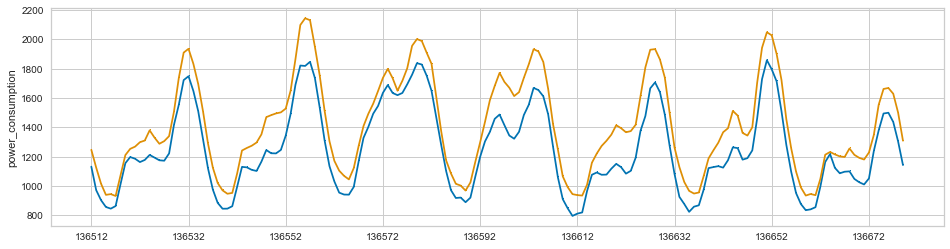

 67%|██████████████████████████████████████████████████▉                         | 67/100 [6:59:41<4:34:53, 499.79s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 136680 to 138719
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,8832
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,57.2549,6405.8063,79.9482,0.9814,0.0364,0.0274,2.2870
et,Extra Trees Regressor,60.2080,7674.5447,87.1266,0.9777,0.0388,0.0286,2.2370
xgboost,Extreme Gradient Boosting,62.9274,7661.1766,87.2392,0.9778,0.0394,0.0302,2.2720
gbr,Gradient Boosting Regressor,69.8704,8873.2762,94.0113,0.9742,0.0439,0.0340,2.1860
rf,Random Forest Regressor,74.7620,10700.2372,103.1917,0.9688,0.0464,0.0357,2.3020
dt,Decision Tree Regressor,103.9664,22810.2276,150.5415,0.9343,0.0698,0.0500,2.1340
huber,Huber Regressor,137.7331,35109.0379,186.8279,0.8993,0.0876,0.0664,2.1460
llar,Lasso Least Angle Regression,135.9719,30871.4244,175.3968,0.9110,0.0861,0.0674,2.1460
br,Bayesian Ridge,136.0697,30908.2260,175.5037,0.9110,0.0859,0.0675,2.1650
lasso,Lasso Regression,136.0420,30887.9650,175.4445,0.9110,0.0861,0.0675,2.1160


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,52.4156,6110.3839,78.1689,0.9798,0.0388,0.0267
1,59.6068,7745.9292,88.0110,0.9739,0.0422,0.0288
2,56.2658,6109.2037,78.1614,0.9821,0.0335,0.0259
3,60.3613,6963.8873,83.4499,0.9833,0.0333,0.0265
4,58.7829,7588.4074,87.1115,0.9792,0.0362,0.0270
5,55.1895,6320.5200,79.5017,0.9808,0.0371,0.0271
6,56.9665,5496.0794,74.1355,0.9843,0.0324,0.0263
7,47.8751,4503.9853,67.1117,0.9861,0.0340,0.0244
8,51.2714,5241.3497,72.3972,0.9870,0.0317,0.0243


Transformation Pipeline and Model Successfully Saved


[Building #68]SMAPE : 4.217722795463101


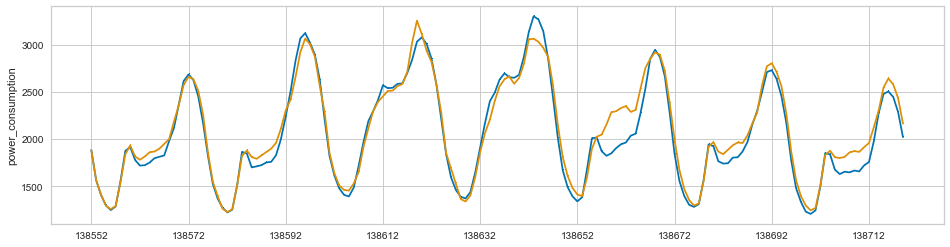

 68%|███████████████████████████████████████████████████▋                        | 68/100 [7:08:11<4:28:14, 502.94s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 138720 to 140759
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5519
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,85.0067,28976.1483,163.7690,0.9776,0.0379,0.0193,2.2960
xgboost,Extreme Gradient Boosting,95.5451,29915.4477,168.9661,0.9769,0.0383,0.0213,2.3000
rf,Random Forest Regressor,102.8880,39552.1662,190.9742,0.9695,0.0430,0.0233,2.3960
lightgbm,Light Gradient Boosting Machine,105.0301,35664.9738,185.4843,0.9727,0.0416,0.0235,2.3310
gbr,Gradient Boosting Regressor,107.9422,33740.7383,179.4374,0.9740,0.0404,0.0241,2.2530
dt,Decision Tree Regressor,144.6128,86274.2322,281.7670,0.9330,0.0630,0.0325,2.1940
huber,Huber Regressor,168.1621,102093.3575,314.1245,0.9208,0.0677,0.0381,2.2350
en,Elastic Net,171.6629,92745.9281,299.3287,0.9281,0.0654,0.0392,2.1630
br,Bayesian Ridge,175.9572,84973.5926,288.2581,0.9343,0.0640,0.0402,2.1470
lasso,Lasso Regression,177.1371,84802.7133,288.0644,0.9344,0.0641,0.0406,2.1850


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,73.1160,16060.5266,126.7301,0.9885,0.0277,0.0156
1,82.8449,22807.0426,151.0200,0.9816,0.0345,0.0188
2,85.6151,20212.2843,142.1699,0.9827,0.0306,0.0189
3,104.5866,46156.2279,214.8400,0.9615,0.0490,0.0241
4,66.2863,12868.5503,113.4396,0.9902,0.0250,0.0151
5,86.8576,19162.8511,138.4300,0.9868,0.0293,0.0181
6,67.5057,13670.7734,116.9221,0.9898,0.0254,0.0147
7,102.3815,35038.1800,187.1849,0.9752,0.0433,0.0227
8,78.6263,15256.2833,123.5163,0.9879,0.0281,0.0174


Transformation Pipeline and Model Successfully Saved


[Building #69]SMAPE : 2.923700115118895


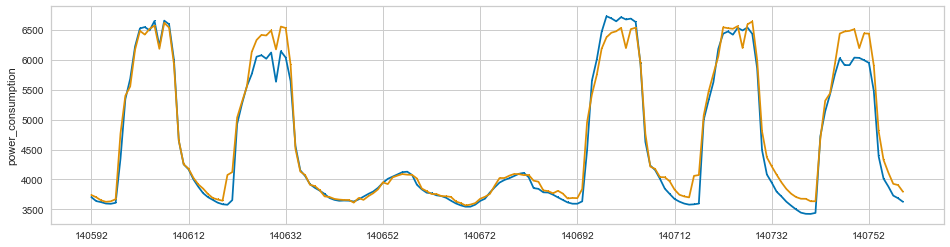

 69%|████████████████████████████████████████████████████▍                       | 69/100 [7:16:52<4:22:38, 508.35s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 140760 to 142799
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,3757
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,94.5203,29873.8653,169.3147,0.9864,0.0425,0.0241,2.3260
xgboost,Extreme Gradient Boosting,110.0161,39632.3934,195.9232,0.9821,0.0459,0.0269,2.2810
rf,Random Forest Regressor,113.6589,43767.3868,203.7855,0.9800,0.0493,0.0286,2.4250
lightgbm,Light Gradient Boosting Machine,127.1876,46974.7781,212.8989,0.9787,0.0582,0.0339,2.3270
gbr,Gradient Boosting Regressor,156.6372,59493.9350,241.2992,0.9731,0.0577,0.0386,2.2720
dt,Decision Tree Regressor,157.4143,105385.2879,316.2319,0.9527,0.0735,0.0389,2.2400
huber,Huber Regressor,325.8516,325176.7873,565.0948,0.8540,0.1732,0.1037,2.2330
en,Elastic Net,349.6647,290550.3172,535.8126,0.8696,0.1645,0.1056,2.2500
br,Bayesian Ridge,353.3460,299766.6812,543.8854,0.8655,0.1654,0.1063,2.2310
omp,Orthogonal Matching Pursuit,363.2931,311848.6656,554.5142,0.8600,0.1624,0.1067,2.2420


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,102.4156,40552.8409,201.3774,0.9814,0.0420,0.0235
1,80.8950,17406.6537,131.9343,0.9929,0.0285,0.0190
2,90.5869,34109.9321,184.6887,0.9859,0.0477,0.0233
3,90.9494,25410.1055,159.4055,0.9903,0.0482,0.0263
4,108.4648,35738.4239,189.0461,0.9821,0.0505,0.0288
5,63.4733,11379.7143,106.6757,0.9945,0.0237,0.0153
6,82.5636,21785.0088,147.5975,0.9901,0.0325,0.0200
7,118.2155,40907.1238,202.2551,0.9820,0.0493,0.0302
8,104.2952,32753.7814,180.9801,0.9841,0.0399,0.0238


Transformation Pipeline and Model Successfully Saved


[Building #70]SMAPE : 2.46002848992363


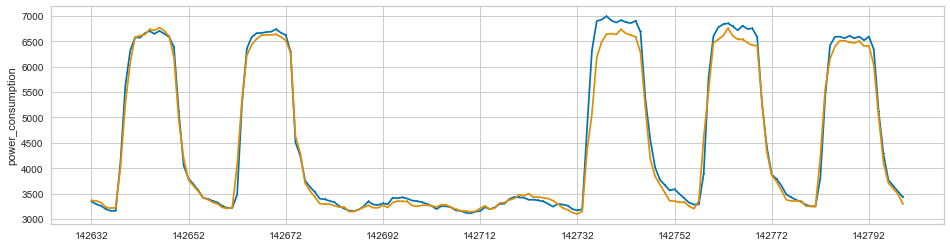

 70%|█████████████████████████████████████████████████████▏                      | 70/100 [7:25:38<4:16:49, 513.66s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 142800 to 144839
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,8830
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,67.9712,14981.4089,121.2245,0.9341,0.0483,0.0297,2.3250
xgboost,Extreme Gradient Boosting,79.8462,15985.9964,125.5517,0.9295,0.0536,0.0360,2.2900
rf,Random Forest Regressor,81.6729,18250.2436,134.1719,0.9194,0.0575,0.0371,2.4050
lightgbm,Light Gradient Boosting Machine,81.4126,18211.3632,133.2758,0.9204,0.0576,0.0373,2.3200
gbr,Gradient Boosting Regressor,84.7927,17117.8088,130.3744,0.9240,0.0554,0.0385,2.2910
dt,Decision Tree Regressor,110.5722,36935.6739,189.8894,0.8374,0.0812,0.0495,2.2420
en,Elastic Net,115.8166,31880.8672,177.3956,0.8587,0.0794,0.0546,2.3160
br,Bayesian Ridge,117.6240,29394.7488,170.5702,0.8696,0.0760,0.0549,2.2270
llar,Lasso Least Angle Regression,118.1582,29425.2977,170.7309,0.8694,0.0761,0.0552,2.2890
lasso,Lasso Regression,118.1602,29424.8734,170.7299,0.8694,0.0761,0.0552,2.2620


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,59.5877,9137.3854,95.5897,0.9529,0.0411,0.0278
1,65.0007,13274.6979,115.2159,0.9426,0.0458,0.0288
2,80.9123,20237.5159,142.2586,0.9154,0.0580,0.0346
3,75.0433,16271.3915,127.5594,0.9351,0.0511,0.0329
4,64.1523,10224.3829,101.1157,0.9510,0.0460,0.0304
5,63.9403,11430.8045,106.9149,0.9427,0.0431,0.0283
6,63.1805,10458.7051,102.2678,0.9477,0.0421,0.0285
7,80.2596,17526.4768,132.3876,0.9351,0.0514,0.0336
8,68.0671,12505.3661,111.8274,0.9389,0.0470,0.0309


Transformation Pipeline and Model Successfully Saved


[Building #71]SMAPE : 3.3316980771192792


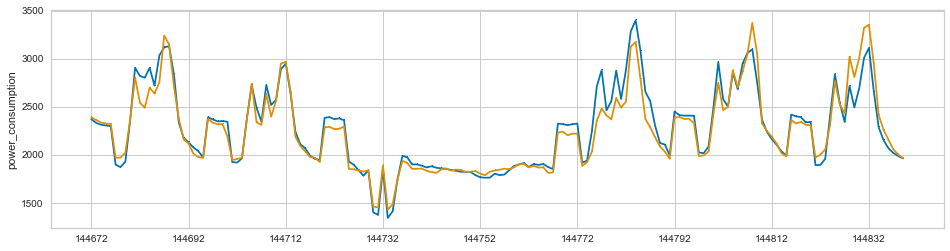

 71%|█████████████████████████████████████████████████████▉                      | 71/100 [7:34:28<4:10:41, 518.69s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 144840 to 146879
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,2627
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,20.9306,1043.3119,32.1896,0.9728,0.0246,0.0162,2.3500
xgboost,Extreme Gradient Boosting,24.0593,1203.6342,34.4787,0.9687,0.0264,0.0186,2.3600
rf,Random Forest Regressor,25.0565,1421.5847,37.5526,0.9628,0.0286,0.0194,2.4450
lightgbm,Light Gradient Boosting Machine,25.7872,1458.5627,37.9588,0.9621,0.0288,0.0199,2.5520
gbr,Gradient Boosting Regressor,28.9193,1603.1161,39.8770,0.9582,0.0308,0.0225,2.3010
dt,Decision Tree Regressor,33.5557,2892.6946,53.4708,0.9240,0.0405,0.0258,2.2510
knn,K Neighbors Regressor,37.7989,3304.2167,56.8950,0.9137,0.0436,0.0296,2.2970
lasso,Lasso Regression,41.3502,3307.1287,57.3472,0.9135,0.0451,0.0329,2.2550
llar,Lasso Least Angle Regression,41.3509,3307.2927,57.3486,0.9135,0.0451,0.0329,2.2480
br,Bayesian Ridge,41.4774,3267.8444,57.0115,0.9145,0.0450,0.0331,2.2640


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,22.2502,1066.9775,32.6646,0.9707,0.0242,0.0169
1,21.2018,791.1581,28.1275,0.9740,0.0217,0.0166
2,23.4959,1367.5328,36.9802,0.9658,0.0273,0.0178
3,23.0709,1164.7762,34.1288,0.9685,0.0263,0.0179
4,21.9127,981.2874,31.3255,0.9793,0.0221,0.0162
5,19.5897,885.7722,29.7619,0.9796,0.0220,0.0148
6,18.9513,761.8893,27.6023,0.9789,0.0223,0.0152
7,18.7331,700.7886,26.4724,0.9823,0.0209,0.0150
8,19.0885,742.4891,27.2487,0.9789,0.0218,0.0150


Transformation Pipeline and Model Successfully Saved


[Building #72]SMAPE : 6.917821261279514


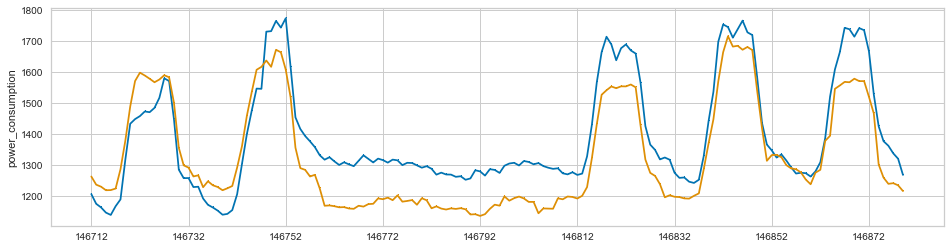

 72%|██████████████████████████████████████████████████████▋                     | 72/100 [7:43:25<4:04:32, 524.03s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 146880 to 148919
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1352
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,65.3934,8208.6687,90.2121,0.9668,0.0248,0.0181,2.3580
lightgbm,Light Gradient Boosting Machine,74.2251,9397.2328,96.5887,0.9619,0.0270,0.0207,2.3080
rf,Random Forest Regressor,76.5422,10535.1240,102.0887,0.9574,0.0282,0.0212,2.4430
xgboost,Extreme Gradient Boosting,82.7308,11728.6194,108.0305,0.9526,0.0302,0.0230,2.3650
gbr,Gradient Boosting Regressor,91.8913,13767.3584,117.1133,0.9443,0.0323,0.0255,2.3100
dt,Decision Tree Regressor,107.4093,25318.6866,158.5671,0.8981,0.0434,0.0297,2.2830
lasso,Lasso Regression,116.8516,22049.6369,148.0769,0.9111,0.0414,0.0327,2.3000
llar,Lasso Least Angle Regression,116.8508,22049.7645,148.0772,0.9111,0.0414,0.0327,2.3100
br,Bayesian Ridge,116.5909,22068.5867,148.1347,0.9111,0.0414,0.0327,2.3020
lr,Linear Regression,117.0794,22057.2520,148.1162,0.9111,0.0414,0.0328,2.3120


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,71.4172,8844.3072,94.0442,0.9566,0.0256,0.0197
1,64.3535,7698.8709,87.7432,0.9703,0.0250,0.0182
2,57.1647,5981.0742,77.3374,0.9777,0.0213,0.0157
3,66.1476,7497.8786,86.5903,0.9666,0.0241,0.0184
4,66.1134,7483.3544,86.5064,0.9723,0.0252,0.0186
5,79.7444,11201.0331,105.8349,0.9590,0.0295,0.0225
6,71.1403,8847.8535,94.0630,0.9639,0.0255,0.0194
7,64.5906,7638.7010,87.3997,0.9695,0.0244,0.0180
8,70.2661,8629.0766,92.8928,0.9667,0.0252,0.0193


Transformation Pipeline and Model Successfully Saved


[Building #73]SMAPE : 3.8088903004053307


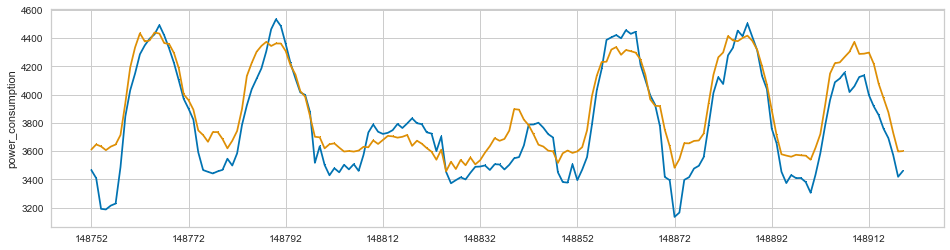

 73%|███████████████████████████████████████████████████████▍                    | 73/100 [7:52:22<3:57:38, 528.10s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 148920 to 150959
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,4612
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,122.5448,45939.3420,212.0453,0.9821,0.0586,0.0330,2.3970
rf,Random Forest Regressor,145.2704,76694.5404,259.4028,0.9702,0.0710,0.0401,2.4660
xgboost,Extreme Gradient Boosting,152.7263,67630.4785,254.3421,0.9736,0.0694,0.0408,2.3930
lightgbm,Light Gradient Boosting Machine,159.3182,72305.3976,266.6218,0.9717,0.0723,0.0431,2.4480
gbr,Gradient Boosting Regressor,162.1964,65134.0590,252.8846,0.9746,0.0696,0.0441,2.2910
dt,Decision Tree Regressor,192.3461,141145.5085,351.8689,0.9450,0.0912,0.0511,2.2930
huber,Huber Regressor,240.1543,242333.1684,486.5814,0.9053,0.1258,0.0689,2.2880
omp,Orthogonal Matching Pursuit,263.5523,261545.0812,507.4308,0.8980,0.1288,0.0724,2.3050
ada,AdaBoost Regressor,257.0021,112621.5989,333.7462,0.9561,0.0931,0.0727,2.3890
en,Elastic Net,260.3606,211569.3672,455.8574,0.9173,0.1228,0.0760,2.3020


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,125.9897,42473.8434,206.0918,0.9842,0.0519,0.0317
1,150.0408,72116.7092,268.5455,0.9728,0.0818,0.0441
2,120.0295,56881.8211,238.4991,0.9765,0.0652,0.0333
3,121.2375,40766.6253,201.9075,0.9841,0.0631,0.0367
4,117.0135,31531.4477,177.5710,0.9877,0.0471,0.0303
5,146.4342,54934.9029,234.3820,0.9793,0.0664,0.0391
6,121.4604,33920.2920,184.1746,0.9874,0.0463,0.0305
7,112.0602,28283.7303,168.1777,0.9872,0.0514,0.0326
8,158.0635,128584.8696,358.5873,0.9505,0.0970,0.0443


Transformation Pipeline and Model Successfully Saved


[Building #74]SMAPE : 5.041529226115409


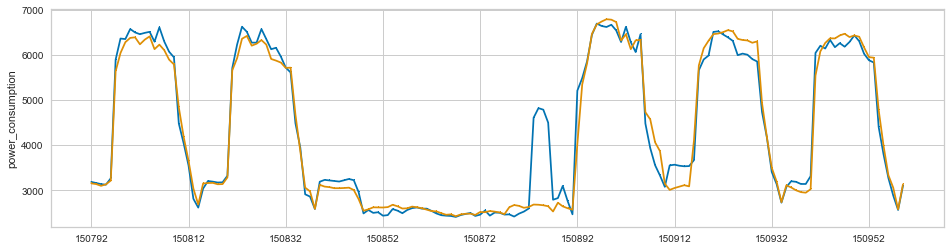

 74%|████████████████████████████████████████████████████████▏                   | 74/100 [8:01:27<3:50:58, 533.02s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 150960 to 152999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5587
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,73.3296,16797.7867,128.0418,0.8502,0.1277,0.0671,2.3640
et,Extra Trees Regressor,71.3157,16612.5048,125.9285,0.8534,0.1272,0.0674,2.3770
lightgbm,Light Gradient Boosting Machine,73.6223,15663.8607,122.6073,0.8619,0.1223,0.0679,2.3790
gbr,Gradient Boosting Regressor,87.1639,20871.3552,141.9792,0.8157,0.1403,0.0807,2.3470
rf,Random Forest Regressor,87.0803,26465.4464,160.2754,0.7676,0.1578,0.0847,2.5030
omp,Orthogonal Matching Pursuit,98.0404,31186.9133,173.9609,0.7262,0.1678,0.0950,2.3110
br,Bayesian Ridge,98.8997,31606.1354,175.3336,0.7221,0.1688,0.0957,2.3090
en,Elastic Net,100.2282,30788.9639,173.1165,0.7292,0.1668,0.0961,2.3270
llar,Lasso Least Angle Regression,101.2954,30636.6049,172.7206,0.7305,0.1662,0.0967,2.3230
lasso,Lasso Regression,101.5972,30725.1564,173.0272,0.7295,0.1664,0.0969,2.3370


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,65.4486,14079.8354,118.6585,0.8744,0.1395,0.0687
1,71.2147,16313.1162,127.7228,0.8379,0.1011,0.0517
2,66.6124,12892.0381,113.5431,0.8784,0.1066,0.0554
3,71.7895,14894.5063,122.0431,0.8813,0.1422,0.0735
4,58.4947,9194.5856,95.8884,0.8984,0.0641,0.0394
5,66.9299,12169.1052,110.3137,0.8970,0.0863,0.0474
6,83.3370,23717.7196,154.0056,0.8293,0.1867,0.0997
7,89.8345,28796.9069,169.6965,0.7709,0.1957,0.1029
8,61.8570,14108.5689,118.7795,0.8470,0.1274,0.0632


Transformation Pipeline and Model Successfully Saved


[Building #75]SMAPE : 4.970207819657064


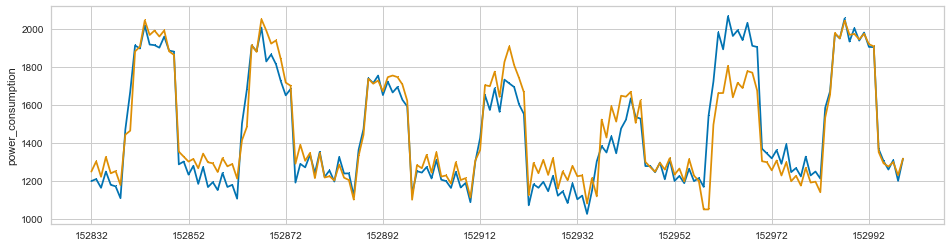

 75%|█████████████████████████████████████████████████████████                   | 75/100 [8:10:31<3:43:25, 536.24s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 153000 to 155039
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,8637
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,36.6736,2315.0507,47.9233,0.9596,0.0404,0.0312,2.4740
lightgbm,Light Gradient Boosting Machine,37.3238,2877.0522,53.0172,0.9498,0.0448,0.0318,2.4770
xgboost,Extreme Gradient Boosting,37.4741,2571.1574,50.4596,0.9552,0.0432,0.0320,2.3870
rf,Random Forest Regressor,38.9705,3024.2616,54.3458,0.9473,0.0466,0.0334,2.5070
gbr,Gradient Boosting Regressor,39.6877,2793.4438,52.5330,0.9511,0.0445,0.0337,2.3680
dt,Decision Tree Regressor,52.1155,5803.5414,75.4239,0.8984,0.0646,0.0440,2.3270
ada,AdaBoost Regressor,54.6289,4775.5650,68.7959,0.9167,0.0601,0.0474,2.3470
knn,K Neighbors Regressor,54.8650,6841.8380,81.8376,0.8813,0.0710,0.0480,2.3720
huber,Huber Regressor,54.3175,6364.5904,79.0207,0.8894,0.0698,0.0481,2.4520
en,Elastic Net,54.6441,6137.8580,77.7484,0.8932,0.0688,0.0481,2.3140


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39.3153,2503.4379,50.0344,0.9577,0.0409,0.0329
1,38.5525,3062.9506,55.3439,0.9480,0.0452,0.0325
2,33.5801,1795.8415,42.3774,0.9723,0.0372,0.0286
3,37.0715,2460.6273,49.6047,0.9490,0.0427,0.0320
4,31.1845,1702.4432,41.2607,0.9674,0.0346,0.0264
5,35.4350,2274.4321,47.6910,0.9649,0.0383,0.0295
6,33.4340,1949.3642,44.1516,0.9611,0.0366,0.0282
7,32.1215,1897.5694,43.5611,0.9683,0.0355,0.0269
8,35.5292,2444.3270,49.4401,0.9586,0.0468,0.0319


Transformation Pipeline and Model Successfully Saved


[Building #76]SMAPE : 3.7073722076562863


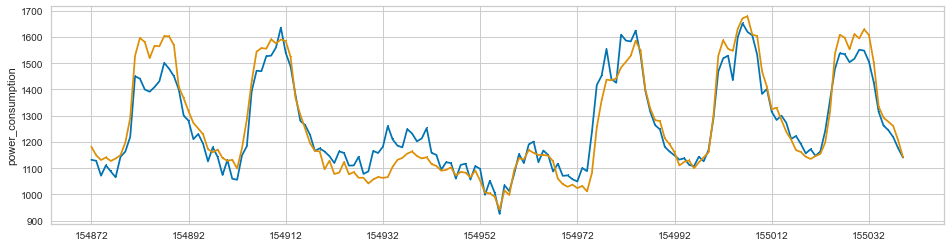

 76%|█████████████████████████████████████████████████████████▊                  | 76/100 [8:19:43<3:36:26, 541.11s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 155040 to 157079
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,6044
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,34.6350,2889.5511,53.0438,0.9889,0.0381,0.0252,2.4060
xgboost,Extreme Gradient Boosting,36.8751,3684.9001,59.1799,0.9858,0.0407,0.0261,2.3990
rf,Random Forest Regressor,38.8953,3947.6109,61.7897,0.9848,0.0429,0.0279,2.4840
lightgbm,Light Gradient Boosting Machine,40.8745,4572.0250,65.5539,0.9825,0.0433,0.0285,2.4640
gbr,Gradient Boosting Regressor,41.6952,4134.0576,63.6014,0.9841,0.0422,0.0291,2.3850
dt,Decision Tree Regressor,50.1950,7096.7303,82.8813,0.9725,0.0570,0.0357,2.3250
knn,K Neighbors Regressor,62.6914,15644.7425,121.6769,0.9402,0.0785,0.0441,2.3400
huber,Huber Regressor,62.5026,17822.0456,129.0622,0.9322,0.0828,0.0451,2.3240
ada,AdaBoost Regressor,69.8300,8999.5750,94.4601,0.9656,0.0607,0.0472,2.3580
en,Elastic Net,66.7334,15971.5167,123.1168,0.9392,0.0803,0.0476,2.3420


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,36.2544,4367.0585,66.0837,0.9824,0.0428,0.0248
1,28.3020,2216.6870,47.0817,0.9914,0.0311,0.0204
2,33.1294,2184.5061,46.7387,0.9914,0.0318,0.0233
3,35.7412,2327.7240,48.2465,0.9915,0.0342,0.0252
4,33.1278,2188.3009,46.7793,0.9923,0.0338,0.0235
5,36.9374,5811.9865,76.2364,0.9771,0.0562,0.0288
6,32.5978,2187.8907,46.7749,0.9915,0.0343,0.0244
7,34.4358,3134.0325,55.9824,0.9871,0.0409,0.0247
8,35.9427,2458.2462,49.5807,0.9913,0.0343,0.0248


Transformation Pipeline and Model Successfully Saved


[Building #77]SMAPE : 2.4687315304063224


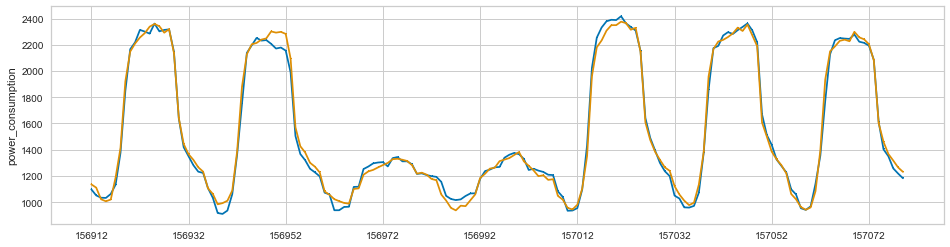

 77%|██████████████████████████████████████████████████████████▌                 | 77/100 [8:28:53<3:28:27, 543.79s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 157080 to 159119
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,4833
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,39.4670,4883.4340,67.8562,0.9933,0.0427,0.0251,2.4300
xgboost,Extreme Gradient Boosting,43.1811,6063.1596,75.0992,0.9918,0.0442,0.0265,2.4690
gbr,Gradient Boosting Regressor,48.6339,6534.4802,79.8235,0.9912,0.0445,0.0293,2.3910
lightgbm,Light Gradient Boosting Machine,49.1990,9570.3194,94.8008,0.9871,0.0531,0.0300,2.4760
rf,Random Forest Regressor,50.1381,8127.4662,87.9727,0.9889,0.0530,0.0314,2.5190
dt,Decision Tree Regressor,61.9085,13267.3877,111.8277,0.9818,0.0636,0.0382,2.3560
knn,K Neighbors Regressor,97.8571,41994.9647,200.8885,0.9437,0.1110,0.0608,2.3840
huber,Huber Regressor,98.1731,46544.1850,211.3215,0.9371,0.1160,0.0637,2.3490
omp,Orthogonal Matching Pursuit,112.1193,51451.8254,223.9961,0.9303,0.1213,0.0696,2.3650
en,Elastic Net,103.2107,40342.3016,196.8071,0.9455,0.1170,0.0707,2.3590


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46.7461,9227.2839,96.0588,0.9886,0.0629,0.0284
1,34.4052,2900.8535,53.8596,0.9965,0.0306,0.0203
2,40.4555,4447.2734,66.6879,0.9944,0.0334,0.0219
3,37.1840,3323.6394,57.6510,0.9950,0.0388,0.0242
4,38.8055,4096.7367,64.0058,0.9944,0.0395,0.0244
5,27.3270,1514.5824,38.9176,0.9975,0.0264,0.0194
6,41.3878,7679.2975,87.6316,0.9884,0.0613,0.0289
7,35.2074,2937.6751,54.2003,0.9964,0.0269,0.0195
8,39.1196,3643.0232,60.3575,0.9948,0.0372,0.0246


Transformation Pipeline and Model Successfully Saved


[Building #78]SMAPE : 3.3353052747485274


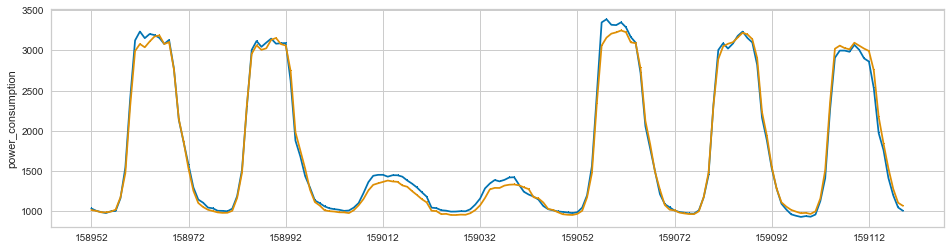

 78%|███████████████████████████████████████████████████████████▎                | 78/100 [8:38:09<3:20:40, 547.30s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 159120 to 161159
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7600
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,58.8641,9488.4739,95.7081,0.9869,0.0390,0.0228,2.4780
xgboost,Extreme Gradient Boosting,63.5521,9787.7401,97.5596,0.9865,0.0378,0.0240,2.4430
lightgbm,Light Gradient Boosting Machine,70.6533,13400.7899,113.3622,0.9817,0.0418,0.0263,2.5120
gbr,Gradient Boosting Regressor,71.2949,9847.1495,98.3765,0.9864,0.0382,0.0269,2.4250
rf,Random Forest Regressor,72.4957,14295.7138,117.1687,0.9802,0.0451,0.0275,2.5500
dt,Decision Tree Regressor,93.3213,26243.0310,159.7707,0.9637,0.0589,0.0346,2.3670
en,Elastic Net,126.1154,51578.2502,223.2225,0.9301,0.0779,0.0474,2.3880
ada,AdaBoost Regressor,127.7703,27545.7601,165.7767,0.9622,0.0635,0.0480,2.4000
huber,Huber Regressor,126.0552,59374.9714,238.1047,0.9196,0.0826,0.0482,2.3680
br,Bayesian Ridge,129.2854,43431.4607,205.8755,0.9410,0.0753,0.0492,2.3780


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,55.2195,10985.0377,104.8095,0.9843,0.0413,0.0206
1,55.7672,6968.1473,83.4754,0.9919,0.0322,0.0207
2,49.2471,4278.1570,65.4076,0.9941,0.0248,0.0184
3,58.8161,9356.0533,96.7267,0.9864,0.0411,0.0235
4,57.7413,9340.0901,96.6441,0.9850,0.0401,0.0230
5,57.0029,6815.0892,82.5536,0.9914,0.0323,0.0208
6,53.6030,5886.8421,76.7258,0.9917,0.0291,0.0196
7,66.6268,15114.9427,122.9428,0.9792,0.0540,0.0288
8,47.4172,4655.8333,68.2337,0.9939,0.0270,0.0179


Transformation Pipeline and Model Successfully Saved


[Building #79]SMAPE : 2.228910396001758


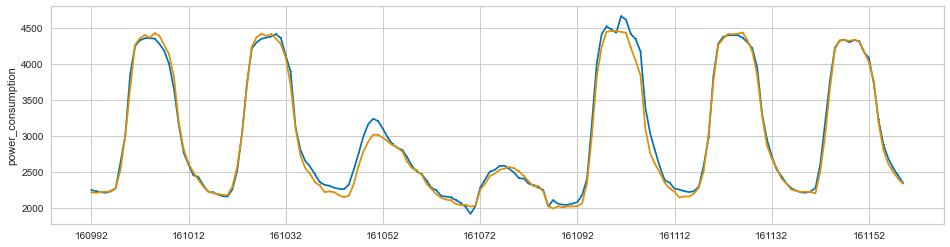

 79%|████████████████████████████████████████████████████████████                | 79/100 [8:47:34<3:13:24, 552.58s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 161160 to 163199
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,687
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,81.4178,20115.8558,139.2504,0.9932,0.0550,0.0339,2.4920
xgboost,Extreme Gradient Boosting,85.5292,28865.4427,163.6170,0.9903,0.0584,0.0340,2.4670
gbr,Gradient Boosting Regressor,96.6398,25518.6413,157.3647,0.9914,0.0592,0.0393,2.4550
lightgbm,Light Gradient Boosting Machine,99.5506,41340.7586,196.1719,0.9857,0.0705,0.0405,2.5300
rf,Random Forest Regressor,101.9589,37172.5854,189.0132,0.9873,0.0704,0.0416,2.5640
dt,Decision Tree Regressor,136.0215,82766.5949,273.6980,0.9723,0.0966,0.0540,2.3760
huber,Huber Regressor,173.1391,145354.3863,371.4051,0.9488,0.1234,0.0690,2.4030
omp,Orthogonal Matching Pursuit,185.1388,154006.9195,385.0605,0.9461,0.1242,0.0699,2.4050
knn,K Neighbors Regressor,195.6921,181885.8508,419.8274,0.9363,0.1349,0.0756,2.4140
ada,AdaBoost Regressor,177.6347,62951.0170,249.9018,0.9787,0.1019,0.0808,2.4100


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,64.4387,11695.7550,108.1469,0.9966,0.0324,0.0228
1,73.0842,19760.6384,140.5725,0.9933,0.0569,0.0298
2,69.0060,12220.4933,110.5463,0.9951,0.0386,0.0285
3,74.7779,17833.8355,133.5434,0.9943,0.0450,0.0293
4,81.6904,19077.6207,138.1218,0.9940,0.0566,0.0346
5,93.8642,26502.1456,162.7948,0.9911,0.0696,0.0403
6,80.8138,19302.5148,138.9335,0.9928,0.0571,0.0331
7,93.6172,28680.2986,169.3526,0.9900,0.0703,0.0387
8,80.6305,34377.6050,185.4120,0.9893,0.0699,0.0334


Transformation Pipeline and Model Successfully Saved


[Building #80]SMAPE : 3.287180033042958


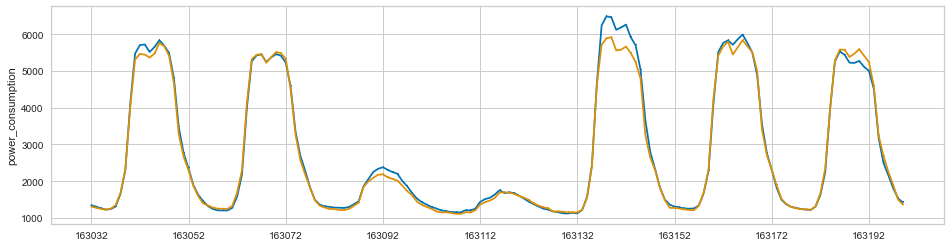

 80%|████████████████████████████████████████████████████████████▊               | 80/100 [8:57:08<3:06:20, 559.02s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 163200 to 165239
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,3899
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,43.2222,5496.0216,73.2802,0.9919,0.0566,0.0337,2.5040
rf,Random Forest Regressor,45.9665,5635.6324,74.0328,0.9917,0.0543,0.0346,2.5740
lightgbm,Light Gradient Boosting Machine,45.4398,5500.2715,73.1169,0.9919,0.0538,0.0348,2.7290
gbr,Gradient Boosting Regressor,47.5780,5691.0079,74.7087,0.9916,0.0540,0.0356,2.4550
xgboost,Extreme Gradient Boosting,47.7232,6075.7138,76.9882,0.9910,0.0564,0.0363,2.4790
knn,K Neighbors Regressor,61.4359,10115.6841,99.2354,0.9850,0.0663,0.0431,2.4120
dt,Decision Tree Regressor,61.2506,10542.1342,101.7328,0.9844,0.0763,0.0466,2.3970
huber,Huber Regressor,65.6481,10321.4840,100.0970,0.9847,0.0686,0.0482,2.4100
omp,Orthogonal Matching Pursuit,71.5436,12477.3125,110.2143,0.9815,0.0696,0.0494,2.4180
ridge,Ridge Regression,66.1526,8936.0945,93.2978,0.9868,0.0926,0.0597,2.4190


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,45.4582,5856.1071,76.5252,0.9910,0.0603,0.0371
1,48.4260,6230.5453,78.9338,0.9905,0.0620,0.0356
2,38.4848,3612.3235,60.1026,0.9947,0.0463,0.0296
3,50.3957,5940.9811,77.0778,0.9913,0.0573,0.0384
4,40.0398,3403.4277,58.3389,0.9950,0.0463,0.0322
5,49.1108,7940.2465,89.1081,0.9885,0.0527,0.0325
6,42.8573,5362.0962,73.2263,0.9920,0.0535,0.0328
7,39.9889,3625.7026,60.2138,0.9944,0.0496,0.0336
8,48.3900,8270.6197,90.9429,0.9883,0.0762,0.0380


Transformation Pipeline and Model Successfully Saved


[Building #81]SMAPE : 3.449327933581935


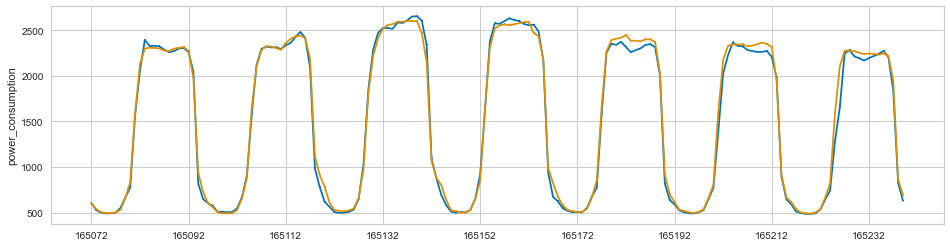

 81%|█████████████████████████████████████████████████████████████▌              | 81/100 [9:06:44<2:58:39, 564.19s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 165240 to 167279
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,8059
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,76.6731,15476.9095,122.8348,0.9898,0.0539,0.0354,2.7170
lightgbm,Light Gradient Boosting Machine,87.6838,21881.1318,145.6839,0.9857,0.0588,0.0394,2.8500
et,Extra Trees Regressor,82.6588,15850.6407,124.8380,0.9894,0.0580,0.0394,2.5210
gbr,Gradient Boosting Regressor,91.2869,18498.5218,134.4331,0.9877,0.0579,0.0417,2.4810
rf,Random Forest Regressor,97.5415,26137.4971,157.3526,0.9830,0.0700,0.0466,2.6060
dt,Decision Tree Regressor,127.5181,45443.5354,208.8690,0.9702,0.0929,0.0610,2.4450
huber,Huber Regressor,148.9160,80625.4571,277.6584,0.9471,0.1112,0.0694,2.4210
omp,Orthogonal Matching Pursuit,166.8421,89055.6516,294.1295,0.9415,0.1166,0.0755,2.4550
knn,K Neighbors Regressor,169.1238,87492.9875,291.4428,0.9427,0.1171,0.0770,2.4450
ada,AdaBoost Regressor,153.7879,44719.1216,210.4449,0.9703,0.1019,0.0777,2.4440


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,70.6135,11783.3720,108.5512,0.9920,0.0533,0.0357
1,83.5447,17517.2983,132.3529,0.9895,0.0493,0.0354
2,78.3408,15895.6882,126.0781,0.9896,0.0517,0.0346
3,85.1486,19494.9237,139.6242,0.9877,0.0538,0.0349
4,70.7097,11284.6470,106.2292,0.9921,0.0512,0.0357
5,63.4814,8852.0022,94.0851,0.9927,0.0396,0.0290
6,80.3812,14065.2707,118.5971,0.9908,0.0543,0.0374
7,75.2152,11106.3410,105.3866,0.9916,0.0497,0.0355
8,66.1027,11748.1747,108.3890,0.9927,0.0469,0.0314


Transformation Pipeline and Model Successfully Saved


[Building #82]SMAPE : 4.036209662908912


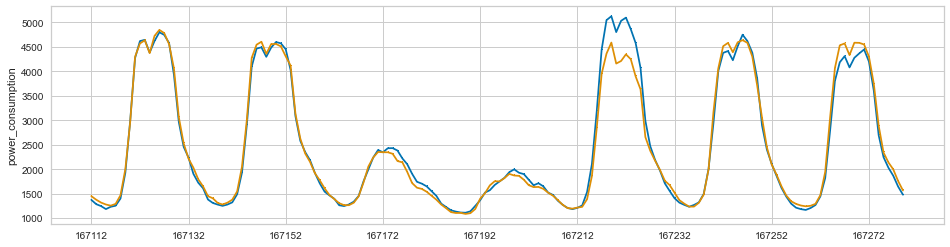

 82%|██████████████████████████████████████████████████████████████▎             | 82/100 [9:16:26<2:50:54, 569.69s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 167280 to 169319
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1457
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,43.6026,5910.1039,74.5868,0.9928,0.0530,0.0315,2.7170
xgboost,Extreme Gradient Boosting,48.7014,9233.3331,93.4678,0.9885,0.0613,0.0336,2.7670
gbr,Gradient Boosting Regressor,54.5852,8476.9580,91.2731,0.9897,0.0580,0.0375,2.5070
lightgbm,Light Gradient Boosting Machine,54.9776,11274.7976,104.1639,0.9863,0.0668,0.0381,2.8730
rf,Random Forest Regressor,54.1360,9998.9290,97.6760,0.9877,0.0654,0.0385,2.6280
dt,Decision Tree Regressor,76.8366,25825.6882,152.1704,0.9674,0.0947,0.0519,2.4590
knn,K Neighbors Regressor,108.1474,58362.0238,237.4769,0.9293,0.1418,0.0767,2.4340
huber,Huber Regressor,102.8912,61061.4457,239.8257,0.9266,0.1448,0.0775,2.4900
omp,Orthogonal Matching Pursuit,112.3448,62772.7988,244.3793,0.9246,0.1457,0.0811,2.4420
ada,AdaBoost Regressor,100.0800,19409.5953,137.8751,0.9765,0.1059,0.0835,2.4780


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,39.9111,6298.2716,79.3617,0.9909,0.0595,0.0306
1,30.5288,2218.2396,47.0982,0.9967,0.0282,0.0215
2,49.1593,6797.8098,82.4488,0.9904,0.0576,0.0348
3,52.1756,12313.3894,110.9657,0.9846,0.0866,0.0407
4,40.3570,3529.3982,59.4087,0.9964,0.0348,0.0264
5,47.6510,5461.4768,73.9018,0.9938,0.0460,0.0298
6,41.6991,6245.1461,79.0262,0.9930,0.0490,0.0277
7,42.9354,4850.3090,69.6442,0.9942,0.0464,0.0308
8,43.7602,5689.2141,75.4269,0.9929,0.0507,0.0307


Transformation Pipeline and Model Successfully Saved


[Building #83]SMAPE : 2.7061396144906427


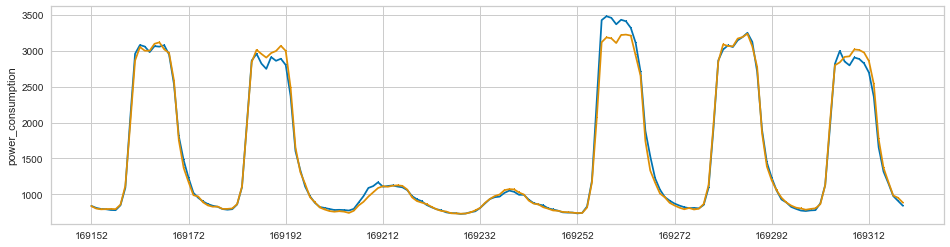

 83%|███████████████████████████████████████████████████████████████             | 83/100 [9:26:26<2:43:59, 578.81s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 169320 to 171359
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1881
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,46.7422,6102.2297,76.9152,0.9908,0.0463,0.0281,2.5740
xgboost,Extreme Gradient Boosting,49.4989,6419.1532,79.1826,0.9904,0.0465,0.0290,2.5470
gbr,Gradient Boosting Regressor,54.5401,7348.7139,84.8615,0.9889,0.0469,0.0316,2.5130
lightgbm,Light Gradient Boosting Machine,57.2494,12550.7955,104.5701,0.9811,0.0543,0.0328,2.7900
rf,Random Forest Regressor,59.6840,10717.4928,99.3218,0.9840,0.0571,0.0357,2.6240
dt,Decision Tree Regressor,78.8070,16253.0046,126.1448,0.9756,0.0757,0.0469,2.4830
huber,Huber Regressor,98.2664,37056.2858,187.3533,0.9446,0.0994,0.0596,2.4820
en,Elastic Net,100.8864,32691.6422,176.8779,0.9511,0.1038,0.0647,2.4960
knn,K Neighbors Regressor,115.6367,45071.9930,208.5425,0.9322,0.1057,0.0657,2.4850
omp,Orthogonal Matching Pursuit,118.2274,42990.9994,204.6029,0.9359,0.1049,0.0678,2.5210


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,45.8954,6410.8496,80.0678,0.9887,0.0549,0.0294
1,39.3411,3622.3810,60.1862,0.9950,0.0298,0.0216
2,44.7640,8199.4374,90.5507,0.9886,0.0632,0.0296
3,47.5316,5493.2151,74.1162,0.9918,0.0454,0.0288
4,37.6133,2899.1966,53.8442,0.9958,0.0301,0.0220
5,37.2676,3023.8034,54.9891,0.9949,0.0318,0.0226
6,47.6452,5375.7780,73.3197,0.9929,0.0323,0.0238
7,43.4099,4653.4657,68.2163,0.9928,0.0413,0.0249
8,55.5579,7727.2923,87.9050,0.9892,0.0569,0.0342


Transformation Pipeline and Model Successfully Saved


[Building #84]SMAPE : 2.5996907660595907


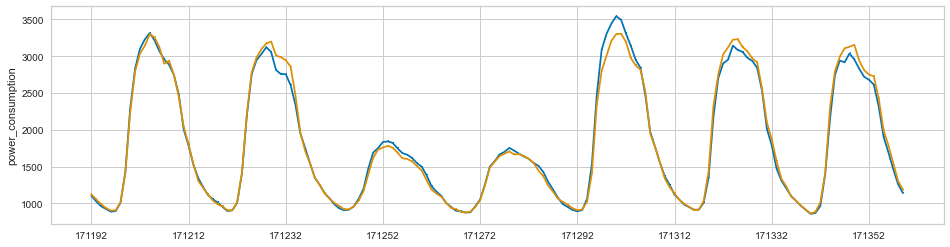

 84%|███████████████████████████████████████████████████████████████▊            | 84/100 [9:36:28<2:36:10, 585.64s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 171360 to 173399
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7599
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,48.8876,4906.5535,69.2810,0.9763,0.0315,0.0222,2.5850
lightgbm,Light Gradient Boosting Machine,49.1601,4738.1093,68.3034,0.9772,0.0311,0.0224,2.7900
xgboost,Extreme Gradient Boosting,52.0939,5218.2568,71.7275,0.9749,0.0328,0.0237,2.7930
gbr,Gradient Boosting Regressor,51.9132,5077.9683,70.7592,0.9756,0.0325,0.0238,2.5250
rf,Random Forest Regressor,55.6476,6057.8063,77.0345,0.9707,0.0348,0.0251,2.6700
br,Bayesian Ridge,68.0067,7447.2578,85.9444,0.9643,0.0413,0.0320,2.5040
ridge,Ridge Regression,68.0634,7430.5035,85.8794,0.9645,0.0414,0.0321,2.5250
llar,Lasso Least Angle Regression,68.0840,7462.6686,86.0176,0.9643,0.0413,0.0321,2.4970
lr,Linear Regression,68.0814,7432.6688,85.8945,0.9645,0.0414,0.0321,2.6360
lasso,Lasso Regression,68.0862,7461.4205,86.0100,0.9643,0.0413,0.0321,2.5270


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,56.2864,6569.1659,81.0504,0.9682,0.0363,0.0254
1,43.1338,3675.7352,60.6278,0.9847,0.0278,0.0195
2,40.6128,3318.9154,57.6100,0.9855,0.0271,0.0187
3,35.4648,2477.3179,49.7727,0.9898,0.0221,0.0161
4,48.3532,4389.4085,66.2526,0.9808,0.0298,0.0218
5,42.8523,3359.6775,57.9627,0.9836,0.0261,0.0193
6,54.0848,5387.7719,73.4014,0.9737,0.0331,0.0242
7,49.4646,5098.5301,71.4040,0.9748,0.0320,0.0221
8,52.5444,5248.8311,72.4488,0.9694,0.0332,0.0244


Transformation Pipeline and Model Successfully Saved


[Building #85]SMAPE : 3.077437556077459


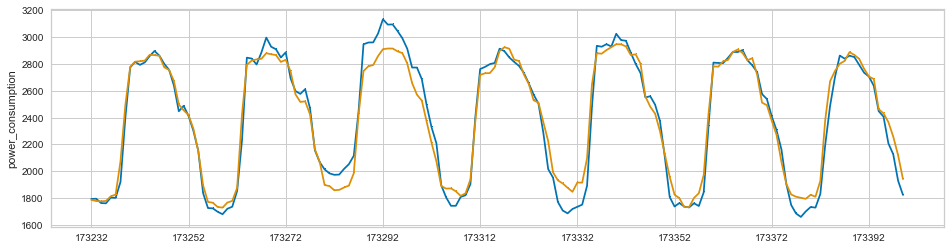

 85%|████████████████████████████████████████████████████████████████▌           | 85/100 [9:46:32<2:27:46, 591.11s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 173400 to 175439
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,5732
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,45.9357,5731.0529,75.2594,0.9729,0.0800,0.0479,2.7990
xgboost,Extreme Gradient Boosting,50.0356,8258.9102,90.0155,0.9613,0.1003,0.0525,2.6470
et,Extra Trees Regressor,49.6929,10060.0572,99.1141,0.9523,0.1086,0.0540,2.5740
gbr,Gradient Boosting Regressor,58.7734,8665.7254,92.8036,0.9589,0.1008,0.0626,2.5410
rf,Random Forest Regressor,58.9760,13186.1473,113.1651,0.9375,0.1198,0.0635,2.6720
dt,Decision Tree Regressor,63.1294,20649.7663,139.1804,0.9034,0.1445,0.0644,2.4990
knn,K Neighbors Regressor,74.9613,23947.4939,153.2789,0.8872,0.1504,0.0784,2.5250
en,Elastic Net,78.6028,22933.7106,149.5526,0.8919,0.1456,0.0823,2.5420
llar,Lasso Least Angle Regression,78.6865,22946.4323,149.5615,0.8918,0.1456,0.0824,2.5330
lasso,Lasso Regression,78.6924,22958.4551,149.6012,0.8918,0.1456,0.0824,2.7560


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,45.2498,5628.1032,75.0207,0.9738,0.0822,0.0482
1,49.1827,6522.0846,80.7594,0.9700,0.0863,0.0528
2,49.7262,7747.6871,88.0209,0.9639,0.1050,0.0568
3,36.5949,4080.5665,63.8793,0.9801,0.0638,0.0354
4,39.1677,4319.7019,65.7244,0.9780,0.0668,0.0388
5,49.2446,6123.5903,78.2534,0.9687,0.0801,0.0490
6,43.6131,6098.8844,78.0954,0.9723,0.0868,0.0465
7,45.6589,6882.5405,82.9611,0.9716,0.0862,0.0476
8,49.3068,7748.5951,88.0261,0.9624,0.0960,0.0538


Transformation Pipeline and Model Successfully Saved


[Building #86]SMAPE : 5.121139493131309


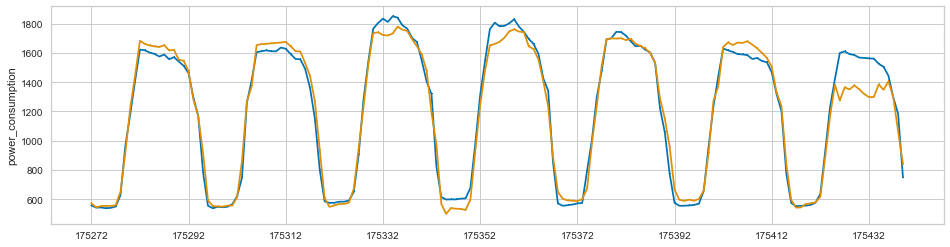

 86%|█████████████████████████████████████████████████████████████████▎          | 86/100 [9:56:37<2:18:53, 595.27s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 175440 to 177479
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,6647
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,80.5273,20438.3464,142.4440,0.9446,0.1314,0.0768,2.7480
lightgbm,Light Gradient Boosting Machine,83.0958,17709.3248,132.6715,0.9519,0.1243,0.0799,3.0560
xgboost,Extreme Gradient Boosting,83.8016,19539.7088,138.5716,0.9469,0.1299,0.0803,2.7070
rf,Random Forest Regressor,91.9407,25940.3287,159.9572,0.9297,0.1473,0.0889,2.8490
gbr,Gradient Boosting Regressor,95.4910,22471.8859,149.1555,0.9390,0.1431,0.0948,2.6870
dt,Decision Tree Regressor,117.1353,47510.7833,214.1020,0.8714,0.1941,0.1123,2.7420
en,Elastic Net,115.4644,31814.5922,177.4106,0.9137,0.1737,0.1201,2.5350
br,Bayesian Ridge,115.6303,31860.5654,177.5005,0.9136,0.1743,0.1205,2.5730
llar,Lasso Least Angle Regression,115.6995,31808.1422,177.4324,0.9137,0.1746,0.1206,2.5390
lasso,Lasso Regression,115.6910,31808.9119,177.4338,0.9137,0.1746,0.1206,2.6340


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,73.9858,15554.1996,124.7165,0.9618,0.1207,0.0742
1,78.6648,16076.4295,126.7929,0.9548,0.1041,0.0651
2,83.9860,19909.6878,141.1017,0.9470,0.1325,0.0868
3,75.9405,16958.0467,130.2231,0.9522,0.1062,0.0643
4,80.8326,19718.3027,140.4219,0.9461,0.1472,0.0866
5,84.8371,17367.0061,131.7839,0.9525,0.1162,0.0724
6,73.0127,18083.6102,134.4753,0.9488,0.1213,0.0700
7,89.4595,23181.7623,152.2556,0.9376,0.1411,0.0819
8,71.4592,13731.3391,117.1808,0.9632,0.1129,0.0689


Transformation Pipeline and Model Successfully Saved


[Building #87]SMAPE : 8.842573680200601


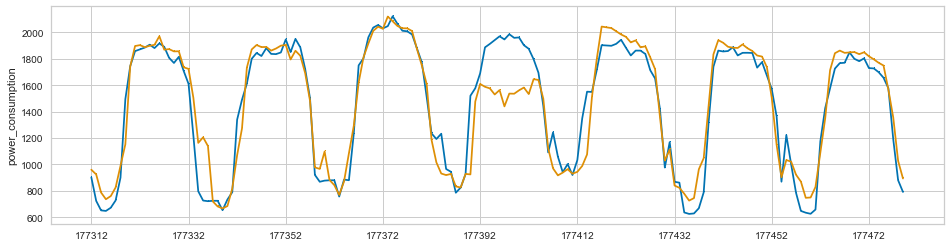

 87%|█████████████████████████████████████████████████████████████████▎         | 87/100 [10:07:05<2:11:05, 605.00s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 177480 to 179519
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,982
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,54.3005,11638.1876,105.1852,0.9682,0.1109,0.0579,3.0280
et,Extra Trees Regressor,53.3245,12922.9780,112.1295,0.9646,0.1237,0.0596,2.8320
lightgbm,Light Gradient Boosting Machine,55.8918,11502.6752,105.5014,0.9683,0.1127,0.0605,3.0970
dt,Decision Tree Regressor,58.6180,20339.2761,132.1175,0.9445,0.1364,0.0625,2.9490
rf,Random Forest Regressor,62.7039,19774.7548,138.7827,0.9457,0.1460,0.0706,3.1890
gbr,Gradient Boosting Regressor,70.3484,17423.5436,130.6693,0.9522,0.1377,0.0778,2.7600
knn,K Neighbors Regressor,86.7999,37333.7180,190.2559,0.8978,0.1859,0.0944,2.8560
omp,Orthogonal Matching Pursuit,91.6131,32417.4037,178.3884,0.9111,0.1771,0.0978,2.8880
br,Bayesian Ridge,91.0235,31635.3377,176.1998,0.9133,0.1772,0.1015,2.9560
lasso,Lasso Regression,90.2928,31499.6076,175.9458,0.9137,0.1780,0.1019,2.7550


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,51.0672,7991.9270,89.3976,0.9793,0.0889,0.0500
1,35.4159,6198.1214,78.7281,0.9840,0.0903,0.0407
2,65.3750,16119.1754,126.9613,0.9545,0.1327,0.0674
3,51.6428,14199.3109,119.1609,0.9661,0.1365,0.0620
4,46.1987,7803.2922,88.3362,0.9777,0.0806,0.0419
5,67.3683,19943.4692,141.2213,0.9411,0.1504,0.0709
6,58.0152,12873.3841,113.4609,0.9655,0.1461,0.0767
7,45.6716,7160.3058,84.6186,0.9790,0.0864,0.0454
8,45.4933,7547.7840,86.8780,0.9781,0.0858,0.0472


Transformation Pipeline and Model Successfully Saved


[Building #88]SMAPE : 7.91133493649


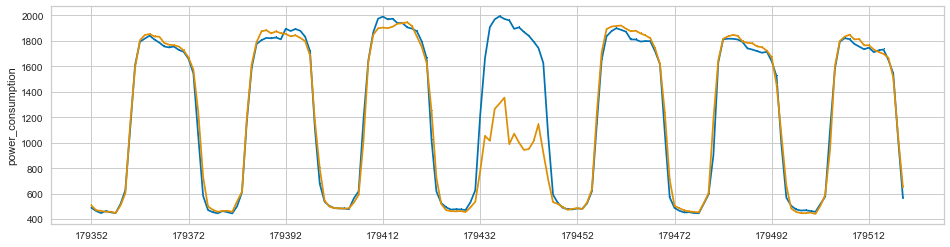

 88%|██████████████████████████████████████████████████████████████████         | 88/100 [10:18:20<2:05:15, 626.27s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 179520 to 181559
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,644
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,83.8932,26191.2991,157.1359,0.9566,0.1319,0.0730,3.0080
lightgbm,Light Gradient Boosting Machine,79.8242,20241.4539,139.4893,0.9665,0.1265,0.0730,2.9610
et,Extra Trees Regressor,79.0028,25067.4655,155.0305,0.9585,0.1433,0.0738,3.0450
rf,Random Forest Regressor,102.8076,46993.6651,214.0105,0.9222,0.1807,0.0959,3.1810
gbr,Gradient Boosting Regressor,103.4901,33849.6362,181.4890,0.9437,0.1640,0.0970,2.9810
dt,Decision Tree Regressor,125.9559,85922.9490,290.3354,0.8570,0.2396,0.1124,2.9150
knn,K Neighbors Regressor,130.2085,72463.2336,265.9389,0.8797,0.2092,0.1153,2.8810
omp,Orthogonal Matching Pursuit,135.6104,65430.4363,253.3197,0.8916,0.2012,0.1198,2.9120
br,Bayesian Ridge,133.5264,64721.4367,251.8419,0.8928,0.2045,0.1254,2.9130
lasso,Lasso Regression,133.0624,63852.4535,250.1713,0.8942,0.2055,0.1265,2.9370


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,89.2086,31329.1915,177.0005,0.9497,0.1834,0.1005
1,74.1443,15073.7340,122.7751,0.9738,0.1256,0.0716
2,98.2013,37646.9052,194.0281,0.9339,0.1573,0.0831
3,90.0297,19726.2772,140.4503,0.9677,0.1266,0.0765
4,64.0323,9795.1522,98.9705,0.9847,0.0905,0.0550
5,60.7645,10799.3379,103.9199,0.9804,0.0822,0.0483
6,83.2702,34180.2686,184.8791,0.9450,0.1257,0.0635
7,68.2919,12107.9055,110.0359,0.9802,0.1029,0.0608
8,77.5980,21453.0337,146.4685,0.9649,0.1280,0.0701


Transformation Pipeline and Model Successfully Saved


[Building #89]SMAPE : 6.99296708638169


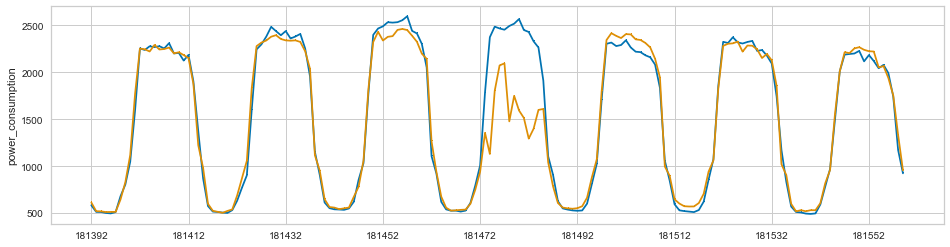

 89%|██████████████████████████████████████████████████████████████████▊        | 89/100 [10:29:46<1:58:05, 644.17s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 181560 to 183599
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7253
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,73.8046,23609.1485,152.1438,0.9642,0.1516,0.0769,3.0380
lightgbm,Light Gradient Boosting Machine,81.5385,23896.2849,151.9593,0.9636,0.1413,0.0801,3.0060
xgboost,Extreme Gradient Boosting,82.6830,27708.9875,163.9098,0.9579,0.1580,0.0832,2.9770
rf,Random Forest Regressor,90.0491,37170.3107,189.5188,0.9436,0.1823,0.0956,3.3460
dt,Decision Tree Regressor,106.6205,64592.0770,246.7041,0.9014,0.2299,0.1036,2.9470
gbr,Gradient Boosting Regressor,99.9828,37044.7047,189.9511,0.9441,0.1852,0.1070,3.0020
knn,K Neighbors Regressor,124.4414,79446.0586,278.0382,0.8797,0.2442,0.1329,3.1170
omp,Orthogonal Matching Pursuit,140.7016,77824.6930,276.8921,0.8825,0.2448,0.1492,3.0370
br,Bayesian Ridge,140.5302,74579.6262,270.7761,0.8873,0.2522,0.1575,2.9940
en,Elastic Net,138.7425,71487.5770,265.0796,0.8920,0.2509,0.1576,3.0020


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,70.5780,21875.1631,147.9025,0.9668,0.1604,0.0802
1,76.2757,20352.4866,142.6621,0.9678,0.1448,0.0827
2,77.1022,31763.7413,178.2239,0.9505,0.1809,0.0955
3,79.5000,23054.6961,151.8377,0.9671,0.1311,0.0653
4,56.3902,12289.5382,110.8582,0.9821,0.1134,0.0568
5,78.7144,20546.0735,143.3390,0.9696,0.1092,0.0636
6,63.4906,14058.9804,118.5706,0.9809,0.1390,0.0718
7,98.3305,37344.9056,193.2483,0.9387,0.1616,0.0867
8,64.8244,15918.4301,126.1683,0.9752,0.1391,0.0723


Transformation Pipeline and Model Successfully Saved


[Building #90]SMAPE : 7.6474867541861125


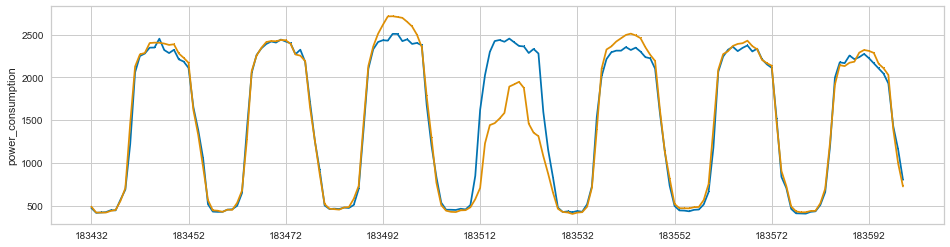

 90%|███████████████████████████████████████████████████████████████████▌       | 90/100 [10:41:30<1:50:18, 661.88s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 183600 to 185639
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1818
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,58.5365,9399.8297,96.2861,0.9861,0.0803,0.0532,3.0540
et,Extra Trees Regressor,58.6445,11843.1874,107.6234,0.9826,0.0914,0.0538,3.1310
xgboost,Extreme Gradient Boosting,58.3197,9513.3464,96.5691,0.9860,0.0838,0.0538,3.0900
rf,Random Forest Regressor,64.9652,13495.6475,115.3092,0.9801,0.0954,0.0593,3.1590
gbr,Gradient Boosting Regressor,71.9400,13070.7136,113.7829,0.9807,0.0951,0.0646,3.0030
knn,K Neighbors Regressor,89.4025,26051.2871,160.5820,0.9617,0.1157,0.0751,2.9400
huber,Huber Regressor,86.2419,24825.3309,156.0532,0.9633,0.1170,0.0755,2.9580
dt,Decision Tree Regressor,83.8857,26943.8270,162.0507,0.9604,0.1339,0.0764,2.9380
en,Elastic Net,88.1106,21817.4373,146.6794,0.9678,0.1155,0.0794,3.0190
omp,Orthogonal Matching Pursuit,93.3973,23490.4446,152.1445,0.9653,0.1134,0.0795,2.9360


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,49.3923,6707.0542,81.8966,0.9905,0.0718,0.0467
1,55.5181,8846.2527,94.0545,0.9864,0.0858,0.0511
2,51.5000,7699.4106,87.7463,0.9891,0.0749,0.0484
3,57.4364,10709.3591,103.4860,0.9829,0.0807,0.0485
4,58.2759,10061.0054,100.3046,0.9865,0.0883,0.0532
5,62.3101,15817.8020,125.7688,0.9761,0.1058,0.0583
6,50.1290,7526.6572,86.7563,0.9894,0.0740,0.0480
7,58.1846,11895.7567,109.0677,0.9823,0.0818,0.0497
8,64.9542,11306.5716,106.3324,0.9834,0.0809,0.0556


Transformation Pipeline and Model Successfully Saved


[Building #91]SMAPE : 10.977237004317084


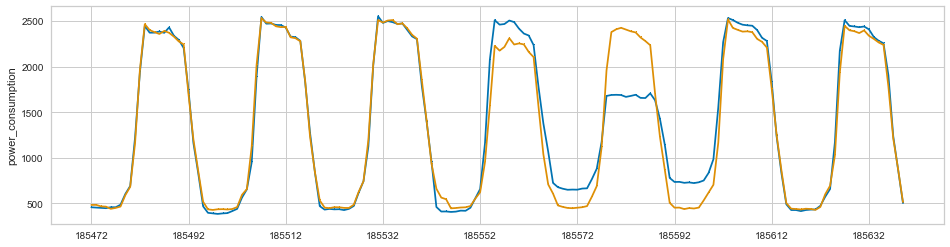

 91%|████████████████████████████████████████████████████████████████████▎      | 91/100 [10:53:07<1:40:52, 672.55s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 185640 to 187679
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7584
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,55.0203,7898.0133,88.4492,0.9759,0.0773,0.0475,3.0030
xgboost,Extreme Gradient Boosting,56.5129,9112.9876,94.8507,0.9721,0.0826,0.0483,2.9900
et,Extra Trees Regressor,56.1106,10033.6407,99.7637,0.9693,0.0879,0.0487,3.0690
rf,Random Forest Regressor,62.2416,12067.6075,109.4286,0.9631,0.0956,0.0543,3.1370
dt,Decision Tree Regressor,66.5697,14317.8727,117.8657,0.9562,0.1043,0.0554,2.8970
gbr,Gradient Boosting Regressor,75.7602,16399.5110,127.2382,0.9497,0.1076,0.0670,3.0130
knn,K Neighbors Regressor,84.4275,28464.6721,167.8615,0.9128,0.1360,0.0713,2.9220
br,Bayesian Ridge,85.8603,25446.1640,158.6852,0.9224,0.1272,0.0734,2.9210
omp,Orthogonal Matching Pursuit,85.7337,25381.0497,158.1566,0.9226,0.1281,0.0739,2.9610
en,Elastic Net,86.2674,25438.3440,158.6676,0.9224,0.1274,0.0740,2.9210


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,56.7473,7282.7863,85.3392,0.9789,0.0805,0.0498
1,53.3297,8809.1293,93.8570,0.9733,0.0839,0.0439
2,60.7113,10941.8155,104.6031,0.9645,0.0913,0.0541
3,51.5771,5586.7163,74.7443,0.9833,0.0667,0.0446
4,54.8400,9103.9029,95.4144,0.9728,0.0863,0.0510
5,50.3098,6980.8253,83.5513,0.9796,0.0777,0.0464
6,58.8507,7875.3924,88.7434,0.9730,0.0699,0.0459
7,47.1055,8704.9166,93.3001,0.9745,0.0704,0.0373
8,53.2819,7885.2803,88.7991,0.9756,0.0830,0.0468


Transformation Pipeline and Model Successfully Saved


[Building #92]SMAPE : 5.907400697737773


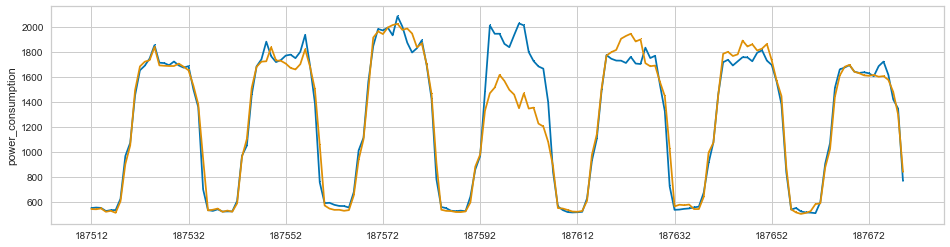

 92%|█████████████████████████████████████████████████████████████████████      | 92/100 [11:04:36<1:30:19, 677.48s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 187680 to 189719
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7652
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,31.2948,1945.4099,43.9481,0.9753,0.0463,0.0315,2.9860
et,Extra Trees Regressor,32.4063,2145.4921,46.0605,0.9727,0.0486,0.0325,3.0370
xgboost,Extreme Gradient Boosting,32.5665,2088.6870,45.5502,0.9735,0.0483,0.0329,3.0120
rf,Random Forest Regressor,33.9078,2297.6615,47.7356,0.9708,0.0503,0.0340,3.1500
gbr,Gradient Boosting Regressor,35.4969,2313.6273,47.9173,0.9707,0.0496,0.0353,2.9940
knn,K Neighbors Regressor,41.2982,3308.5237,57.3494,0.9581,0.0594,0.0411,2.9310
ridge,Ridge Regression,41.1677,2920.7340,53.8971,0.9631,0.0581,0.0423,2.9130
lr,Linear Regression,41.1735,2921.0658,53.9024,0.9630,0.0581,0.0424,2.9670
llar,Lasso Least Angle Regression,41.8085,2975.4902,54.3779,0.9624,0.0585,0.0429,2.9270
br,Bayesian Ridge,41.7928,2976.0507,54.3865,0.9624,0.0585,0.0429,2.9360


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,36.9977,2457.7631,49.5758,0.9704,0.0513,0.0362
1,30.0682,1863.0348,43.1629,0.9753,0.0433,0.0289
2,31.9204,2357.1275,48.5503,0.9690,0.0516,0.0319
3,30.3889,1664.5835,40.7993,0.9775,0.0416,0.0293
4,29.1453,1685.3552,41.0531,0.9808,0.0440,0.0295
5,26.6793,1355.9825,36.8237,0.9831,0.0392,0.0266
6,28.3226,1594.4288,39.9303,0.9829,0.0438,0.0300
7,33.1505,2184.1700,46.7351,0.9749,0.0506,0.0357
8,34.3059,2309.6603,48.0589,0.9641,0.0503,0.0334


Transformation Pipeline and Model Successfully Saved


[Building #93]SMAPE : 5.385177159558132


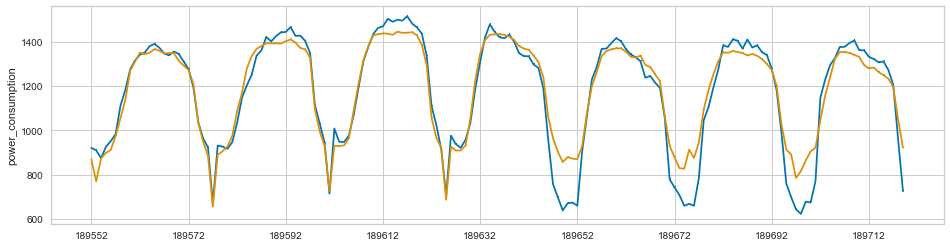

 93%|█████████████████████████████████████████████████████████████████████▊     | 93/100 [11:16:03<1:19:22, 680.35s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 189720 to 191759
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,1573
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,98.5442,16787.6635,129.4835,0.9618,0.0583,0.0433,3.0470
et,Extra Trees Regressor,100.1912,18093.6304,134.3346,0.9587,0.0617,0.0445,3.0710
xgboost,Extreme Gradient Boosting,104.1372,19098.6388,137.9923,0.9567,0.0619,0.0456,2.9590
rf,Random Forest Regressor,109.3389,21181.6739,145.3837,0.9519,0.0664,0.0482,3.1440
gbr,Gradient Boosting Regressor,109.7024,19984.7392,141.1311,0.9547,0.0649,0.0484,2.9980
lasso,Lasso Regression,134.4849,27571.0094,165.8859,0.9374,0.0756,0.0589,2.9510
ridge,Ridge Regression,134.4675,27533.7562,165.7587,0.9375,0.0756,0.0589,2.9310
llar,Lasso Least Angle Regression,134.4784,27570.2854,165.8837,0.9374,0.0756,0.0589,3.1260
lr,Linear Regression,134.4779,27539.1062,165.7729,0.9375,0.0756,0.0590,2.9830
br,Bayesian Ridge,134.9553,27744.0523,166.4167,0.9370,0.0758,0.0591,2.9530


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,101.7059,18736.6099,136.8817,0.9613,0.0683,0.0473
1,94.4954,15344.5382,123.8731,0.9662,0.0562,0.0414
2,87.8004,14997.4694,122.4642,0.9640,0.0595,0.0404
3,90.9299,15591.2200,124.8648,0.9593,0.0555,0.0401
4,99.3670,15883.3403,126.0291,0.9602,0.0561,0.0424
5,94.9657,15193.9641,123.2638,0.9688,0.0557,0.0419
6,93.0414,16166.7800,127.1487,0.9666,0.0564,0.0404
7,100.7548,17905.0598,133.8098,0.9532,0.0603,0.0448
8,99.7829,16390.9766,128.0272,0.9668,0.0549,0.0423


Transformation Pipeline and Model Successfully Saved


[Building #94]SMAPE : 7.613414498288174


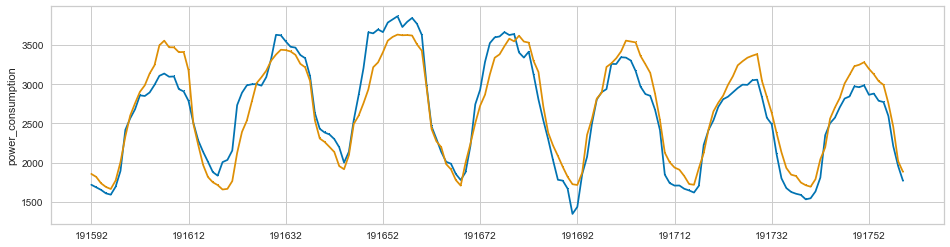

 94%|██████████████████████████████████████████████████████████████████████▌    | 94/100 [11:27:40<1:08:32, 685.38s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 191760 to 193799
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,2128
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
huber,Huber Regressor,128.9548,27425.5260,165.3518,0.7266,0.1924,2.0657,2.9940
omp,Orthogonal Matching Pursuit,127.3047,26504.9832,162.4522,0.7363,0.1890,2.1011,2.9520
dt,Decision Tree Regressor,172.8513,50033.5539,223.1123,0.5031,0.3217,2.1030,2.9700
br,Bayesian Ridge,126.4889,26296.9406,161.8172,0.7384,0.1890,2.1539,2.9710
xgboost,Extreme Gradient Boosting,130.4610,27418.8111,165.4032,0.7259,0.1956,2.1720,3.0870
en,Elastic Net,126.5431,26328.0568,161.9291,0.7380,0.1895,2.1802,2.9700
rf,Random Forest Regressor,124.6171,25750.7333,160.1672,0.7429,0.1893,2.1943,3.1720
lasso,Lasso Regression,126.6291,26385.7156,162.1024,0.7374,0.1897,2.2163,2.9810
llar,Lasso Least Angle Regression,126.6291,26385.7670,162.1026,0.7374,0.1897,2.2164,2.9690
ridge,Ridge Regression,126.6592,26499.0602,162.4446,0.7362,0.1900,2.2275,2.9560


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,127.7388,29325.1960,171.2460,0.7173,0.5864,19.7657
1,130.6769,28332.6960,168.3232,0.7450,0.1476,0.1198
2,123.7064,26634.0319,163.1994,0.7683,0.1386,0.1113
3,108.9977,19860.7622,140.9282,0.7578,0.1344,0.1056
4,118.1067,22501.4295,150.0048,0.7490,0.1357,0.1097
5,127.6377,25603.1175,160.0097,0.7484,0.1398,0.1158
6,134.7679,29802.0830,172.6328,0.6689,0.1549,0.1226
7,136.2476,28999.2778,170.2917,0.7419,0.1588,0.1304
8,122.0156,24747.1439,157.3122,0.7727,0.1372,0.1069


Transformation Pipeline and Model Successfully Saved


[Building #95]SMAPE : 16.912945188051815


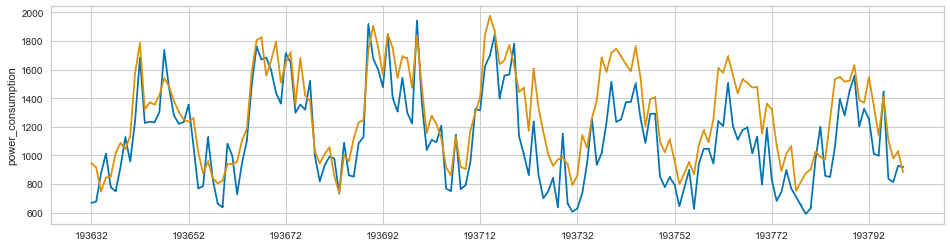

 95%|█████████████████████████████████████████████████████████████████████████▏   | 95/100 [11:39:19<57:27, 689.53s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 193800 to 195839
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,6631
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,72.4846,9434.3352,96.8870,0.9806,0.0356,0.0267,3.1570
lightgbm,Light Gradient Boosting Machine,73.2150,9484.9041,97.1377,0.9805,0.0356,0.0269,2.9580
xgboost,Extreme Gradient Boosting,77.7379,10671.0675,103.1191,0.9780,0.0382,0.0288,3.0460
gbr,Gradient Boosting Regressor,78.9168,10872.8554,104.0627,0.9776,0.0384,0.0292,3.0970
rf,Random Forest Regressor,79.7307,11376.7603,106.5133,0.9766,0.0391,0.0294,3.2710
en,Elastic Net,91.4216,14191.2296,118.7568,0.9708,0.0429,0.0333,3.0640
ridge,Ridge Regression,91.1093,14099.6188,118.3643,0.9710,0.0428,0.0333,3.0120
llar,Lasso Least Angle Regression,91.1522,14133.1861,118.5303,0.9710,0.0429,0.0333,3.0080
lr,Linear Regression,91.1095,14101.5216,118.3706,0.9710,0.0428,0.0333,3.1730
lasso,Lasso Regression,91.1515,14133.3626,118.5308,0.9710,0.0429,0.0333,3.0740


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,73.9607,8812.8538,93.8768,0.9834,0.0382,0.0293
1,66.6166,7436.8402,86.2371,0.9844,0.0328,0.0247
2,67.7010,8121.6283,90.1201,0.9813,0.0321,0.0243
3,64.9718,7737.9385,87.9656,0.9829,0.0303,0.0230
4,73.3105,9610.5780,98.0336,0.9803,0.0338,0.0262
5,75.4025,11455.0962,107.0285,0.9774,0.0353,0.0262
6,70.5056,9324.0888,96.5613,0.9787,0.0350,0.0259
7,68.7891,8743.8991,93.5088,0.9834,0.0344,0.0254
8,64.9045,7177.8178,84.7220,0.9850,0.0312,0.0234


Transformation Pipeline and Model Successfully Saved


[Building #96]SMAPE : 3.862255953512782


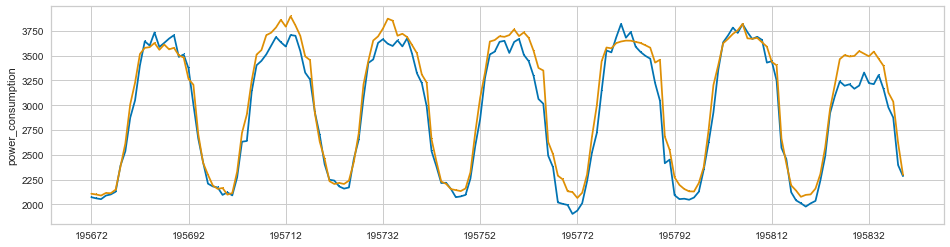

 96%|█████████████████████████████████████████████████████████████████████████▉   | 96/100 [11:51:09<46:22, 695.64s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 195840 to 197879
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,473
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,48.7569,4190.0242,64.6685,0.9606,0.0566,0.0421,3.0740
et,Extra Trees Regressor,49.4366,4416.1439,66.3754,0.9584,0.0587,0.0429,3.1270
rf,Random Forest Regressor,51.5334,4621.6957,67.8807,0.9565,0.0592,0.0445,3.2280
xgboost,Extreme Gradient Boosting,51.6240,4631.4719,67.9986,0.9565,0.0604,0.0450,3.0450
gbr,Gradient Boosting Regressor,54.1297,4904.1716,69.9311,0.9539,0.0616,0.0469,3.0550
lasso,Lasso Regression,56.8470,5470.5643,73.8502,0.9486,0.0642,0.0487,3.0120
llar,Lasso Least Angle Regression,56.8471,5470.5462,73.8501,0.9486,0.0642,0.0487,2.9950
lr,Linear Regression,56.9386,5472.2269,73.8602,0.9486,0.0643,0.0488,3.1730
ridge,Ridge Regression,56.9210,5470.2146,73.8466,0.9486,0.0643,0.0488,3.0290
br,Bayesian Ridge,57.1476,5520.3877,74.1895,0.9481,0.0646,0.0489,3.0020


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,46.8130,3689.3556,60.7401,0.9632,0.0575,0.0427
1,45.5451,4092.0103,63.9688,0.9619,0.0558,0.0391
2,48.8875,3827.8476,61.8696,0.9665,0.0579,0.0431
3,44.7902,4004.5086,63.2812,0.9552,0.0555,0.0387
4,45.1666,3462.0976,58.8396,0.9674,0.0486,0.0373
5,48.8215,4258.3091,65.2557,0.9575,0.0592,0.0441
6,50.5374,4298.8162,65.5654,0.9605,0.0560,0.0426
7,47.7364,4458.9071,66.7750,0.9592,0.0572,0.0412
8,49.8254,4550.1441,67.4548,0.9609,0.0595,0.0424


Transformation Pipeline and Model Successfully Saved


[Building #97]SMAPE : 4.011642102765458


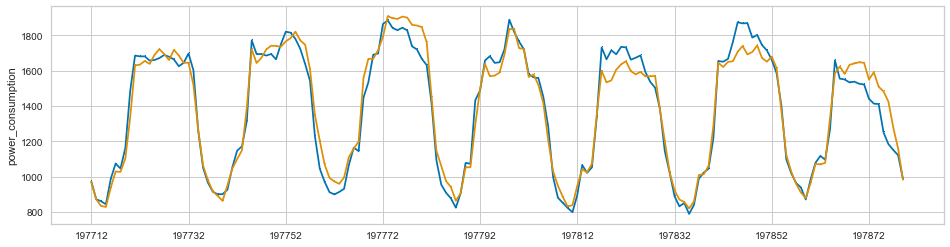

 97%|██████████████████████████████████████████████████████████████████████████▋  | 97/100 [12:02:59<34:59, 699.75s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 197880 to 199919
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,7908
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,65.8748,7768.9902,87.5472,0.9548,0.0885,0.0647,3.1590
et,Extra Trees Regressor,68.2270,8402.7970,91.2814,0.9508,0.0907,0.0663,3.1640
xgboost,Extreme Gradient Boosting,67.3723,8250.6579,90.5321,0.9517,0.0938,0.0667,3.1240
rf,Random Forest Regressor,70.4567,8759.9178,93.0919,0.9488,0.0931,0.0687,3.2490
gbr,Gradient Boosting Regressor,71.8606,8931.3208,94.0342,0.9477,0.0941,0.0705,3.1240
lasso,Lasso Regression,79.0400,9957.9485,99.4399,0.9415,0.1061,0.0810,2.9970
llar,Lasso Least Angle Regression,79.0407,9958.0032,99.4402,0.9415,0.1061,0.0810,3.0310
ridge,Ridge Regression,78.9185,9934.2798,99.3112,0.9416,0.1063,0.0811,3.0550
en,Elastic Net,79.2177,9984.3177,99.5780,0.9413,0.1063,0.0811,3.0040
lr,Linear Regression,78.9266,9936.3064,99.3204,0.9416,0.1063,0.0811,3.0690


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,62.7312,6901.9367,83.0779,0.9588,0.0824,0.0587
1,63.5645,7400.1645,86.0242,0.9563,0.0825,0.0607
2,57.5868,5811.9157,76.2359,0.9574,0.0735,0.0528
3,63.5229,7294.1605,85.4059,0.9568,0.0848,0.0624
4,67.4096,7765.5306,88.1222,0.9583,0.0967,0.0708
5,62.3200,6053.2522,77.8026,0.9585,0.0803,0.0604
6,69.2725,8206.0811,90.5874,0.9549,0.0908,0.0695
7,80.5608,12518.0726,111.8842,0.9348,0.1116,0.0802
8,64.5242,7769.6822,88.1458,0.9599,0.0877,0.0633


Transformation Pipeline and Model Successfully Saved


[Building #98]SMAPE : 13.985731789292476


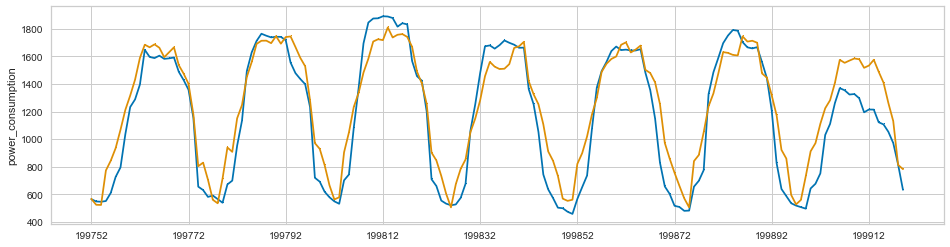

 98%|███████████████████████████████████████████████████████████████████████████▍ | 98/100 [12:14:54<23:28, 704.32s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 199920 to 201959
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,4586
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,30.7042,1574.4752,39.6182,0.9885,0.0339,0.0271,3.1550
et,Extra Trees Regressor,32.4586,1801.8687,42.4165,0.9868,0.0364,0.0286,3.2030
xgboost,Extreme Gradient Boosting,33.7861,1956.3341,44.2049,0.9857,0.0375,0.0296,3.1970
gbr,Gradient Boosting Regressor,34.8538,2025.3960,44.9686,0.9852,0.0382,0.0307,3.1040
rf,Random Forest Regressor,36.3898,2225.7906,47.0944,0.9837,0.0402,0.0320,3.2310
knn,K Neighbors Regressor,49.8269,4693.2370,68.3198,0.9658,0.0541,0.0419,3.0610
lr,Linear Regression,46.0630,3569.1929,59.6040,0.9740,0.0579,0.0423,3.1030
ridge,Ridge Regression,46.0622,3568.5228,59.5983,0.9740,0.0579,0.0423,3.0220
br,Bayesian Ridge,46.1263,3572.2719,59.6292,0.9740,0.0582,0.0424,3.0640
lasso,Lasso Regression,46.4130,3603.8333,59.9007,0.9738,0.0587,0.0427,3.0450


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,30.0073,1440.8442,37.9585,0.9886,0.0309,0.0251
1,30.9495,1552.0236,39.3957,0.9884,0.0354,0.0283
2,27.4690,1343.6088,36.6553,0.9904,0.0328,0.0250
3,28.4061,1467.4915,38.3079,0.9905,0.0304,0.0243
4,32.2900,1727.4101,41.5621,0.9873,0.0356,0.0286
5,32.2294,1594.0292,39.9253,0.9877,0.0335,0.0279
6,28.7653,1527.5119,39.0834,0.9892,0.0325,0.0255
7,34.9599,1843.8191,42.9397,0.9857,0.0362,0.0302
8,29.1072,1447.7957,38.0499,0.9895,0.0356,0.0272


Transformation Pipeline and Model Successfully Saved


[Building #99]SMAPE : 4.1414945606911235


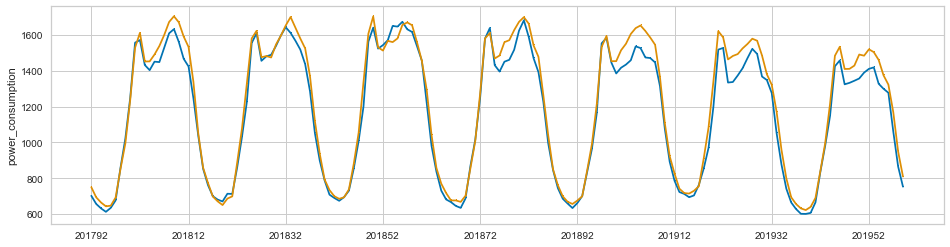

 99%|████████████████████████████████████████████████████████████████████████████▏| 99/100 [12:26:54<11:49, 709.20s/it]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2040 entries, 201960 to 203999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   building_number      2040 non-null   int64  
 1   temperature          2040 non-null   float64
 2   windspeed            2040 non-null   float64
 3   humidity             2040 non-null   float64
 4   power_consumption    2040 non-null   float64
 5   day                  2040 non-null   int64  
 6   month                2040 non-null   int64  
 7   day_of_week          2040 non-null   int64  
 8   cos_time             2040 non-null   float64
 9   sin_time             2040 non-null   float64
 10  holiday              2040 non-null   bool   
 11  month_day_hour_mean  2040 non-null   float64
 12  day_hour_mean        2040 non-null   float64
 13  hour_mean            2040 non-null   float64
 14  hour_std             2040 non-null   float64
 15  discomfort           2040 non-n

,Description,Value
0,Session id,411
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,36.4636,2713.2844,51.3835,0.9718,0.0644,0.0470,3.1980
et,Extra Trees Regressor,37.8134,2993.1232,53.9995,0.9689,0.0687,0.0489,3.2490
gbr,Gradient Boosting Regressor,37.8869,2851.5029,52.7464,0.9704,0.0666,0.0493,3.2170
xgboost,Extreme Gradient Boosting,38.7780,2972.7466,54.1823,0.9691,0.0685,0.0499,3.1860
rf,Random Forest Regressor,39.1287,3062.3112,54.8389,0.9682,0.0701,0.0509,3.3430
lr,Linear Regression,42.7991,3364.0480,57.6063,0.9651,0.0795,0.0585,3.1740
ridge,Ridge Regression,42.7921,3363.0756,57.5988,0.9651,0.0795,0.0585,3.0940
br,Bayesian Ridge,42.8265,3366.3527,57.6411,0.9651,0.0798,0.0586,3.1570
llar,Lasso Least Angle Regression,43.1189,3398.9352,57.9317,0.9647,0.0806,0.0591,3.1040
lasso,Lasso Regression,43.1191,3398.9855,57.9323,0.9647,0.0806,0.0591,3.2280


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,31.2989,1898.5601,43.5725,0.9812,0.0492,0.0374
1,35.7286,2549.8481,50.4960,0.9778,0.0599,0.0452
2,37.4086,3278.5594,57.2587,0.9696,0.0802,0.0512
3,34.5957,2094.0444,45.7607,0.9783,0.0571,0.0434
4,41.5571,5472.9514,73.9794,0.9389,0.0915,0.0551
5,30.3825,1739.8553,41.7116,0.9815,0.0482,0.0379
6,35.9962,2270.7872,47.6528,0.9754,0.0648,0.0487
7,39.8249,3042.1055,55.1553,0.9673,0.0724,0.0522
8,37.7369,2348.2251,48.4585,0.9746,0.0644,0.0501


Transformation Pipeline and Model Successfully Saved


[Building #100]SMAPE : 4.971884920472023


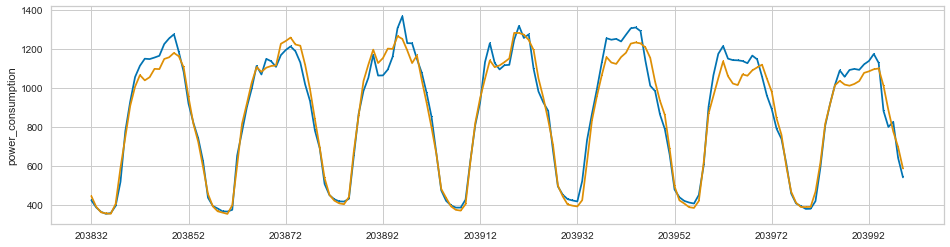

100%|████████████████████████████████████████████████████████████████████████████| 100/100 [12:39:14<00:00, 455.54s/it]


In [34]:
for i in tqdm(range(100)):
    # train 데이터 전처리
    train_2 = train.loc[train.building_number == i+1,]
    train_2 = train_2.drop(columns = 'building_number')
    
    # x, y 분리
    train_y = train_2.power_consumption
    train_x = train_2.drop(columns = 'power_consumption')

    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)

    col =['temperature', 'windspeed', 'humidity',
            'day', 'month', 'day_of_week', 'cos_time',
           'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
           'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
           'CDH', 'sensory_temperature']
    
    X_train_scaled = pd.DataFrame(x_train, columns = col)
    X_train_scaled['power_consumption'] = y_train
    X_train_scaled
    
    # pycaret setup
    exp = setup(X_train_scaled, target = 'power_consumption')
    
    # MAPE를 기준으로 상위 2개의 모델 저장
    models = compare_models(sort='MAPE', n_select=2)
    
    # 상위 2개 모델 blend
    blender = blend_models(estimator_list =models)
    
    building_model_name = "Building_" + str(i+1) + "_model"
    
    # 모델 저장
    save_model(blender, building_model_name)
    
    # 모델 완성
    model_final = finalize_model(blender)
    
    # 예측
    submit_df = predict_model(model_final,data = x_valid)

    y = train_2.power_consumption
    x = train_2.drop(columns = 'power_consumption')

    def smape(true, pred):
        v = 2 * abs(pred - true) / (abs(pred) + abs(true))
        output = np.mean(v) * 100
        return output
    
    print(f"[Building #{i+1}]SMAPE : {smape(y_valid, submit_df.prediction_label)}")

    plot_series(y_valid,submit_df.prediction_label , markers=[',' , ','])
    plt.show()


### 예측

In [7]:
exp1 = setup(train, target = 'power_consumption', ignore_features = 'building_number')

,Description,Value
0,Session id,562
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(204000, 20)"
4,Transformed data shape,"(204000, 19)"
5,Transformed train set shape,"(142800, 19)"
6,Transformed test set shape,"(61200, 19)"
7,Ignore features,15
8,Numeric features,17
9,Preprocess,True


In [10]:
# 테스트 데이터 불러오기
test = pd.read_csv("pre_ver11/pre_test.csv")

ans = list()
for i in tqdm(range(100)):
    # train 데이터 : 건물별
    y_train = train.loc[train.building_number == i+1, 'power_consumption']
    # test 데이터 : 건물별
    test_3 = test.loc[test.building_number == i+1, ]
    test_3 = test.drop(columns = "building_number")

    col =['temperature', 'windspeed', 'humidity',
            'day', 'month', 'day_of_week', 'cos_time',
           'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
           'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
           'CDH', 'sensory_temperature']
    
    building_model_name = "building model/Building_" + str(i+1) + "_model"
    
    # 모델 불러오기
    model = load_model(building_model_name)
    
    model_final = finalize_model(model)
    
    # 예측
    submit_df = predict_model(model_final,data = test_3)
    
    # 예측값 저장
    ans.append(list(submit_df.prediction_label))
    
    # 예측 plot 
#     plot_series(y_train, y_valid, markers=[',' , ','])
#     plt.show()
    
print(f"Test shape : {test.shape}")
print(f"Answer shape : {len(ans)}")

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Transformation Pipeline and Model Successfully Loaded


  1%|▊                                                                                 | 1/100 [00:19<31:40, 19.20s/it]

Transformation Pipeline and Model Successfully Loaded


  2%|█▋                                                                                | 2/100 [00:36<30:00, 18.37s/it]

Transformation Pipeline and Model Successfully Loaded


  3%|██▍                                                                               | 3/100 [01:14<43:53, 27.15s/it]

Transformation Pipeline and Model Successfully Loaded


  4%|███▎                                                                              | 4/100 [01:50<49:00, 30.63s/it]

Transformation Pipeline and Model Successfully Loaded


  5%|████                                                                              | 5/100 [02:41<59:54, 37.83s/it]

Transformation Pipeline and Model Successfully Loaded


  6%|████▉                                                                             | 6/100 [03:17<58:24, 37.28s/it]

Transformation Pipeline and Model Successfully Loaded


  7%|█████▌                                                                          | 7/100 [04:01<1:01:27, 39.65s/it]

Transformation Pipeline and Model Successfully Loaded


  8%|██████▍                                                                         | 8/100 [04:57<1:08:37, 44.75s/it]

Transformation Pipeline and Model Successfully Loaded


  9%|███████▏                                                                        | 9/100 [05:52<1:12:34, 47.86s/it]

Transformation Pipeline and Model Successfully Loaded


 10%|███████▉                                                                       | 10/100 [06:40<1:11:46, 47.85s/it]

Transformation Pipeline and Model Successfully Loaded


 11%|████████▋                                                                      | 11/100 [07:15<1:05:09, 43.93s/it]

Transformation Pipeline and Model Successfully Loaded


 12%|█████████▍                                                                     | 12/100 [07:58<1:04:10, 43.76s/it]

Transformation Pipeline and Model Successfully Loaded


 13%|██████████▌                                                                      | 13/100 [08:32<59:04, 40.74s/it]

Transformation Pipeline and Model Successfully Loaded


 14%|███████████▎                                                                     | 14/100 [08:48<47:45, 33.32s/it]

Transformation Pipeline and Model Successfully Loaded


 15%|████████████▏                                                                    | 15/100 [09:22<47:20, 33.42s/it]

Transformation Pipeline and Model Successfully Loaded


 16%|████████████▉                                                                    | 16/100 [10:07<51:45, 36.97s/it]

Transformation Pipeline and Model Successfully Loaded


 17%|█████████████▊                                                                   | 17/100 [10:58<57:00, 41.21s/it]

Transformation Pipeline and Model Successfully Loaded


 18%|██████████████▌                                                                  | 18/100 [11:48<59:53, 43.82s/it]

Transformation Pipeline and Model Successfully Loaded


 19%|███████████████                                                                | 19/100 [13:48<1:29:56, 66.62s/it]

Transformation Pipeline and Model Successfully Loaded


 20%|███████████████▊                                                               | 20/100 [15:55<1:53:21, 85.02s/it]

Transformation Pipeline and Model Successfully Loaded


 21%|████████████████▌                                                              | 21/100 [16:51<1:40:12, 76.10s/it]

Transformation Pipeline and Model Successfully Loaded


 22%|█████████████████▍                                                             | 22/100 [17:36<1:26:59, 66.91s/it]

Transformation Pipeline and Model Successfully Loaded


 23%|██████████████████▏                                                            | 23/100 [19:33<1:44:55, 81.76s/it]

Transformation Pipeline and Model Successfully Loaded


 24%|██████████████████▉                                                            | 24/100 [20:27<1:33:05, 73.49s/it]

Transformation Pipeline and Model Successfully Loaded


 25%|███████████████████▊                                                           | 25/100 [21:14<1:21:49, 65.46s/it]

Transformation Pipeline and Model Successfully Loaded


 26%|████████████████████▌                                                          | 26/100 [22:00<1:13:45, 59.81s/it]

Transformation Pipeline and Model Successfully Loaded


 27%|█████████████████████▎                                                         | 27/100 [22:44<1:06:52, 54.97s/it]

Transformation Pipeline and Model Successfully Loaded


 28%|██████████████████████▋                                                          | 28/100 [23:01<52:13, 43.52s/it]

Transformation Pipeline and Model Successfully Loaded


 29%|███████████████████████▍                                                         | 29/100 [23:45<51:55, 43.88s/it]

Transformation Pipeline and Model Successfully Loaded


 30%|████████████████████████▎                                                        | 30/100 [24:30<51:37, 44.25s/it]

Transformation Pipeline and Model Successfully Loaded


 31%|█████████████████████████                                                        | 31/100 [24:47<41:24, 36.01s/it]

Transformation Pipeline and Model Successfully Loaded


 32%|█████████████████████████▉                                                       | 32/100 [25:31<43:25, 38.32s/it]

Transformation Pipeline and Model Successfully Loaded


 33%|██████████████████████████▋                                                      | 33/100 [26:16<44:55, 40.22s/it]

Transformation Pipeline and Model Successfully Loaded


 34%|███████████████████████████▌                                                     | 34/100 [27:00<45:32, 41.39s/it]

Transformation Pipeline and Model Successfully Loaded


 35%|████████████████████████████▎                                                    | 35/100 [27:43<45:31, 42.02s/it]

Transformation Pipeline and Model Successfully Loaded


 36%|█████████████████████████████▏                                                   | 36/100 [28:00<36:37, 34.34s/it]

Transformation Pipeline and Model Successfully Loaded


 37%|█████████████████████████████▉                                                   | 37/100 [28:43<38:52, 37.03s/it]

Transformation Pipeline and Model Successfully Loaded


 38%|██████████████████████████████▊                                                  | 38/100 [29:31<41:42, 40.36s/it]

Transformation Pipeline and Model Successfully Loaded


 39%|███████████████████████████████▌                                                 | 39/100 [30:17<42:44, 42.04s/it]

Transformation Pipeline and Model Successfully Loaded


 40%|████████████████████████████████▍                                                | 40/100 [31:02<42:54, 42.91s/it]

Transformation Pipeline and Model Successfully Loaded


 41%|█████████████████████████████████▏                                               | 41/100 [31:19<34:32, 35.13s/it]

Transformation Pipeline and Model Successfully Loaded


 42%|██████████████████████████████████                                               | 42/100 [32:02<36:16, 37.52s/it]

Transformation Pipeline and Model Successfully Loaded


 43%|██████████████████████████████████▊                                              | 43/100 [32:46<37:22, 39.34s/it]

Transformation Pipeline and Model Successfully Loaded


 44%|███████████████████████████████████▋                                             | 44/100 [33:31<38:29, 41.25s/it]

Transformation Pipeline and Model Successfully Loaded


 45%|████████████████████████████████████▍                                            | 45/100 [34:15<38:36, 42.11s/it]

Transformation Pipeline and Model Successfully Loaded


 46%|█████████████████████████████████████▎                                           | 46/100 [35:02<39:05, 43.43s/it]

Transformation Pipeline and Model Successfully Loaded


 47%|██████████████████████████████████████                                           | 47/100 [35:48<38:55, 44.08s/it]

Transformation Pipeline and Model Successfully Loaded


 48%|██████████████████████████████████████▉                                          | 48/100 [36:32<38:11, 44.07s/it]

Transformation Pipeline and Model Successfully Loaded


 49%|███████████████████████████████████████▋                                         | 49/100 [37:16<37:36, 44.25s/it]

Transformation Pipeline and Model Successfully Loaded


 50%|████████████████████████████████████████▌                                        | 50/100 [38:00<36:37, 43.96s/it]

Transformation Pipeline and Model Successfully Loaded


 51%|█████████████████████████████████████████▎                                       | 51/100 [38:44<35:56, 44.00s/it]

Transformation Pipeline and Model Successfully Loaded


 52%|██████████████████████████████████████████                                       | 52/100 [39:27<35:03, 43.82s/it]

Transformation Pipeline and Model Successfully Loaded


 53%|██████████████████████████████████████████▉                                      | 53/100 [40:12<34:42, 44.30s/it]

Transformation Pipeline and Model Successfully Loaded


 54%|███████████████████████████████████████████▋                                     | 54/100 [42:04<49:20, 64.37s/it]

Transformation Pipeline and Model Successfully Loaded


 55%|████████████████████████████████████████████▌                                    | 55/100 [43:56<58:59, 78.66s/it]

Transformation Pipeline and Model Successfully Loaded


 56%|█████████████████████████████████████████████▎                                   | 56/100 [44:49<52:04, 71.01s/it]

Transformation Pipeline and Model Successfully Loaded


 57%|██████████████████████████████████████████████▏                                  | 57/100 [45:06<39:18, 54.85s/it]

Transformation Pipeline and Model Successfully Loaded


 58%|██████████████████████████████████████████████▉                                  | 58/100 [45:49<35:59, 51.41s/it]

Transformation Pipeline and Model Successfully Loaded


 59%|███████████████████████████████████████████████▊                                 | 59/100 [46:35<33:59, 49.74s/it]

Transformation Pipeline and Model Successfully Loaded


 60%|████████████████████████████████████████████████▌                                | 60/100 [47:21<32:16, 48.42s/it]

Transformation Pipeline and Model Successfully Loaded


 61%|█████████████████████████████████████████████████▍                               | 61/100 [48:04<30:35, 47.05s/it]

Transformation Pipeline and Model Successfully Loaded


 62%|██████████████████████████████████████████████████▏                              | 62/100 [48:48<29:04, 45.90s/it]

Transformation Pipeline and Model Successfully Loaded


 63%|███████████████████████████████████████████████████                              | 63/100 [49:31<27:54, 45.26s/it]

Transformation Pipeline and Model Successfully Loaded


 64%|███████████████████████████████████████████████████▊                             | 64/100 [50:15<26:56, 44.89s/it]

Transformation Pipeline and Model Successfully Loaded


 65%|████████████████████████████████████████████████████▋                            | 65/100 [51:00<26:07, 44.78s/it]

Transformation Pipeline and Model Successfully Loaded


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [51:44<25:11, 44.45s/it]

Transformation Pipeline and Model Successfully Loaded


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [52:28<24:22, 44.31s/it]

Transformation Pipeline and Model Successfully Loaded


 68%|███████████████████████████████████████████████████████                          | 68/100 [53:12<23:35, 44.25s/it]

Transformation Pipeline and Model Successfully Loaded


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [53:58<23:07, 44.76s/it]

Transformation Pipeline and Model Successfully Loaded


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [54:44<22:38, 45.29s/it]

Transformation Pipeline and Model Successfully Loaded


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [55:30<21:59, 45.49s/it]

Transformation Pipeline and Model Successfully Loaded


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [56:16<21:15, 45.54s/it]

Transformation Pipeline and Model Successfully Loaded


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [57:00<20:21, 45.23s/it]

Transformation Pipeline and Model Successfully Loaded


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [58:58<29:02, 67.02s/it]

Transformation Pipeline and Model Successfully Loaded


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [59:50<25:58, 62.33s/it]

Transformation Pipeline and Model Successfully Loaded


 76%|████████████████████████████████████████████████████████████                   | 76/100 [1:00:33<22:39, 56.63s/it]

Transformation Pipeline and Model Successfully Loaded


 77%|████████████████████████████████████████████████████████████▊                  | 77/100 [1:01:19<20:29, 53.46s/it]

Transformation Pipeline and Model Successfully Loaded


 78%|█████████████████████████████████████████████████████████████▌                 | 78/100 [1:02:04<18:43, 51.06s/it]

Transformation Pipeline and Model Successfully Loaded


 79%|██████████████████████████████████████████████████████████████▍                | 79/100 [1:02:52<17:31, 50.07s/it]

Transformation Pipeline and Model Successfully Loaded


 80%|███████████████████████████████████████████████████████████████▏               | 80/100 [1:03:38<16:17, 48.86s/it]

Transformation Pipeline and Model Successfully Loaded


 81%|███████████████████████████████████████████████████████████████▉               | 81/100 [1:05:28<21:14, 67.06s/it]

Transformation Pipeline and Model Successfully Loaded


 82%|████████████████████████████████████████████████████████████████▊              | 82/100 [1:05:45<15:36, 52.05s/it]

Transformation Pipeline and Model Successfully Loaded


 83%|█████████████████████████████████████████████████████████████████▌             | 83/100 [1:06:31<14:17, 50.45s/it]

Transformation Pipeline and Model Successfully Loaded


 84%|██████████████████████████████████████████████████████████████████▎            | 84/100 [1:07:19<13:13, 49.57s/it]

Transformation Pipeline and Model Successfully Loaded


 85%|███████████████████████████████████████████████████████████████████▏           | 85/100 [1:08:03<11:57, 47.81s/it]

Transformation Pipeline and Model Successfully Loaded


 86%|███████████████████████████████████████████████████████████████████▉           | 86/100 [1:08:19<08:58, 38.45s/it]

Transformation Pipeline and Model Successfully Loaded


 87%|████████████████████████████████████████████████████████████████████▋          | 87/100 [1:09:03<08:38, 39.88s/it]

Transformation Pipeline and Model Successfully Loaded


 88%|█████████████████████████████████████████████████████████████████████▌         | 88/100 [1:09:50<08:24, 42.08s/it]

Transformation Pipeline and Model Successfully Loaded


 89%|██████████████████████████████████████████████████████████████████████▎        | 89/100 [1:10:06<06:18, 34.37s/it]

Transformation Pipeline and Model Successfully Loaded


 90%|███████████████████████████████████████████████████████████████████████        | 90/100 [1:10:50<06:12, 37.28s/it]

Transformation Pipeline and Model Successfully Loaded


 91%|███████████████████████████████████████████████████████████████████████▉       | 91/100 [1:11:36<05:57, 39.72s/it]

Transformation Pipeline and Model Successfully Loaded


 92%|████████████████████████████████████████████████████████████████████████▋      | 92/100 [1:11:52<04:21, 32.74s/it]

Transformation Pipeline and Model Successfully Loaded


 93%|█████████████████████████████████████████████████████████████████████████▍     | 93/100 [1:12:35<04:10, 35.77s/it]

Transformation Pipeline and Model Successfully Loaded


 94%|██████████████████████████████████████████████████████████████████████████▎    | 94/100 [1:13:19<03:50, 38.34s/it]

Transformation Pipeline and Model Successfully Loaded


 95%|███████████████████████████████████████████████████████████████████████████    | 95/100 [1:13:35<02:38, 31.64s/it]

Transformation Pipeline and Model Successfully Loaded


 96%|███████████████████████████████████████████████████████████████████████████▊   | 96/100 [1:14:18<02:19, 34.99s/it]

Transformation Pipeline and Model Successfully Loaded


 97%|████████████████████████████████████████████████████████████████████████████▋  | 97/100 [1:15:02<01:53, 37.69s/it]

Transformation Pipeline and Model Successfully Loaded


 98%|█████████████████████████████████████████████████████████████████████████████▍ | 98/100 [1:15:45<01:18, 39.26s/it]

Transformation Pipeline and Model Successfully Loaded


 99%|██████████████████████████████████████████████████████████████████████████████▏| 99/100 [1:16:29<00:40, 40.77s/it]

Transformation Pipeline and Model Successfully Loaded


100%|██████████████████████████████████████████████████████████████████████████████| 100/100 [1:17:13<00:00, 46.34s/it]

Test shape : (16800, 20)
Answer shape : 100


In [24]:
submission = pd.read_csv("origin_data/sample_submission.csv")
submission['answer'] = ans[0]

In [25]:
submission

,num_date_time,answer
0,1_20220825 00,1825.753521
1,1_20220825 01,1772.760885
2,1_20220825 02,1630.821555
3,1_20220825 03,1557.127697
4,1_20220825 04,1571.772321
...,...,...
16795,100_20220831 19,1012.594772
16796,100_20220831 20,943.412091
16797,100_20220831 21,816.959856
16798,100_20220831 22,737.212987


In [26]:
submission.to_csv("submission_pycaret_01.csv")

## 건물별 모델링 테스트_2
---
* 성능 기준 SMAPE로 커스터마이징 
* 알고리즘 범위 제한(et, xgboost, lightgbm)

### 학습

In [6]:
# custom metrics
def custom_metrics(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    output = np.mean(v) * 100
    return output

In [ ]:
for i in tqdm(range(100)):
    
    train_4 = train.loc[train.building_number == i+1,]
    train_4 = train_4.drop(columns = 'building_number')

    train_y = train_4.power_consumption
    train_x = train_4.drop(columns = 'power_consumption')
    
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)
    
    col =['temperature', 'windspeed', 'humidity',
            'day', 'month', 'day_of_week', 'cos_time',
           'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
           'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
           'CDH', 'sensory_temperature']
    
    X_train_scaled = pd.DataFrame(train_x, columns = col)
    X_train_scaled['power_consumption'] = train_y
    X_train_scaled

    exp = setup(X_train_scaled, target = 'power_consumption')
    exp.add_metric('smape', 'SMAPE', custom_metrics, greater_is_better = False)
    model = compare_models(sort = 'smape', include = ['et', 'lightgbm', 'xgboost', 'rf', 'huber'])
    
    building_model_name = "Building_" + str(i+1) + "_model"
    
    save_model(model, building_model_name)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

,Description,Value
0,Session id,6372
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,110.2143,23980.1635,153.5163,0.9801,0.0630,0.0457,4.5389,3.9900
et,Extra Trees Regressor,111.8686,26570.7721,161.2491,0.9779,0.0659,0.0464,4.5966,4.8690
xgboost,Extreme Gradient Boosting,112.9651,25575.3806,158.2562,0.9788,0.0637,0.0462,4.5979,4.2420


Transformation Pipeline and Model Successfully Saved


  1%|▊                                                                              | 1/100 [02:47<4:35:54, 167.22s/it]

,Description,Value
0,Session id,8229
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,96.0262,20968.4664,144.4400,0.9435,0.0969,0.0626,6.0648,4.3520
lightgbm,Light Gradient Boosting Machine,100.3679,20202.9691,141.8700,0.9456,0.0961,0.0657,6.4344,4.1840
xgboost,Extreme Gradient Boosting,103.8590,22135.7252,148.4532,0.9406,0.1026,0.0681,6.6552,4.2570


Transformation Pipeline and Model Successfully Saved


  2%|█▌                                                                             | 2/100 [05:27<4:26:49, 163.36s/it]

,Description,Value
0,Session id,8322
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,116.2135,36393.5737,189.0521,0.9056,0.1123,0.0783,7.5884,4.1930
xgboost,Extreme Gradient Boosting,121.3858,41310.8750,199.5129,0.8934,0.1183,0.0810,7.9516,4.1940
et,Extra Trees Regressor,130.3732,46600.7110,213.8534,0.8791,0.1290,0.0893,8.4813,4.4640


Transformation Pipeline and Model Successfully Saved


  3%|██▎                                                                            | 3/100 [08:09<4:22:54, 162.63s/it]

,Description,Value
0,Session id,8482
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,33.9807,1915.0158,43.6897,0.9768,0.0460,0.0356,3.5369,3.9690
xgboost,Extreme Gradient Boosting,34.4353,1983.5466,44.4304,0.9760,0.0475,0.0361,3.5960,4.2060
et,Extra Trees Regressor,35.7706,2255.5017,47.3290,0.9727,0.0511,0.0377,3.7470,4.3890


Transformation Pipeline and Model Successfully Saved


  4%|███▏                                                                           | 4/100 [10:48<4:17:54, 161.19s/it]

,Description,Value
0,Session id,331
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,117.5175,54169.5826,228.4041,0.9813,0.0784,0.0435,4.2326,4.4690
xgboost,Extreme Gradient Boosting,123.9317,57642.8283,234.1512,0.9800,0.0795,0.0462,4.4913,4.2580
lightgbm,Light Gradient Boosting Machine,130.4501,58232.3460,234.6941,0.9799,0.0825,0.0498,4.8207,4.1520


Transformation Pipeline and Model Successfully Saved


  5%|███▉                                                                           | 5/100 [13:30<4:15:48, 161.56s/it]

,Description,Value
0,Session id,4690
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,57.0268,7302.1784,85.3264,0.9875,0.0416,0.0297,2.9536,4.0940
xgboost,Extreme Gradient Boosting,59.2223,8004.7339,88.8383,0.9863,0.0436,0.0309,3.0817,4.2490
et,Extra Trees Regressor,60.9823,9387.2942,96.5387,0.9840,0.0488,0.0325,3.2213,4.4540


Transformation Pipeline and Model Successfully Saved


  6%|████▋                                                                          | 6/100 [16:12<4:12:55, 161.44s/it]

,Description,Value
0,Session id,2941
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,40.5250,3956.2170,61.7925,0.9531,0.0839,0.0555,5.4684,4.4240
xgboost,Extreme Gradient Boosting,41.3892,3788.9849,60.6068,0.9546,0.0826,0.0567,5.6002,4.1470
lightgbm,Light Gradient Boosting Machine,42.0926,3695.5431,59.9796,0.9559,0.0814,0.0583,5.7456,4.1960


Transformation Pipeline and Model Successfully Saved


  7%|█████▌                                                                         | 7/100 [18:52<4:09:57, 161.27s/it]

,Description,Value
0,Session id,2550
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,51.3866,4948.4745,69.8021,0.8355,0.0536,0.0395,3.9190,4.2990
xgboost,Extreme Gradient Boosting,51.7376,4892.0713,69.6620,0.8379,0.0534,0.0396,3.9403,4.2280
et,Extra Trees Regressor,52.0553,5284.1067,72.2938,0.8240,0.0552,0.0399,3.9579,4.5020


Transformation Pipeline and Model Successfully Saved


  8%|██████▎                                                                        | 8/100 [21:36<4:08:37, 162.14s/it]

,Description,Value
0,Session id,5981
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,62.0214,8210.6708,90.2287,0.9888,0.0384,0.0274,2.7374,4.1720
et,Extra Trees Regressor,61.7688,8782.8128,92.9649,0.9880,0.0404,0.0278,2.7632,4.5060
xgboost,Extreme Gradient Boosting,66.4452,9470.1144,96.9770,0.9872,0.0417,0.0295,2.9484,4.2710


Transformation Pipeline and Model Successfully Saved


  9%|███████                                                                        | 9/100 [24:19<4:06:14, 162.35s/it]

,Description,Value
0,Session id,6961
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,118.1142,23213.9600,152.0105,0.9290,0.0392,0.0299,2.9850,4.3510
et,Extra Trees Regressor,122.6245,27039.2412,163.9881,0.9176,0.0429,0.0313,3.1148,4.3830
xgboost,Extreme Gradient Boosting,129.0512,27755.7596,166.0263,0.9153,0.0435,0.0329,3.2797,4.4570


Transformation Pipeline and Model Successfully Saved


 10%|███████▊                                                                      | 10/100 [27:05<4:05:15, 163.51s/it]

,Description,Value
0,Session id,7242
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,48.9162,5572.8494,73.2575,0.9424,0.0399,0.0258,2.5351,4.2730
xgboost,Extreme Gradient Boosting,51.7135,6174.0054,76.9428,0.9360,0.0418,0.0272,2.6869,4.1640
et,Extra Trees Regressor,53.2328,7275.2230,82.9978,0.9247,0.0454,0.0282,2.7735,4.5950


Transformation Pipeline and Model Successfully Saved


 11%|████████▌                                                                     | 11/100 [29:50<4:03:14, 163.98s/it]

,Description,Value
0,Session id,3038
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,41.3281,3179.1292,56.2437,0.9575,0.0387,0.0285,2.8415,4.0910
et,Extra Trees Regressor,42.4974,3455.9275,58.5689,0.9535,0.0406,0.0295,2.9283,4.6010
xgboost,Extreme Gradient Boosting,42.5249,3408.3851,58.2094,0.9544,0.0405,0.0296,2.9483,4.2380


Transformation Pipeline and Model Successfully Saved


 12%|█████████▎                                                                    | 12/100 [32:34<4:00:14, 163.81s/it]

,Description,Value
0,Session id,7043
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,104.0807,17412.0528,131.5583,0.8400,0.0544,0.0424,4.2143,4.1070
xgboost,Extreme Gradient Boosting,106.5922,18732.2868,136.5543,0.8284,0.0563,0.0434,4.3144,4.3760
et,Extra Trees Regressor,110.5108,21090.7730,144.8673,0.8061,0.0599,0.0451,4.4720,4.5720


Transformation Pipeline and Model Successfully Saved


 13%|██████████▏                                                                   | 13/100 [35:18<3:57:46, 163.98s/it]

,Description,Value
0,Session id,8040
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,196.3202,61620.0955,247.9532,0.6735,0.1411,0.1120,10.8524,4.2540
xgboost,Extreme Gradient Boosting,197.8590,63686.2906,252.0472,0.6621,0.1449,0.1133,11.0051,4.3580
et,Extra Trees Regressor,215.5825,75249.2816,274.1177,0.5995,0.1579,0.1244,11.9731,4.5440


Transformation Pipeline and Model Successfully Saved


 14%|██████████▉                                                                   | 14/100 [38:03<3:55:28, 164.28s/it]

,Description,Value
0,Session id,539
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,39.0000,3041.0413,54.8691,0.9483,0.0327,0.0227,2.2585,4.2900
et,Extra Trees Regressor,39.2562,3418.0000,58.0316,0.9420,0.0347,0.0229,2.2757,4.5360
xgboost,Extreme Gradient Boosting,40.6073,3279.1650,57.0100,0.9440,0.0339,0.0236,2.3439,4.3440


Transformation Pipeline and Model Successfully Saved


 15%|███████████▋                                                                  | 15/100 [40:48<3:53:05, 164.54s/it]

,Description,Value
0,Session id,8785
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,94.9695,23654.8973,152.3414,0.9884,0.0492,0.0316,3.1379,4.4980
lightgbm,Light Gradient Boosting Machine,103.0606,24750.8461,156.0056,0.9878,0.0509,0.0347,3.4456,4.3020
xgboost,Extreme Gradient Boosting,114.2549,29010.1283,169.2030,0.9858,0.0551,0.0381,3.7861,4.3580


Transformation Pipeline and Model Successfully Saved


 16%|████████████▍                                                                 | 16/100 [43:34<3:50:42, 164.79s/it]

,Description,Value
0,Session id,6970
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,34.0573,3403.3333,57.7541,0.9821,0.0649,0.0378,3.6563,4.5540
xgboost,Extreme Gradient Boosting,38.8855,4050.1830,63.2796,0.9788,0.0698,0.0429,4.1744,4.3260
lightgbm,Light Gradient Boosting Machine,41.1063,4324.9985,65.2567,0.9774,0.0732,0.0462,4.4917,4.3010


Transformation Pipeline and Model Successfully Saved


 17%|█████████████▎                                                                | 17/100 [46:19<3:48:16, 165.02s/it]

,Description,Value
0,Session id,8335
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,49.2600,6467.0546,80.0541,0.9786,0.0563,0.0342,3.3837,4.5790
lightgbm,Light Gradient Boosting Machine,54.0046,7193.1673,84.3136,0.9761,0.0575,0.0376,3.7331,4.3180
xgboost,Extreme Gradient Boosting,54.2867,7113.5414,84.2007,0.9764,0.0580,0.0376,3.7457,4.4250


Transformation Pipeline and Model Successfully Saved


 18%|██████████████                                                                | 18/100 [49:07<3:46:26, 165.69s/it]

,Description,Value
0,Session id,6710
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,44.9241,5950.7092,75.5952,0.9877,0.0580,0.0340,3.3370,4.5780
xgboost,Extreme Gradient Boosting,49.5519,6441.5338,79.2575,0.9867,0.0589,0.0368,3.6061,4.3390
lightgbm,Light Gradient Boosting Machine,51.1353,7304.7115,83.5707,0.9850,0.0611,0.0388,3.7856,4.2570


Transformation Pipeline and Model Successfully Saved


 19%|██████████████▊                                                               | 19/100 [51:53<3:43:51, 165.83s/it]

,Description,Value
0,Session id,2965
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,57.8941,12439.5232,109.5324,0.9869,0.0678,0.0358,3.4738,4.5570
xgboost,Extreme Gradient Boosting,67.4632,16305.4664,124.9743,0.9830,0.0718,0.0398,3.9143,4.4070
lightgbm,Light Gradient Boosting Machine,78.6539,23295.2087,150.1886,0.9756,0.0933,0.0500,4.6934,4.2820


Transformation Pipeline and Model Successfully Saved


 20%|███████████████▌                                                              | 20/100 [54:40<3:41:34, 166.18s/it]

,Description,Value
0,Session id,6003
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,69.0547,14475.7629,118.7705,0.9750,0.0643,0.0370,3.6217,4.5300
xgboost,Extreme Gradient Boosting,81.7856,17716.5509,131.7691,0.9695,0.0701,0.0434,4.3034,4.3190
lightgbm,Light Gradient Boosting Machine,84.2010,18430.0592,133.9188,0.9680,0.0698,0.0447,4.4054,4.3030


Transformation Pipeline and Model Successfully Saved


 21%|████████████████▍                                                             | 21/100 [57:26<3:38:41, 166.09s/it]

,Description,Value
0,Session id,7236
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,36.0046,2956.3911,54.0357,0.9696,0.0438,0.0295,2.9462,4.3300
xgboost,Extreme Gradient Boosting,37.4134,3105.3890,55.1526,0.9681,0.0447,0.0306,3.0554,4.3890
et,Extra Trees Regressor,38.0732,3482.4389,58.5336,0.9641,0.0479,0.0311,3.1059,4.5980


Transformation Pipeline and Model Successfully Saved


 22%|████████████████▋                                                           | 22/100 [1:00:13<3:36:27, 166.50s/it]

,Description,Value
0,Session id,2224
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,17.0132,850.9080,28.9121,0.9882,0.0211,0.0127,1.2632,4.6180
xgboost,Extreme Gradient Boosting,20.7168,1216.8866,34.5388,0.9830,0.0250,0.0153,1.5356,4.3960
lightgbm,Light Gradient Boosting Machine,21.3283,1413.5693,37.1049,0.9803,0.0271,0.0159,1.5860,4.3280


Transformation Pipeline and Model Successfully Saved


 23%|█████████████████▍                                                          | 23/100 [1:03:01<3:34:12, 166.92s/it]

,Description,Value
0,Session id,4535
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,204.9108,96482.6259,307.2022,0.9885,0.0324,0.0211,2.0829,4.6280
xgboost,Extreme Gradient Boosting,217.0897,102518.4023,317.8540,0.9877,0.0324,0.0220,2.1933,4.2730
lightgbm,Light Gradient Boosting Machine,227.9069,151888.0841,380.8219,0.9820,0.0367,0.0227,2.2434,4.3860


Transformation Pipeline and Model Successfully Saved


 24%|██████████████████▏                                                         | 24/100 [1:05:48<3:31:40, 167.11s/it]

,Description,Value
0,Session id,7112
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,149.3139,61331.7681,244.4070,0.9889,0.0335,0.0203,2.0043,4.6180
xgboost,Extreme Gradient Boosting,157.6142,75849.7191,269.3785,0.9863,0.0368,0.0215,2.1068,4.3830
lightgbm,Light Gradient Boosting Machine,171.7995,83982.7658,287.4452,0.9850,0.0387,0.0232,2.2809,4.2490


Transformation Pipeline and Model Successfully Saved


 25%|███████████████████                                                         | 25/100 [1:08:36<3:28:52, 167.10s/it]

,Description,Value
0,Session id,2857
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,79.6961,16205.1737,123.9111,0.9827,0.0363,0.0232,2.2794,4.5570
xgboost,Extreme Gradient Boosting,83.1846,19805.5233,135.2322,0.9793,0.0379,0.0236,2.3238,4.3780
lightgbm,Light Gradient Boosting Machine,86.7787,21419.4874,143.3700,0.9768,0.0392,0.0245,2.4069,4.3960


Transformation Pipeline and Model Successfully Saved


 26%|███████████████████▊                                                        | 26/100 [1:11:23<3:26:13, 167.20s/it]

,Description,Value
0,Session id,6065
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,216.3315,118392.4235,336.7324,0.9896,0.0200,0.0126,1.2543,4.6470
lightgbm,Light Gradient Boosting Machine,256.9535,180215.4115,419.2158,0.9840,0.0236,0.0146,1.4531,4.3730
xgboost,Extreme Gradient Boosting,254.9302,155469.6000,389.9702,0.9864,0.0223,0.0147,1.4645,4.4780


Transformation Pipeline and Model Successfully Saved


 27%|████████████████████▌                                                       | 27/100 [1:14:13<3:24:17, 167.92s/it]

,Description,Value
0,Session id,7178
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,63.4987,10392.3573,100.6763,0.9740,0.0517,0.0353,3.5064,4.4790
lightgbm,Light Gradient Boosting Machine,67.5067,13317.8400,113.4303,0.9666,0.0574,0.0373,3.6697,4.4290
et,Extra Trees Regressor,73.0877,15176.5338,120.8742,0.9620,0.0613,0.0406,4.0215,4.5610


Transformation Pipeline and Model Successfully Saved


 28%|█████████████████████▎                                                      | 28/100 [1:17:02<3:22:04, 168.39s/it]

,Description,Value
0,Session id,7797
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,43.3820,4636.9069,66.3147,0.9706,0.0447,0.0301,2.9705,4.4400
xgboost,Extreme Gradient Boosting,43.1424,3833.8833,61.4117,0.9762,0.0422,0.0298,2.9719,4.4640
et,Extra Trees Regressor,43.1005,3510.9893,58.9796,0.9779,0.0422,0.0306,3.0291,4.6510


Transformation Pipeline and Model Successfully Saved


 29%|██████████████████████                                                      | 29/100 [1:19:52<3:19:56, 168.96s/it]

,Description,Value
0,Session id,8240
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,47.1500,6101.7854,77.3385,0.8926,0.1136,0.0653,5.9687,4.3750
et,Extra Trees Regressor,48.2507,5722.3905,75.0498,0.8994,0.1052,0.0647,6.0597,4.6180
lightgbm,Light Gradient Boosting Machine,49.0769,6118.3024,77.6741,0.8924,0.1079,0.0656,6.1171,4.3380


Transformation Pipeline and Model Successfully Saved


 30%|██████████████████████▊                                                     | 30/100 [1:22:41<3:17:02, 168.90s/it]

,Description,Value
0,Session id,3881
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
xgboost,Extreme Gradient Boosting,43.1807,4093.5128,63.6650,0.9758,0.0455,0.0312,3.0914,4.3850
et,Extra Trees Regressor,43.8853,4385.2150,65.6699,0.9740,0.0486,0.0324,3.1906,4.7320
lightgbm,Light Gradient Boosting Machine,45.0064,4886.5020,69.3104,0.9712,0.0490,0.0325,3.2015,4.4680


Transformation Pipeline and Model Successfully Saved


 31%|███████████████████████▌                                                    | 31/100 [1:25:33<3:15:20, 169.86s/it]

,Description,Value
0,Session id,1186
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,24.6221,1103.2313,33.1861,0.9785,0.0034,0.0025,0.2504,4.6590
lightgbm,Light Gradient Boosting Machine,26.4183,1299.9555,35.9415,0.9747,0.0037,0.0027,0.2692,4.4200
xgboost,Extreme Gradient Boosting,29.0212,1534.8577,38.9572,0.9707,0.0040,0.0030,0.2958,4.4140


Transformation Pipeline and Model Successfully Saved


 32%|████████████████████████▎                                                   | 32/100 [1:28:24<3:12:49, 170.14s/it]

,Description,Value
0,Session id,8544
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,21.1025,862.9585,29.2607,0.9764,0.0034,0.0024,0.2421,4.6080
lightgbm,Light Gradient Boosting Machine,21.8125,929.4608,30.2392,0.9747,0.0035,0.0025,0.2505,4.4080
xgboost,Extreme Gradient Boosting,23.7421,1020.1923,31.8235,0.9721,0.0037,0.0027,0.2728,4.4810


Transformation Pipeline and Model Successfully Saved


 33%|█████████████████████████                                                   | 33/100 [1:31:14<3:09:54, 170.07s/it]

,Description,Value
0,Session id,5164
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,15.6826,932.1129,26.2605,0.9453,0.0080,0.0047,0.4682,4.6490
lightgbm,Light Gradient Boosting Machine,16.1969,949.3658,26.4876,0.9444,0.0081,0.0049,0.4834,4.3940
xgboost,Extreme Gradient Boosting,17.5163,1072.2898,29.1270,0.9371,0.0089,0.0053,0.5233,4.4300


Transformation Pipeline and Model Successfully Saved


 34%|█████████████████████████▊                                                  | 34/100 [1:34:04<3:07:01, 170.02s/it]

,Description,Value
0,Session id,3599
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,6.3718,81.1822,8.9297,0.9640,0.0041,0.0029,0.2937,4.6120
lightgbm,Light Gradient Boosting Machine,6.4649,82.6499,8.9945,0.9632,0.0041,0.0030,0.2980,4.2380
xgboost,Extreme Gradient Boosting,7.0619,90.9588,9.4500,0.9595,0.0044,0.0033,0.3253,4.5100


Transformation Pipeline and Model Successfully Saved


 35%|██████████████████████████▌                                                 | 35/100 [1:36:53<3:03:52, 169.73s/it]

,Description,Value
0,Session id,5797
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,11.3220,221.6841,14.8653,0.9302,0.0051,0.0039,0.3901,4.3720
xgboost,Extreme Gradient Boosting,11.6147,224.3610,14.9590,0.9292,0.0051,0.0040,0.4004,4.5090
et,Extra Trees Regressor,12.0747,244.3443,15.6019,0.9233,0.0054,0.0042,0.4164,4.6610


Transformation Pipeline and Model Successfully Saved


 36%|███████████████████████████▎                                                | 36/100 [1:39:44<3:01:20, 170.01s/it]

,Description,Value
0,Session id,8867
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(2040, 19)"
4,Transformed data shape,"(2040, 19)"
5,Transformed train set shape,"(1428, 19)"
6,Transformed test set shape,"(612, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


Exception ignored in: <function FastMemory.__del__ at 0x0000025E77B43670>
Traceback (most recent call last):
  File "C:\Users\yeji4\anaconda3\lib\site-packages\pycaret\internal\memory.py", line 458, in __del__
    self.reduce_size()
  File "C:\Users\yeji4\anaconda3\lib\site-packages\pycaret\internal\memory.py", line 444, in reduce_size
    return super().reduce_size()
  File "C:\Users\yeji4\anaconda3\lib\site-packages\joblib\memory.py", line 1141, in reduce_size
    self.store_backend.enforce_store_limits(
  File "C:\Users\yeji4\anaconda3\lib\site-packages\joblib\_store_backends.py", line 303, in enforce_store_limits
    items_to_delete = self._get_items_to_delete(
  File "C:\Users\yeji4\anaconda3\lib\site-packages\joblib\_store_backends.py", line 328, in _get_items_to_delete
    items = self.get_items()
  File "C:\Users\yeji4\anaconda3\lib\site-packages\joblib\_store_backends.py", line 428, in get_items
    dirsize = sum(os.path.getsize(fn)
  File "C:\Users\yeji4\anaconda3\lib\site-pa

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,13:47:11
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Extra Trees Regressor


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)


Processing:   0%|          | 0/17 [00:00<?, ?it/s]

### 예측

In [55]:
# 테스트 데이터 불러오기
test = pd.read_csv("pre_ver11/pre_test.csv")

ans = list()
for i in tqdm(range(100)):
    # train 데이터 : 건물별
    y_train = train.loc[train.building_number == i+1, 'power_consumption']
    # test 데이터 : 건물별
    test_4 = test.loc[test.building_number == i+1, ]
    test_4 = test.drop(columns = "building_number")

    building_model_name = "building model/test_2/Building_" + str(i+1) + "_model"
    
    # 모델 불러오기
    model = load_model(building_model_name)
    
    model_final = finalize_model(model)
    
    # 예측
    submit_df = predict_model(model_final,data = test_4)
    
    # 예측값 저장
    ans.append(list(submit_df.prediction_label))
    
print(f"Test shape : {test.shape}")
print(f"Answer shape : {len(ans)}")

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Transformation Pipeline and Model Successfully Loaded


  1%|▊                                                                                 | 1/100 [00:12<21:12, 12.85s/it]

Transformation Pipeline and Model Successfully Loaded


  2%|█▋                                                                                | 2/100 [00:28<24:08, 14.78s/it]

Transformation Pipeline and Model Successfully Loaded


  3%|██▍                                                                               | 3/100 [00:44<24:41, 15.27s/it]

Transformation Pipeline and Model Successfully Loaded


  4%|███▎                                                                              | 4/100 [01:00<24:56, 15.59s/it]

Transformation Pipeline and Model Successfully Loaded


  5%|████                                                                              | 5/100 [01:17<25:08, 15.88s/it]

Transformation Pipeline and Model Successfully Loaded


  6%|████▉                                                                             | 6/100 [01:33<25:00, 15.96s/it]

Transformation Pipeline and Model Successfully Loaded


  7%|█████▋                                                                            | 7/100 [01:49<24:56, 16.09s/it]

Transformation Pipeline and Model Successfully Loaded


  8%|██████▌                                                                           | 8/100 [02:05<24:34, 16.03s/it]

Transformation Pipeline and Model Successfully Loaded


  9%|███████▍                                                                          | 9/100 [02:21<24:15, 15.99s/it]

Transformation Pipeline and Model Successfully Loaded


 10%|████████                                                                         | 10/100 [02:37<24:02, 16.02s/it]

Transformation Pipeline and Model Successfully Loaded


 11%|████████▉                                                                        | 11/100 [02:53<23:45, 16.02s/it]

Transformation Pipeline and Model Successfully Loaded


 12%|█████████▋                                                                       | 12/100 [03:09<23:36, 16.10s/it]

Transformation Pipeline and Model Successfully Loaded


 13%|██████████▌                                                                      | 13/100 [03:25<23:17, 16.07s/it]

Transformation Pipeline and Model Successfully Loaded


 14%|███████████▎                                                                     | 14/100 [03:41<22:59, 16.04s/it]

Transformation Pipeline and Model Successfully Loaded


 15%|████████████▏                                                                    | 15/100 [03:57<22:39, 16.00s/it]

Transformation Pipeline and Model Successfully Loaded


 16%|████████████▉                                                                    | 16/100 [04:14<22:31, 16.09s/it]

Transformation Pipeline and Model Successfully Loaded


 17%|█████████████▊                                                                   | 17/100 [04:30<22:16, 16.10s/it]

Transformation Pipeline and Model Successfully Loaded


 18%|██████████████▌                                                                  | 18/100 [04:46<21:59, 16.10s/it]

Transformation Pipeline and Model Successfully Loaded


 19%|███████████████▍                                                                 | 19/100 [05:02<21:46, 16.14s/it]

Transformation Pipeline and Model Successfully Loaded


 20%|████████████████▏                                                                | 20/100 [05:18<21:36, 16.21s/it]

Transformation Pipeline and Model Successfully Loaded


 21%|█████████████████                                                                | 21/100 [05:35<21:24, 16.26s/it]

Transformation Pipeline and Model Successfully Loaded


 22%|█████████████████▊                                                               | 22/100 [05:51<21:04, 16.22s/it]

Transformation Pipeline and Model Successfully Loaded


 23%|██████████████████▋                                                              | 23/100 [06:07<20:46, 16.19s/it]

Transformation Pipeline and Model Successfully Loaded


 24%|███████████████████▍                                                             | 24/100 [06:23<20:34, 16.24s/it]

Transformation Pipeline and Model Successfully Loaded


 25%|████████████████████▎                                                            | 25/100 [06:40<20:22, 16.30s/it]

Transformation Pipeline and Model Successfully Loaded


 26%|█████████████████████                                                            | 26/100 [06:56<20:10, 16.36s/it]

Transformation Pipeline and Model Successfully Loaded


 27%|█████████████████████▊                                                           | 27/100 [07:13<19:51, 16.32s/it]

Transformation Pipeline and Model Successfully Loaded


 28%|██████████████████████▋                                                          | 28/100 [07:29<19:27, 16.21s/it]

Transformation Pipeline and Model Successfully Loaded


 29%|███████████████████████▍                                                         | 29/100 [07:45<19:12, 16.23s/it]

Transformation Pipeline and Model Successfully Loaded


 30%|████████████████████████▎                                                        | 30/100 [08:01<18:51, 16.17s/it]

Transformation Pipeline and Model Successfully Loaded


 31%|█████████████████████████                                                        | 31/100 [08:17<18:32, 16.12s/it]

Transformation Pipeline and Model Successfully Loaded


 32%|█████████████████████████▉                                                       | 32/100 [08:33<18:19, 16.17s/it]

Transformation Pipeline and Model Successfully Loaded


 33%|██████████████████████████▋                                                      | 33/100 [08:49<18:05, 16.20s/it]

Transformation Pipeline and Model Successfully Loaded


 34%|███████████████████████████▌                                                     | 34/100 [09:06<17:51, 16.23s/it]

Transformation Pipeline and Model Successfully Loaded


 35%|████████████████████████████▎                                                    | 35/100 [09:22<17:35, 16.24s/it]

Transformation Pipeline and Model Successfully Loaded


 36%|█████████████████████████████▏                                                   | 36/100 [09:39<17:33, 16.46s/it]

Transformation Pipeline and Model Successfully Loaded


 37%|█████████████████████████████▉                                                   | 37/100 [09:56<17:21, 16.53s/it]

Transformation Pipeline and Model Successfully Loaded


 38%|██████████████████████████████▊                                                  | 38/100 [10:12<16:57, 16.41s/it]

Transformation Pipeline and Model Successfully Loaded


 39%|███████████████████████████████▌                                                 | 39/100 [10:28<16:36, 16.34s/it]

Transformation Pipeline and Model Successfully Loaded


 40%|████████████████████████████████▍                                                | 40/100 [10:45<16:34, 16.58s/it]

Transformation Pipeline and Model Successfully Loaded


 41%|█████████████████████████████████▏                                               | 41/100 [11:03<16:35, 16.88s/it]

Transformation Pipeline and Model Successfully Loaded


 42%|██████████████████████████████████                                               | 42/100 [11:20<16:31, 17.09s/it]

Transformation Pipeline and Model Successfully Loaded


 43%|██████████████████████████████████▊                                              | 43/100 [11:37<16:03, 16.91s/it]

Transformation Pipeline and Model Successfully Loaded


 44%|███████████████████████████████████▋                                             | 44/100 [11:53<15:39, 16.77s/it]

Transformation Pipeline and Model Successfully Loaded


 45%|████████████████████████████████████▍                                            | 45/100 [12:09<15:15, 16.64s/it]

Transformation Pipeline and Model Successfully Loaded


 46%|█████████████████████████████████████▎                                           | 46/100 [12:25<14:47, 16.43s/it]

Transformation Pipeline and Model Successfully Loaded


 47%|██████████████████████████████████████                                           | 47/100 [12:41<14:23, 16.29s/it]

Transformation Pipeline and Model Successfully Loaded


 48%|██████████████████████████████████████▉                                          | 48/100 [12:57<13:58, 16.13s/it]

Transformation Pipeline and Model Successfully Loaded


 49%|███████████████████████████████████████▋                                         | 49/100 [13:13<13:35, 15.99s/it]

Transformation Pipeline and Model Successfully Loaded


 50%|████████████████████████████████████████▌                                        | 50/100 [13:29<13:16, 15.92s/it]

Transformation Pipeline and Model Successfully Loaded


 51%|█████████████████████████████████████████▎                                       | 51/100 [13:44<12:58, 15.88s/it]

Transformation Pipeline and Model Successfully Loaded


 52%|██████████████████████████████████████████                                       | 52/100 [14:00<12:43, 15.90s/it]

Transformation Pipeline and Model Successfully Loaded


 53%|██████████████████████████████████████████▉                                      | 53/100 [14:16<12:28, 15.93s/it]

Transformation Pipeline and Model Successfully Loaded


 54%|███████████████████████████████████████████▋                                     | 54/100 [14:32<12:12, 15.93s/it]

Transformation Pipeline and Model Successfully Loaded


 55%|████████████████████████████████████████████▌                                    | 55/100 [14:48<11:57, 15.94s/it]

Transformation Pipeline and Model Successfully Loaded


 56%|█████████████████████████████████████████████▎                                   | 56/100 [15:04<11:41, 15.95s/it]

Transformation Pipeline and Model Successfully Loaded


 57%|██████████████████████████████████████████████▏                                  | 57/100 [15:20<11:20, 15.83s/it]

Transformation Pipeline and Model Successfully Loaded


 58%|██████████████████████████████████████████████▉                                  | 58/100 [15:36<11:07, 15.90s/it]

Transformation Pipeline and Model Successfully Loaded


 59%|███████████████████████████████████████████████▊                                 | 59/100 [15:52<10:52, 15.91s/it]

Transformation Pipeline and Model Successfully Loaded


 60%|████████████████████████████████████████████████▌                                | 60/100 [16:08<10:38, 15.97s/it]

Transformation Pipeline and Model Successfully Loaded


 61%|█████████████████████████████████████████████████▍                               | 61/100 [16:26<10:44, 16.51s/it]

Transformation Pipeline and Model Successfully Loaded


 62%|██████████████████████████████████████████████████▏                              | 62/100 [16:42<10:21, 16.34s/it]

Transformation Pipeline and Model Successfully Loaded


 63%|███████████████████████████████████████████████████                              | 63/100 [16:58<10:02, 16.27s/it]

Transformation Pipeline and Model Successfully Loaded


 64%|███████████████████████████████████████████████████▊                             | 64/100 [17:14<09:42, 16.19s/it]

Transformation Pipeline and Model Successfully Loaded


 65%|████████████████████████████████████████████████████▋                            | 65/100 [17:30<09:25, 16.16s/it]

Transformation Pipeline and Model Successfully Loaded


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [17:46<09:10, 16.19s/it]

Transformation Pipeline and Model Successfully Loaded


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [18:03<08:59, 16.34s/it]

Transformation Pipeline and Model Successfully Loaded


 68%|███████████████████████████████████████████████████████                          | 68/100 [18:19<08:41, 16.30s/it]

Transformation Pipeline and Model Successfully Loaded


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [18:35<08:23, 16.24s/it]

Transformation Pipeline and Model Successfully Loaded


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [18:51<08:08, 16.28s/it]

Transformation Pipeline and Model Successfully Loaded


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [19:08<07:53, 16.34s/it]

Transformation Pipeline and Model Successfully Loaded


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [19:25<07:40, 16.43s/it]

Transformation Pipeline and Model Successfully Loaded


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [19:41<07:21, 16.33s/it]

Transformation Pipeline and Model Successfully Loaded


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [19:57<07:02, 16.24s/it]

Transformation Pipeline and Model Successfully Loaded


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [20:13<06:45, 16.21s/it]

Transformation Pipeline and Model Successfully Loaded


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [20:29<06:27, 16.15s/it]

Transformation Pipeline and Model Successfully Loaded


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [20:45<06:10, 16.11s/it]

Transformation Pipeline and Model Successfully Loaded


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [21:01<05:54, 16.10s/it]

Transformation Pipeline and Model Successfully Loaded


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [21:17<05:37, 16.06s/it]

Transformation Pipeline and Model Successfully Loaded


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [21:33<05:20, 16.01s/it]

Transformation Pipeline and Model Successfully Loaded


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [21:49<05:04, 16.05s/it]

Transformation Pipeline and Model Successfully Loaded


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [22:05<04:48, 16.01s/it]

Transformation Pipeline and Model Successfully Loaded


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [22:21<04:31, 15.97s/it]

Transformation Pipeline and Model Successfully Loaded


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [22:37<04:15, 15.96s/it]

Transformation Pipeline and Model Successfully Loaded


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [22:53<03:59, 15.98s/it]

Transformation Pipeline and Model Successfully Loaded


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [23:09<03:43, 15.97s/it]

Transformation Pipeline and Model Successfully Loaded


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [23:25<03:28, 16.06s/it]

Transformation Pipeline and Model Successfully Loaded


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [23:41<03:12, 16.04s/it]

Transformation Pipeline and Model Successfully Loaded


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [23:57<02:57, 16.12s/it]

Transformation Pipeline and Model Successfully Loaded


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [24:14<02:44, 16.46s/it]

Transformation Pipeline and Model Successfully Loaded


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [24:31<02:27, 16.35s/it]

Transformation Pipeline and Model Successfully Loaded


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [24:47<02:10, 16.31s/it]

Transformation Pipeline and Model Successfully Loaded


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [25:03<01:53, 16.28s/it]

Transformation Pipeline and Model Successfully Loaded


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [25:19<01:37, 16.28s/it]

Transformation Pipeline and Model Successfully Loaded


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [25:35<01:21, 16.26s/it]

Transformation Pipeline and Model Successfully Loaded


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [25:52<01:05, 16.39s/it]

Transformation Pipeline and Model Successfully Loaded


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [26:08<00:48, 16.29s/it]

Transformation Pipeline and Model Successfully Loaded


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [26:24<00:32, 16.27s/it]

Transformation Pipeline and Model Successfully Loaded


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [26:41<00:16, 16.52s/it]

Transformation Pipeline and Model Successfully Loaded


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [26:58<00:00, 16.18s/it]

Test shape : (16800, 20)
Answer shape : 100


In [56]:
submission_2 = pd.read_csv("origin_data/sample_submission.csv")
submission_2['answer'] = ans[0]

In [57]:
submission_2

,num_date_time,answer
0,1_20220825 00,1115.263203
1,1_20220825 01,1105.228801
2,1_20220825 02,1098.578406
3,1_20220825 03,1097.632806
4,1_20220825 04,1089.408000
...,...,...
16795,100_20220831 19,897.064787
16796,100_20220831 20,837.921612
16797,100_20220831 21,800.875197
16798,100_20220831 22,640.629610


In [58]:
submission_2.to_csv("submission_pycaret_02.csv", index = 0)

## 건물별 모델링 테스트_3
---
* 테스트 1 + 정규화

### 학습

In [41]:
X_train_scaled_df

,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature,power_consumption
0,-1.974323,-1.257780,-2.476723,-1.547524,-1.099172,-0.49599,1.414214,-1.476155e-17,-0.666667,-0.789671,-0.812413,-0.932869,-1.381235,-2.401787,-0.009087,-0.011011,-0.121978,-1.833880,NaN
1,-2.139567,-1.085234,-2.264472,-1.547524,-1.099172,-0.49599,1.366025,3.660254e-01,-0.666667,-0.814281,-0.819972,-0.947360,-1.390837,-2.522424,-0.009087,-0.011011,-0.334212,-2.025443,NaN
2,-2.222189,-0.740141,-2.264472,-1.547524,-1.099172,-0.49599,1.224745,7.071068e-01,-0.666667,-0.832833,-0.843839,-0.967572,-1.406533,-2.594561,-0.009087,-0.011011,-0.554405,-2.162685,NaN
3,-2.497596,-0.826414,-2.052220,-1.547524,-1.099172,-0.49599,1.000000,1.000000e+00,-0.666667,-0.872966,-0.880339,-1.018623,-1.365771,-2.822188,-1.037986,-0.011011,-0.801128,-2.417788,NaN
4,-2.029404,0.381408,-2.405973,-1.547524,-1.099172,-0.49599,0.707107,1.224745e+00,-0.666667,-1.025043,-0.952408,-1.056071,-1.240631,-2.441241,0.189601,-0.011011,-1.002750,-2.091845,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1867,0.421717,0.208862,-0.707959,0.316675,1.538840,-0.49599,0.366025,-1.366025e+00,-0.666667,1.064027,0.978681,0.673263,0.999572,0.250083,-1.666507,-1.153932,0.737571,0.410227,NaN
1868,0.201391,-0.567595,-0.354206,0.316675,1.538840,-0.49599,0.707107,-1.224745e+00,-0.666667,0.720277,0.652665,0.296929,0.880523,0.138638,-1.521681,-0.830773,0.787977,0.203677,NaN
1869,-0.018934,-0.740141,-0.141955,0.316675,1.538840,-0.49599,1.000000,-1.000000e+00,-0.666667,0.271934,0.023931,-0.277088,0.654705,-0.030659,-1.386773,-1.577787,0.782671,-0.007080,NaN
1870,-0.211719,-0.136230,-0.000454,0.316675,1.538840,-0.49599,1.224745,-7.071068e-01,-0.666667,-0.991220,-1.327349,-1.590572,-0.887667,-0.198768,-1.107617,-1.573680,0.745530,-0.221047,NaN


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

,Description,Value
0,Session id,4751
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,111.8452,28207.1942,166.8414,0.9772,0.0688,0.0470,4.6418,5.0440
lightgbm,Light Gradient Boosting Machine,114.0449,26694.6940,162.3882,0.9784,0.0660,0.0476,4.7210,4.4500
xgboost,Extreme Gradient Boosting,122.5594,30314.7152,173.0261,0.9756,0.0683,0.0498,4.9456,5.3820
rf,Random Forest Regressor,123.9286,30475.8646,173.8032,0.9753,0.0719,0.0518,5.1268,4.9890
huber,Huber Regressor,167.7497,51986.8832,227.3215,0.9581,0.1017,0.0736,7.3213,4.8220


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,108.4271,27081.3243,164.5640,0.9779,0.0641,0.0446,4.4287
1,106.6579,21823.6903,147.7284,0.9827,0.0609,0.0437,4.3291
2,89.0516,14328.3701,119.7012,0.9883,0.0520,0.0387,3.8550
3,107.6596,23996.3230,154.9075,0.9823,0.0608,0.0439,4.2854
4,112.9113,28483.6485,168.7710,0.9789,0.0696,0.0473,4.5875
5,103.9289,23793.2669,154.2507,0.9787,0.0667,0.0446,4.5029
6,100.1910,25073.8442,158.3472,0.9805,0.0638,0.0430,4.3523
7,119.6554,32540.4812,180.3898,0.9715,0.0627,0.0468,4.6272
8,103.4585,19735.3250,140.4825,0.9831,0.0594,0.0452,4.4951


Transformation Pipeline and Model Successfully Saved


[Building #1]SMAPE : nan


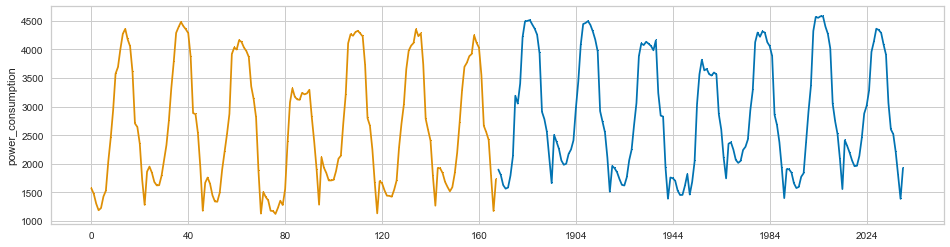

  1%|▊                                                                              | 1/100 [06:02<9:58:23, 362.67s/it]

,Description,Value
0,Session id,7224
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,99.8448,22739.4128,150.0849,0.9427,0.1041,0.0669,6.5113,4.9650
lightgbm,Light Gradient Boosting Machine,102.1164,20979.6803,144.3614,0.9471,0.1035,0.0696,6.7810,4.8580
xgboost,Extreme Gradient Boosting,106.8009,23252.9752,151.8508,0.9413,0.1071,0.0721,7.0367,4.8050
rf,Random Forest Regressor,110.6851,26292.8211,161.5029,0.9337,0.1141,0.0751,7.2532,4.6380
huber,Huber Regressor,133.4942,33648.4621,183.0932,0.9153,0.1226,0.0875,8.6024,4.7810


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,94.3150,17834.9569,133.5476,0.9517,0.0887,0.0611,6.0809
1,92.4440,21885.6769,147.9381,0.9489,0.1028,0.0639,6.0576
2,105.0854,24935.0218,157.9083,0.9330,0.1032,0.0670,6.6162
3,111.0816,28309.2587,168.2536,0.9322,0.1248,0.0764,7.5476
4,93.7167,17455.0643,132.1176,0.9591,0.0957,0.0641,6.1784
5,109.0480,23750.5490,154.1121,0.9400,0.1123,0.0781,7.5054
6,93.9492,17604.5439,132.6821,0.9510,0.0942,0.0633,6.2470
7,90.1153,15806.7703,125.7250,0.9597,0.0819,0.0564,5.6049
8,100.5850,20120.0640,141.8452,0.9477,0.1045,0.0682,6.5133


Transformation Pipeline and Model Successfully Saved


[Building #2]SMAPE : nan


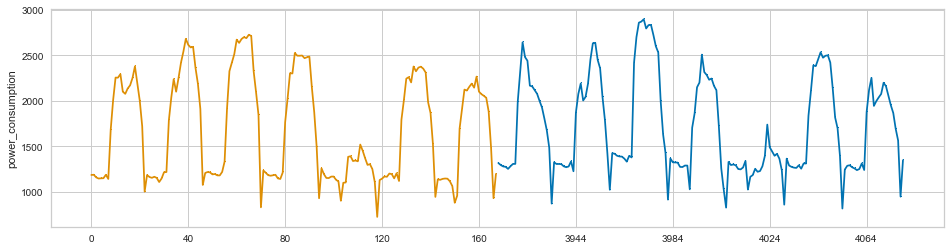

  2%|█▌                                                                             | 2/100 [11:59<9:46:48, 359.27s/it]

,Description,Value
0,Session id,7474
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,115.9042,34618.4984,184.6636,0.9131,0.1086,0.0770,7.4623,4.5200
xgboost,Extreme Gradient Boosting,116.5723,34912.8545,184.4992,0.9121,0.1107,0.0781,7.5921,4.8080
et,Extra Trees Regressor,126.9823,44295.6213,207.7657,0.8889,0.1246,0.0857,8.1840,5.0100
rf,Random Forest Regressor,130.3687,43842.9156,206.7549,0.8905,0.1245,0.0879,8.4377,5.0000
huber,Huber Regressor,187.0537,81966.1727,284.1674,0.7946,0.1679,0.1278,12.0297,4.8910


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,98.5662,24601.2232,156.8478,0.9395,0.0838,0.0587,6.0022
1,134.5816,58129.8462,241.1013,0.8592,0.1360,0.0924,8.4713
2,108.6911,29894.7883,172.9011,0.9375,0.1082,0.0741,7.3215
3,105.3851,26293.3703,162.1523,0.9191,0.0940,0.0683,6.9051
4,106.2178,29988.6851,173.1724,0.9317,0.0968,0.0702,6.7749
5,112.6994,29741.4894,172.4572,0.9356,0.1013,0.0698,6.9506
6,108.7826,24187.4431,155.5231,0.9301,0.0992,0.0752,7.2260
7,120.4936,35403.9650,188.1594,0.9091,0.1069,0.0780,7.5583
8,112.4350,35752.6576,189.0837,0.9155,0.1213,0.0797,7.4790


Transformation Pipeline and Model Successfully Saved


[Building #3]SMAPE : nan


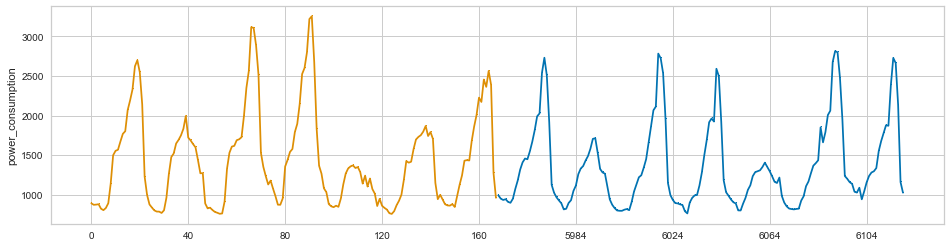

  3%|██▎                                                                            | 3/100 [17:53<9:37:09, 357.01s/it]

,Description,Value
0,Session id,1120
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,33.4717,1894.5318,43.2746,0.9763,0.0457,0.0352,3.5069,4.4690
xgboost,Extreme Gradient Boosting,33.6198,1957.6477,43.9799,0.9755,0.0469,0.0356,3.5533,4.8970
et,Extra Trees Regressor,35.3096,2215.1446,46.6624,0.9723,0.0510,0.0380,3.7834,4.9200
rf,Random Forest Regressor,37.2431,2361.9009,48.2942,0.9704,0.0514,0.0395,3.9309,5.0100
huber,Huber Regressor,41.8583,2889.2036,53.6143,0.9639,0.0561,0.0438,4.3579,4.9340


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,37.7525,2316.3419,48.1284,0.9704,0.0491,0.0394,3.9456
1,26.6093,1300.0424,36.0561,0.9858,0.0369,0.0277,2.7544
2,30.3393,1498.8770,38.7153,0.9806,0.0386,0.0307,3.0852
3,28.9308,1376.2488,37.0978,0.9828,0.0362,0.0287,2.8673
4,33.6508,1890.4426,43.4792,0.9755,0.0478,0.0370,3.6980
5,34.0254,1892.7537,43.5058,0.9763,0.0432,0.0340,3.4064
6,37.4186,2700.9407,51.9706,0.9661,0.0620,0.0416,4.0539
7,33.3696,1837.4459,42.8654,0.9760,0.0462,0.0360,3.5992
8,30.2971,1375.7905,37.0917,0.9836,0.0413,0.0331,3.2857


Transformation Pipeline and Model Successfully Saved


[Building #4]SMAPE : nan


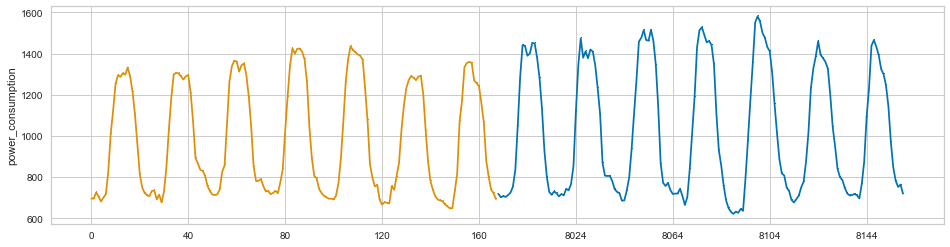

  4%|███▏                                                                           | 4/100 [23:48<9:29:43, 356.07s/it]

,Description,Value
0,Session id,6062
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,113.8428,48903.1299,216.1811,0.9816,0.0759,0.0431,4.1595,4.9200
xgboost,Extreme Gradient Boosting,123.8631,53650.4328,227.8838,0.9798,0.0762,0.0461,4.5105,5.0920
lightgbm,Light Gradient Boosting Machine,131.0458,58161.1224,235.1803,0.9778,0.0821,0.0504,4.8441,4.6600
rf,Random Forest Regressor,137.2520,77759.0395,270.1077,0.9707,0.0923,0.0527,5.0183,4.9310
huber,Huber Regressor,155.9369,86379.2121,286.7547,0.9681,0.0984,0.0601,5.7688,4.9320


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,99.1133,36578.9974,191.2564,0.9889,0.0575,0.0337,3.4092
1,127.2732,48986.7033,221.3294,0.9827,0.0716,0.0462,4.4678
2,109.2508,31804.7140,178.3388,0.9873,0.0646,0.0419,4.1979
3,107.3831,36834.3176,191.9227,0.9883,0.0625,0.0376,3.7300
4,127.3174,61733.2884,248.4618,0.9794,0.0916,0.0494,4.5835
5,99.1114,34903.8740,186.8258,0.9828,0.0672,0.0401,3.9026
6,93.9499,24680.1278,157.0991,0.9939,0.0458,0.0306,3.0578
7,96.2034,23937.3102,154.7169,0.9906,0.0557,0.0373,3.6572
8,130.0798,70886.1377,266.2445,0.9713,0.1048,0.0529,5.0463


Transformation Pipeline and Model Successfully Saved


[Building #5]SMAPE : nan


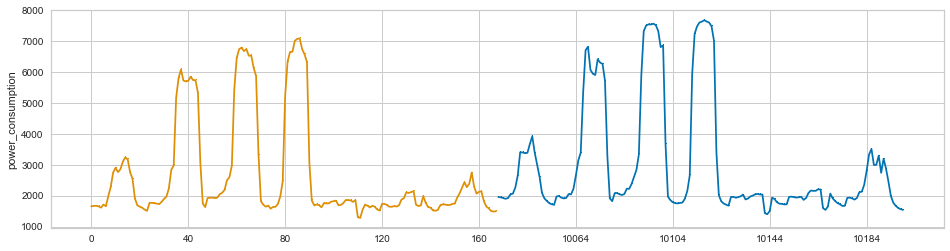

  5%|███▉                                                                           | 5/100 [29:52<9:28:25, 359.00s/it]

,Description,Value
0,Session id,7690
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,59.8964,8194.2704,90.2354,0.9859,0.0431,0.0308,3.0647,4.6880
et,Extra Trees Regressor,58.9869,8591.1071,92.1056,0.9852,0.0473,0.0316,3.1404,4.9160
xgboost,Extreme Gradient Boosting,61.0623,8053.6194,89.3666,0.9862,0.0438,0.0318,3.1741,4.8710
rf,Random Forest Regressor,67.4287,10571.5810,102.2206,0.9819,0.0500,0.0351,3.4874,4.9910
huber,Huber Regressor,79.2461,14679.6338,120.2912,0.9747,0.0557,0.0403,3.9692,5.0180


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,61.7618,9404.8574,96.9786,0.9841,0.0445,0.0308,3.0591
1,53.0151,6039.3719,77.7134,0.9889,0.0432,0.0302,2.9765
2,51.3156,6213.2274,78.8240,0.9889,0.0387,0.0262,2.6295
3,53.6090,7387.1921,85.9488,0.9867,0.0424,0.0289,2.8503
4,63.6751,9130.8190,95.5553,0.9846,0.0449,0.0316,3.1445
5,57.9219,8156.2482,90.3119,0.9848,0.0468,0.0311,3.1163
6,60.1296,7589.9055,87.1201,0.9868,0.0417,0.0300,2.9814
7,54.7601,7783.4048,88.2236,0.9874,0.0436,0.0290,2.8858
8,49.5220,5395.1489,73.4517,0.9914,0.0384,0.0271,2.7027


Transformation Pipeline and Model Successfully Saved


[Building #6]SMAPE : nan


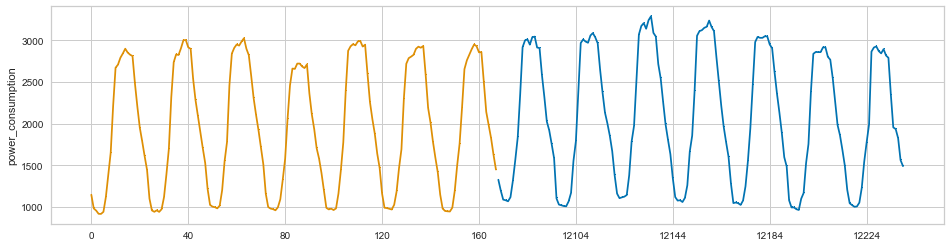

  6%|████▋                                                                          | 6/100 [35:57<9:25:29, 360.96s/it]

,Description,Value
0,Session id,3869
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,40.1388,4221.9162,63.6919,0.9499,0.0867,0.0555,5.4747,4.9220
lightgbm,Light Gradient Boosting Machine,41.6939,3800.2348,61.0529,0.9546,0.0828,0.0578,5.6969,4.6670
xgboost,Extreme Gradient Boosting,42.7153,4090.4217,63.4344,0.9513,0.0853,0.0584,5.7570,4.6780
rf,Random Forest Regressor,46.8692,5348.4062,72.2469,0.9361,0.0974,0.0646,6.3380,5.0920
huber,Huber Regressor,61.1634,7727.4650,87.4304,0.9077,0.1233,0.0851,8.4811,4.9080


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,45.5622,4210.5217,64.8885,0.9474,0.0903,0.0626,6.1195
1,40.6423,3408.1526,58.3794,0.9610,0.0852,0.0569,5.7369
2,41.6644,6654.4757,81.5750,0.9234,0.0933,0.0517,5.2862
3,47.7231,5260.4907,72.5292,0.9309,0.1135,0.0729,6.7611
4,35.1128,2478.1423,49.7809,0.9720,0.0671,0.0480,4.7370
5,37.3856,2764.7326,52.5807,0.9646,0.0750,0.0539,5.2876
6,36.1642,2664.8388,51.6221,0.9647,0.0697,0.0495,4.9738
7,34.4689,2211.4675,47.0262,0.9732,0.0621,0.0467,4.5837
8,36.1409,3292.9729,57.3844,0.9659,0.0700,0.0473,4.6990


Transformation Pipeline and Model Successfully Saved


[Building #7]SMAPE : nan


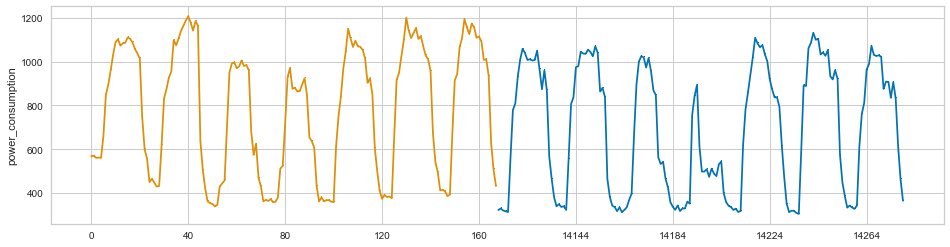

  7%|█████▌                                                                         | 7/100 [41:59<9:19:54, 361.23s/it]

,Description,Value
0,Session id,6470
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,51.7071,4921.4194,69.8797,0.8361,0.0539,0.0399,3.9643,4.6770
xgboost,Extreme Gradient Boosting,52.3728,5053.0419,70.7916,0.8319,0.0542,0.0401,3.9959,4.5080
et,Extra Trees Regressor,52.4154,5279.0995,72.4067,0.8242,0.0555,0.0403,4.0006,4.8620
rf,Random Forest Regressor,54.6391,5409.1303,73.2535,0.8197,0.0565,0.0422,4.1881,4.9560
huber,Huber Regressor,57.5991,6354.3371,79.1451,0.7885,0.0615,0.0448,4.4274,4.9100


,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE
Fold,,,,,,,
0,51.1593,4734.5954,68.8084,0.8387,0.0528,0.0390,3.9022
1,57.9885,6571.2410,81.0632,0.7644,0.0605,0.0440,4.3996
2,42.8178,3536.4701,59.4682,0.8781,0.0439,0.0321,3.1880
3,44.0211,3445.9158,58.7019,0.9073,0.0452,0.0335,3.3407
4,54.0758,5582.8807,74.7187,0.7818,0.0565,0.0410,4.1141
5,49.6803,4657.4852,68.2458,0.8264,0.0537,0.0386,3.8510
6,51.6511,4852.2017,69.6577,0.8571,0.0537,0.0402,3.9649
7,49.7321,4676.3816,68.3841,0.8597,0.0565,0.0400,3.9453
8,50.0346,4307.4798,65.6314,0.8605,0.0500,0.0382,3.7811


Transformation Pipeline and Model Successfully Saved


[Building #8]SMAPE : nan


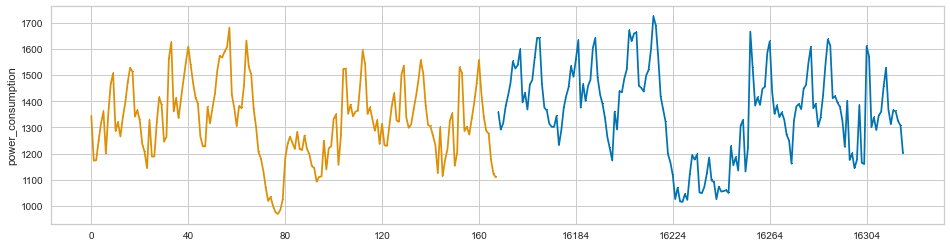

  8%|██████▎                                                                        | 8/100 [47:54<9:10:45, 359.19s/it]

,Description,Value
0,Session id,6238
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,18
8,Preprocess,True
9,Imputation type,simple


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,01:02:06
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
et,Extra Trees Regressor,60.8172,9018.6441,93.9319,0.9877,0.0420,0.0278,2.7591,4.9100
xgboost,Extreme Gradient Boosting,64.6353,9095.3362,94.7094,0.9875,0.0415,0.0289,2.8727,4.7990


Processing:   0%|          | 0/26 [00:00<?, ?it/s]

In [ ]:
for i in tqdm(range(100)):
    # train 데이터 전처리
    train_5 = train.loc[train.building_number == i+1,]
    train_5 = train_5.drop(columns = 'building_number')
    
    # x, y 분리
    train_y = train_5.power_consumption
    train_x = train_5.drop(columns = 'power_consumption')
    
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)

    col =['temperature', 'windspeed', 'humidity',
            'day', 'month', 'day_of_week', 'cos_time',
           'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
           'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
           'CDH', 'sensory_temperature']
    
    x_train['holiday'] = x_train.holiday.astype('category')
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(x_train)
    
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns = col)
    X_train_scaled_df['power_consumption'] = list(y_train)
    
    # pycaret setup
    exp = setup(X_train_scaled_df, target = 'power_consumption')
    exp.add_metric('smape', 'SMAPE', custom_metrics, greater_is_better = False)
    
    # MAPE를 기준으로 상위 2개의 모델 저장
    models = compare_models(sort='SMAPE', n_select=2, include = ['xgboost', 'et', 'lightgbm', 'rf', 'huber'])
    
    # 상위 2개 모델 blend
    blender = blend_models(estimator_list =models)
    
    building_model_name = "Building_" + str(i+1) + "_model"
    
    # 모델 저장
    save_model(blender, building_model_name)
    
    # 모델 완성
    model_final = finalize_model(blender)
    
    x_valid['holiday'] = x_valid.holiday.astype('category')
    x_valid_scaled = pd.DataFrame(x_valid, columns = col)
    x_valid_scaled = scaler.fit_transform(x_valid_scaled)
    
    x_valid_scaled = pd.DataFrame(x_valid_scaled, columns = col)
    
    # 예측
    submit_df = predict_model(model_final,data = x_valid_scaled)

    def smape(true, pred):
        v = 2 * abs(pred - true) / (abs(pred) + abs(true))
        output = np.mean(v) * 100
        return output
    
    print(f"[Building #{i+1}]SMAPE : {smape(y_valid, submit_df.prediction_label)}")

    plot_series(y_valid,submit_df.prediction_label , markers=[',' , ','])
    plt.show()


In [51]:
X_train_scaled_df['power_consumption'] = list(y_train)

In [52]:
X_train_scaled_df

,temperature,windspeed,humidity,day,month,day_of_week,cos_time,sin_time,holiday,month_day_hour_mean,day_hour_mean,hour_mean,hour_std,discomfort,discomfort_3,discomfort_5,CDH,sensory_temperature,power_consumption
0,-1.974323,-1.257780,-2.476723,-1.547524,-1.099172,-0.49599,1.414214,-1.476155e-17,-0.666667,-0.789671,-0.812413,-0.932869,-1.381235,-2.401787,-0.009087,-0.011011,-0.121978,-1.833880,1170.36
1,-2.139567,-1.085234,-2.264472,-1.547524,-1.099172,-0.49599,1.366025,3.660254e-01,-0.666667,-0.814281,-0.819972,-0.947360,-1.390837,-2.522424,-0.009087,-0.011011,-0.334212,-2.025443,1146.96
2,-2.222189,-0.740141,-2.264472,-1.547524,-1.099172,-0.49599,1.224745,7.071068e-01,-0.666667,-0.832833,-0.843839,-0.967572,-1.406533,-2.594561,-0.009087,-0.011011,-0.554405,-2.162685,1115.28
3,-2.497596,-0.826414,-2.052220,-1.547524,-1.099172,-0.49599,1.000000,1.000000e+00,-0.666667,-0.872966,-0.880339,-1.018623,-1.365771,-2.822188,-1.037986,-0.011011,-0.801128,-2.417788,1107.00
4,-2.029404,0.381408,-2.405973,-1.547524,-1.099172,-0.49599,0.707107,1.224745e+00,-0.666667,-1.025043,-0.952408,-1.056071,-1.240631,-2.441241,0.189601,-0.011011,-1.002750,-2.091845,1069.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1867,0.421717,0.208862,-0.707959,0.316675,1.538840,-0.49599,0.366025,-1.366025e+00,-0.666667,1.064027,0.978681,0.673263,0.999572,0.250083,-1.666507,-1.153932,0.737571,0.410227,1779.12
1868,0.201391,-0.567595,-0.354206,0.316675,1.538840,-0.49599,0.707107,-1.224745e+00,-0.666667,0.720277,0.652665,0.296929,0.880523,0.138638,-1.521681,-0.830773,0.787977,0.203677,1553.04
1869,-0.018934,-0.740141,-0.141955,0.316675,1.538840,-0.49599,1.000000,-1.000000e+00,-0.666667,0.271934,0.023931,-0.277088,0.654705,-0.030659,-1.386773,-1.577787,0.782671,-0.007080,1216.08
1870,-0.211719,-0.136230,-0.000454,0.316675,1.538840,-0.49599,1.224745,-7.071068e-01,-0.666667,-0.991220,-1.327349,-1.590572,-0.887667,-0.198768,-1.107617,-1.573680,0.745530,-0.221047,891.36


# Building Test

## Building 3

,Description,Value
0,Session id,2238
1,Target,power_consumption
2,Target type,Regression
3,Original data shape,"(1872, 19)"
4,Transformed data shape,"(1872, 19)"
5,Transformed train set shape,"(1310, 19)"
6,Transformed test set shape,"(562, 19)"
7,Numeric features,17
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,SMAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,110.1255,31962.6419,176.9544,0.9184,0.1089,0.0755,7.2727,4.4960
xgboost,Extreme Gradient Boosting,109.7283,31836.4719,177.6012,0.9185,0.1095,0.0752,7.3181,4.6280


SMAPE: 11.644034709365393


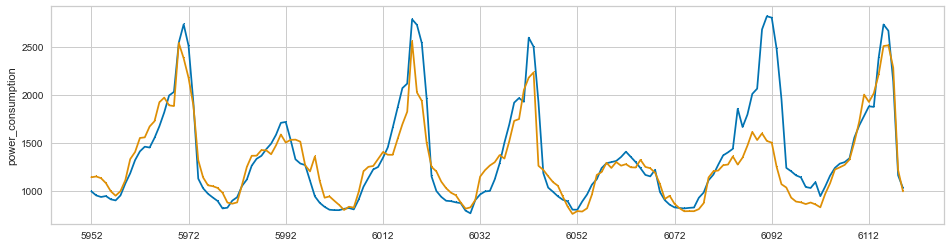

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [20]:
train3_1 = train.loc[train.building_number == 3,]
train3_1 = train3_1.drop(columns = 'building_number')

train_y = train3_1.power_consumption
train_x = train3_1.drop(columns = 'power_consumption')

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = 168)

col =['temperature', 'windspeed', 'humidity',
        'day', 'month', 'day_of_week', 'cos_time',
       'sin_time', 'holiday', 'month_day_hour_mean', 'day_hour_mean',
       'hour_mean', 'hour_std', 'discomfort', 'discomfort_3', 'discomfort_5',
       'CDH', 'sensory_temperature']

# train_merged = x_train + y_train : setup에는 x+y 형태의 데이터 사용
train_merged = pd.DataFrame(x_train, columns = col)
train_merged['power_consumption'] = y_train
train_merged

exp = setup(train_merged, target = 'power_consumption')
exp.add_metric('smape', 'SMAPE', custom_metrics, greater_is_better = False)

models = compare_models(sort = 'SMAPE', include = ['lightgbm', 'xgboost'])

model_final = finalize_model(models)
submit_df = predict_model(model_final, data = x_valid)

print(f"SMAPE: {custom_metrics(y_valid, submit_df.prediction_label)}")
plot_series(y_valid,submit_df.prediction_label , markers=[',' , ','])
plt.show()

evaluate_model(model_final)
